In [1]:
%load_ext rpy2.ipython

import os
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText
import copy

from cogdl import experiment
from cogdl.utils import set_random_seed

import gsim
from utils import eval_acc, eval_confidence, eval_entropy

plt.rcParams['figure.figsize'] = (15.0, 14.0)

## Construct data

In [2]:
# acceptable seeds: 1 2 4 8 

In [3]:
from cogdl.datasets.customized_data import generate_random_graph
from cogdl.datasets import build_dataset_from_path

num_nodes = 500
set_random_seed(4)
data = generate_random_graph(num_nodes=num_nodes, num_edges=2000, num_feats=2)
data_path = "/home/stanislas/dataset/"
dataset_name = "cora"
dataset = build_dataset_from_path(data_path=data_path, dataset=dataset_name)
dataset.data = data

In [4]:
rho = torch.sqrt(dataset.data.x[:, 0] ** 2 + dataset.data.x[:, 1] ** 2)
lower_bound, upper_bound = 1.2, 1.2
dataset.data.y[rho < lower_bound] = 0
dataset.data.y[rho > upper_bound] = 1
distance_bernoulli = (rho <= upper_bound) * (rho >= lower_bound)
rho = rho / rho.max()
dataset.data.y[distance_bernoulli] = torch.bernoulli(rho[distance_bernoulli]).long()
dataset.data.y.float().mean()

tensor(0.5100)

In [5]:
distance = torch.zeros((num_nodes, num_nodes))
edge_x = []
edge_y = []
adj = torch.zeros((num_nodes, num_nodes))

for i in range(num_nodes):
    for j in range(i + 1, num_nodes):
        distance[i, j] = torch.sqrt((dataset.data.x[i, 0] - dataset.data.x[j, 0]) ** 2 + (dataset.data.x[i, 1] - dataset.data.x[j, 1]) ** 2)
        distance[j, i] = distance[i, j]
    prev_edge_num = adj[i, :i].sum().int().item()
    edges = distance[i, i + 1:]
    edges_indexed = [(edges[i], i) for i in range(len(edges))]
    edges_indexed.sort()
    edge_num = min(np.random.randint(2, 5) - prev_edge_num, len(edges))
    if edge_num > 0:
        for j in range(edge_num):
            neigh_idx = edges_indexed[j][1] + i + 1
#             if dataset.data.y[j] != dataset.data.y[neigh_idx]:
#                 roulette = np.random.randint(5)
#                 if roulette < 3:
#                     continue
#                 continue
            edge_x.append(i)
            edge_x.append(neigh_idx)
            edge_y.append(neigh_idx)
            edge_y.append(i)
            adj[i, neigh_idx] = 1
            adj[neigh_idx, i] = 1
dataset.data.edge_index = (torch.tensor(edge_x), torch.tensor(edge_y))
len(edge_x)

1614

In [6]:
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv, spsolve
from scipy.linalg import pinv
from scipy.linalg.interpolative import estimate_rank
A = csr_matrix((dataset.data.edge_weight, (np.array(dataset.data.edge_index[0]), np.array(dataset.data.edge_index[1]))), dtype=float, shape=(dataset.data.num_nodes, dataset.data.num_nodes))
Ainv = pinv(A.todense())
# dataset.data.x = torch.tensor(np.eye(dataset.data.num_nodes) - Ainv).float() @ dataset.data.x
# for _ in range(5):
#     dataset.data.x += 0.1 * A @ dataset.data.x
gen_coef = 0.3
dataset.data.x += (gen_coef * A + gen_coef ** 2 * A @ A + gen_coef ** 3 * A @ A @ A) @ dataset.data.x
dataset.data.x = dataset.data.x.float()
dataset.data.sym_norm()

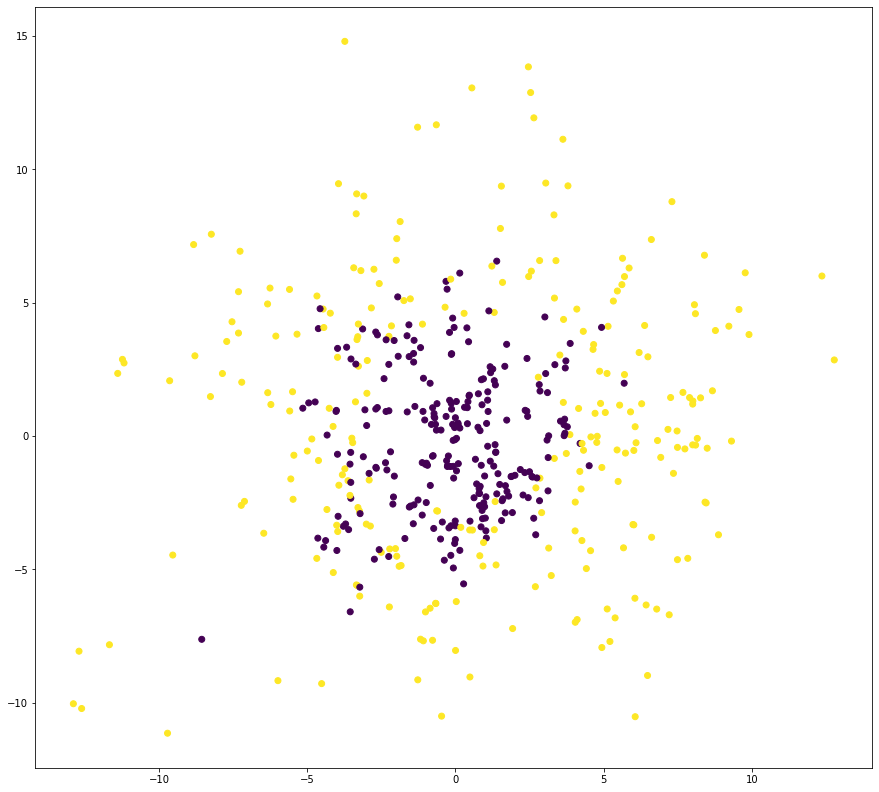

In [7]:
plt.scatter(dataset.data.x[:, 0], dataset.data.x[:, 1], c=dataset.data.y)
# sample = [0, 329, 1, 120]
# for i in sample:
#     plt.annotate("node {}".format(i), (dataset.data.x[i, 0] + 0.01, dataset.data.x[i, 1] + 0.01))
plt.show()

In [8]:
checkpoint_dir = "./checkpoints/{}".format(dataset_name)
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

In [9]:
f_train = dataset.data.x[dataset.data.train_mask]
f_test = dataset.data.x[dataset.data.test_mask]
f_val = dataset.data.x[dataset.data.val_mask]
is_train = np.concatenate((np.zeros(f_train.shape[0]), np.ones(f_test.shape[0])))
dim1 = dataset.data.x[:, 0][dataset.data.train_mask + dataset.data.test_mask]
dim2 = dataset.data.x[:, 1][dataset.data.train_mask + dataset.data.test_mask]
# y = dataset.data.y[dataset.data.train_mask + dataset.data.test_mask]
df = pd.DataFrame({"train": is_train, "dim1": dim1, "dim2": dim2})

In [10]:
%%R -i df -o dfm_tr -o dfm_x -o match_t -o match_c

library(Matching)
# df[, 2:3]
matched <- Match(Tr = df$train, X = as.matrix(df[, 2:3]))
# summary(matched)
# MatchBalance(train ~ ., data = df, match.out = matched)
# print(df)
dfm <- matched$mdata
dfm_tr <- dfm$Tr
dfm_x <- dfm$X
match_t <- matched$index.treated
match_c <- matched$index.control

R[write to console]: Loading required package: MASS

R[write to console]: ## 
##  Matching (Version 4.9-11, Build Date: 2021-10-18)
##  See http://sekhon.berkeley.edu/matching for additional documentation.
##  Please cite software as:
##   Jasjeet S. Sekhon. 2011. ``Multivariate and Propensity Score Matching
##   Software with Automated Balance Optimization: The Matching package for R.''
##   Journal of Statistical Software, 42(7): 1-52. 
##




## Build model

In [11]:
from custom_models.mlp import MLP
from custom_models.gcn import GCN

hidden_size = 64
num_layers = 2
dropout = 0.5
model_type = 'mlp'
residual = False
if residual:
    model_name = "model_{}_res_{}_{}".format(model_type, hidden_size, num_layers)
else:
    model_name = "model_{}_{}_{}".format(model_type, hidden_size, num_layers)
checkpoint_path = os.path.join(checkpoint_dir, "{}.pt".format(model_name))

model = MLP(in_feats=dataset.num_features,
                hidden_size=hidden_size,
                out_feats=dataset.num_classes,
                num_layers=num_layers,
#                 residual=residual,
                dropout=dropout)
model

MLP(
  (activation): ReLU()
  (mlp): ModuleList(
    (0): Linear(in_features=2, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=2, bias=True)
  )
)

In [12]:
experiment(model=model, dataset=dataset, checkpoint_path=checkpoint_path, seed=[0])

Namespace(actnn=False, checkpoint_path='./checkpoints/cora/model_mlp_64_2.pt', cpu=False, cpu_inference=False, dataset=['Cora'], devices=[0], distributed=False, dw='node_classification_dw', epochs=500, eval_step=1, fp16=False, load_emb_path=None, local_rank=0, log_path='.', logger=None, lr=0.01, master_addr='localhost', master_port=13425, max_epoch=None, model=['MLP'], mw='node_classification_mw', n_trials=3, n_warmup_steps=0, no_test=False, nstage=1, patience=100, progress_bar='epoch', project='cogdl-exp', resume_training=False, rp_ratio=1, save_emb_path=None, seed=[0], split=[0], unsup=False, use_best_config=False, weight_decay=0)
 
|----------------------------------------------------------------------------------------|
    *** Running (`Cora`, `MLP`, `node_classification_dw`, `node_classification_mw`)
|----------------------------------------------------------------------------------------|
Model Parameters: 322


Epoch: 158, train_loss:  0.3303, val_acc:  0.8350:  32%|███▏      | 158/500 [00:00<00:01, 240.91it/s]


Saving 59-th model to ./checkpoints/cora/model_mlp_64_2.pt ...
Loading model from ./checkpoints/cora/model_mlp_64_2.pt ...
{'test_acc': 0.8, 'val_acc': 0.855}
| Variant       | test_acc      | val_acc       |
|---------------|---------------|---------------|
| (Cora, 'MLP') | 0.8000±0.0000 | 0.8550±0.0000 |


defaultdict(list,
            {(Cora, MLP(
                (activation): ReLU()
                (mlp): ModuleList(
                  (0): Linear(in_features=2, out_features=64, bias=True)
                  (1): Linear(in_features=64, out_features=2, bias=True)
                )
              )): [{'test_acc': 0.8, 'val_acc': 0.855}]})

## Eval

In [13]:
from cogdl.wrappers.model_wrapper.node_classification import NodeClfModelWrapper
from cogdl.utils import spmm

model_wrapper = NodeClfModelWrapper(model, None)
model_wrapper.load_state_dict(torch.load(checkpoint_path))
model = model_wrapper.model
model.eval()

MLP(
  (activation): ReLU()
  (mlp): ModuleList(
    (0): Linear(in_features=2, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=2, bias=True)
  )
)

In [14]:
pred = model.forward(dataset.data)
train_acc, val_acc, test_acc = eval_acc(pred, dataset)

ACC: Train 0.8600 | Val 0.8550 | Test 0.8000


In [15]:
label_pred = torch.argmax(pred, axis=1)
height = (pred[:, 1] - pred[:, 0]).detach()
label_pred.float().mean()

tensor(0.5780)

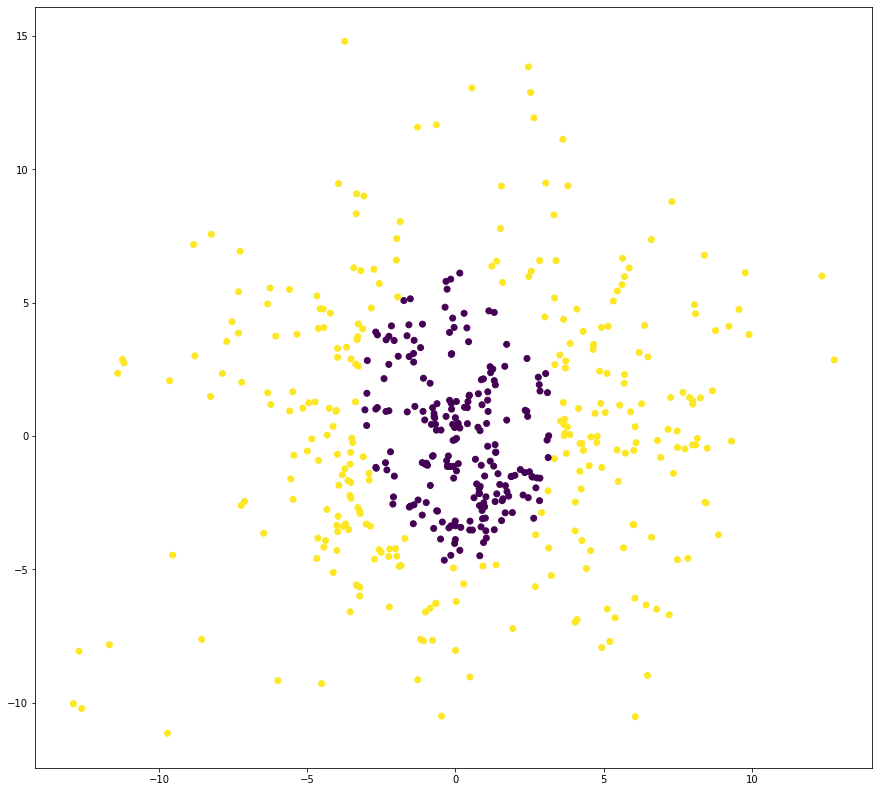

In [16]:
plt.scatter(dataset.data.x[:, 0], dataset.data.x[:, 1], c=label_pred)
plt.show()

In [17]:
# x = np.arange(dataset.data.x[:, 0].min() - 0.5, dataset.data.x[:, 0].max() + 0.5, 0.1)
# y = np.arange(dataset.data.x[:, 1].min() - 0.5, dataset.data.x[:, 1].max() + 0.5, 0.1)
boundx = (-5.5, 5.5)
boundy = (-7.5, 11.5)
x = np.arange(*boundx, 0.1)
y = np.arange(*boundy, 0.1)
X, Y = np.meshgrid(x, y)
featXY = torch.tensor(np.concatenate((np.expand_dims(X, -1), np.expand_dims(Y, -1)), -1)).float()
Z = model.forward(featXY)
Z = torch.nn.functional.softmax(Z, dim=-1)
Z = Z[:, :, 1]


In [18]:
contour_x = x
contour_y = y
contour_Z = Z.reshape(X.shape).detach().cpu()

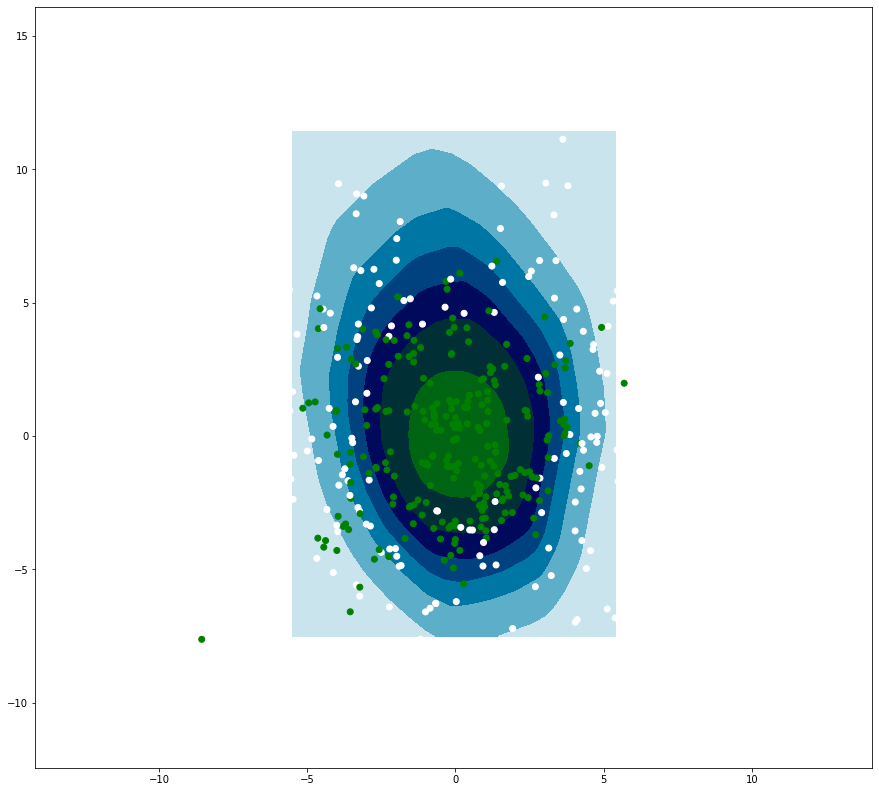

In [19]:
plt.contourf(x, y, Z.reshape(X.shape).detach().cpu(), cmap='ocean')
plt.scatter(dataset.data.x[:, 0], dataset.data.x[:, 1], c=dataset.data.y, cmap='ocean')
plt.show()

## Propagation

In [20]:
rand_mask = np.random.choice([True, False], size=num_nodes, p=[0.4, 0.6])

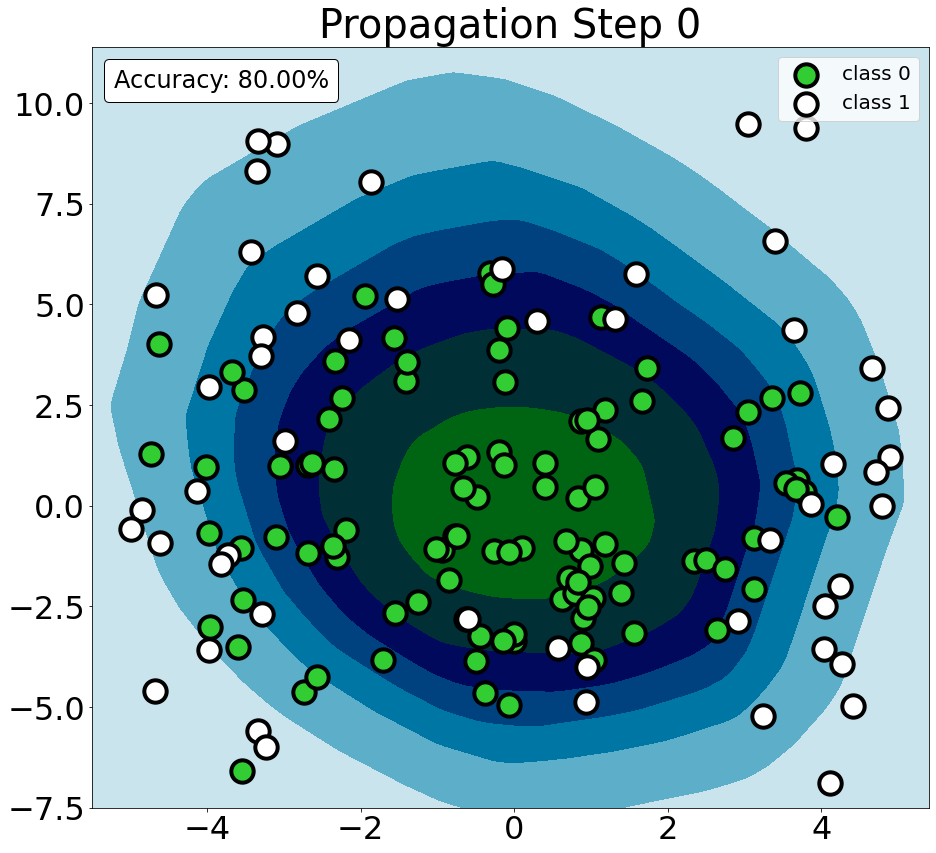

(array([ 43, 104, 394, 455]),)


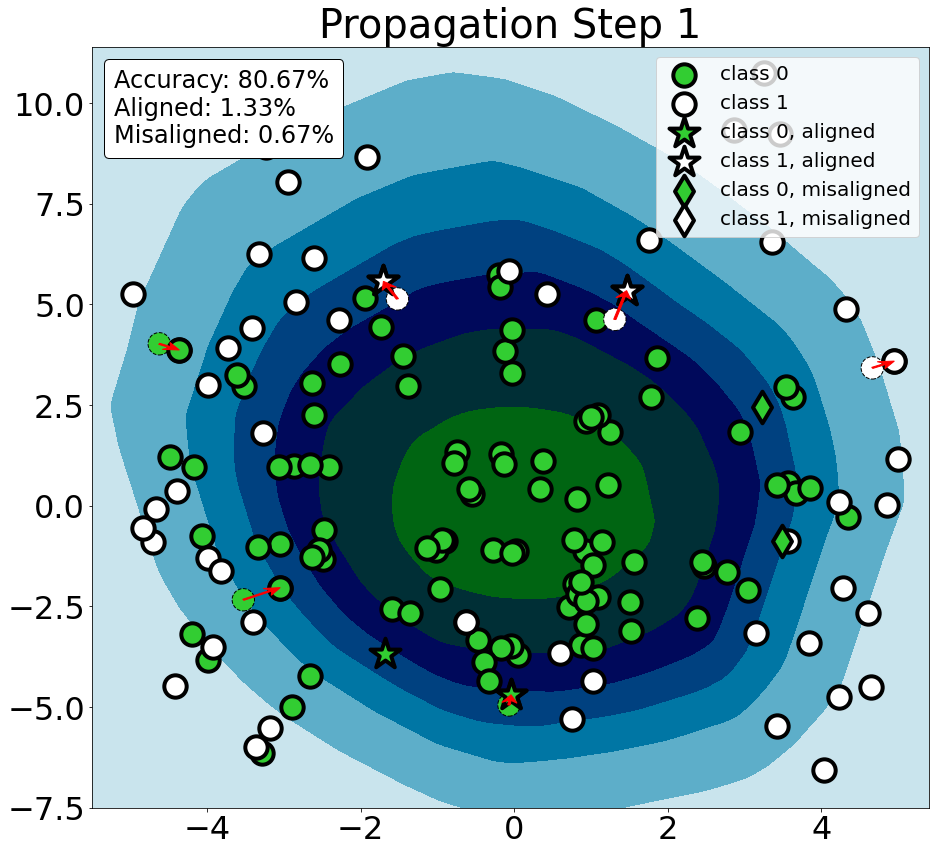

(array([ 15, 345, 389, 390]),)


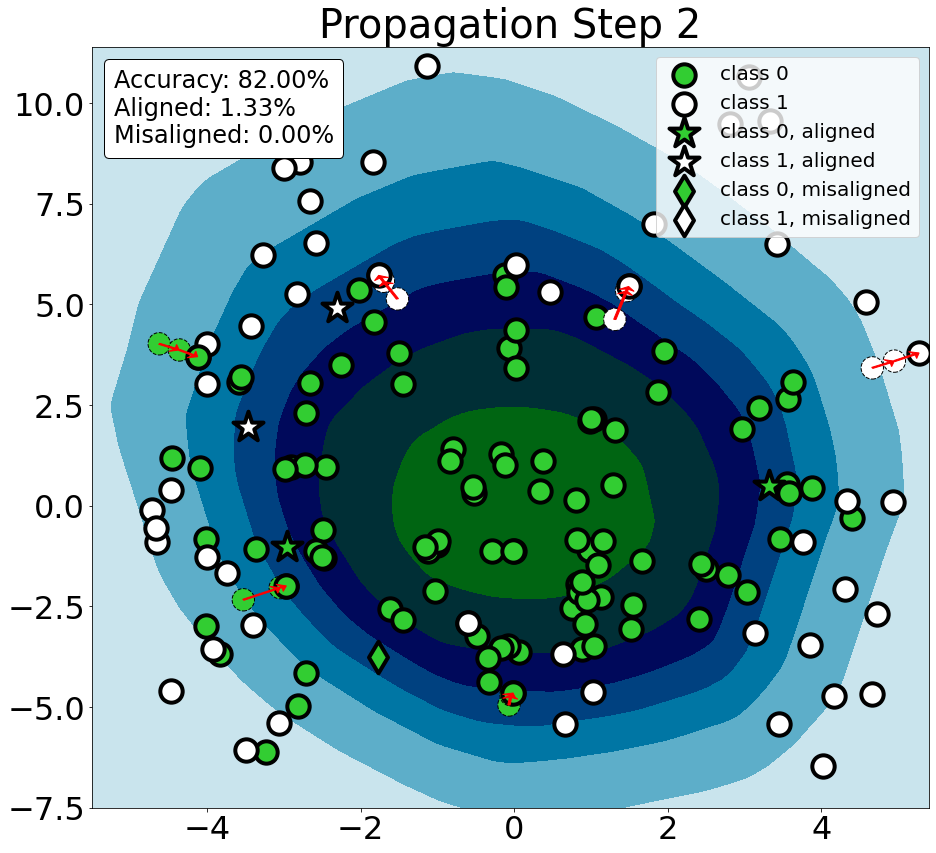

(array([437]),)


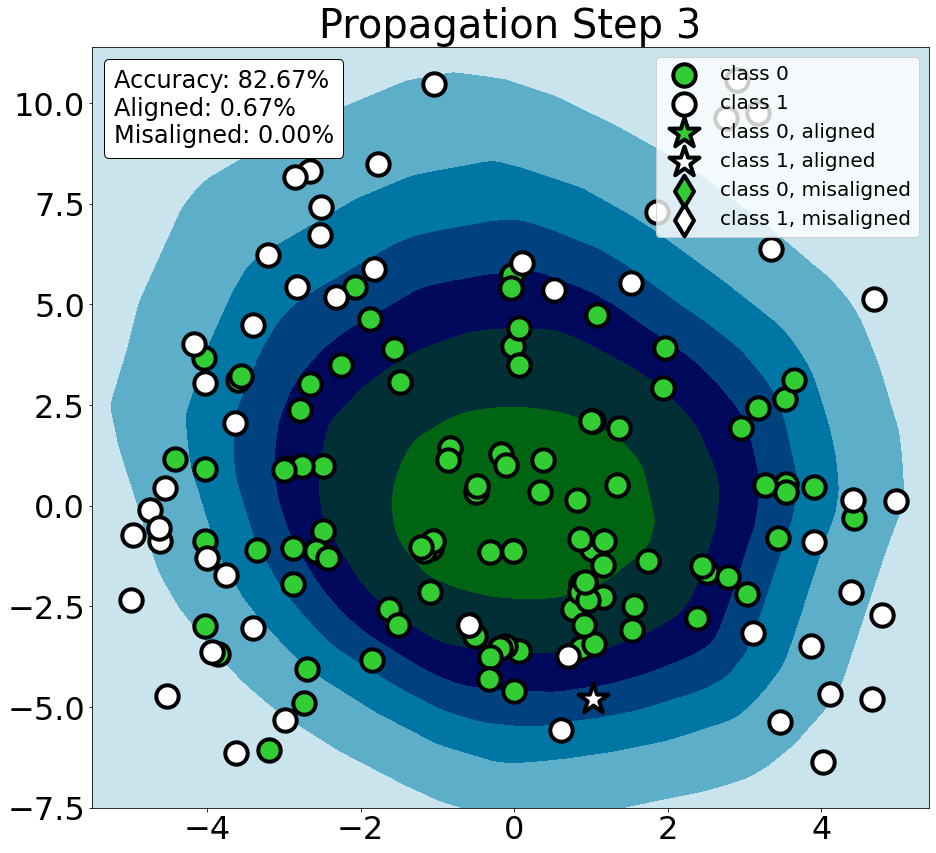

(array([], dtype=int64),)


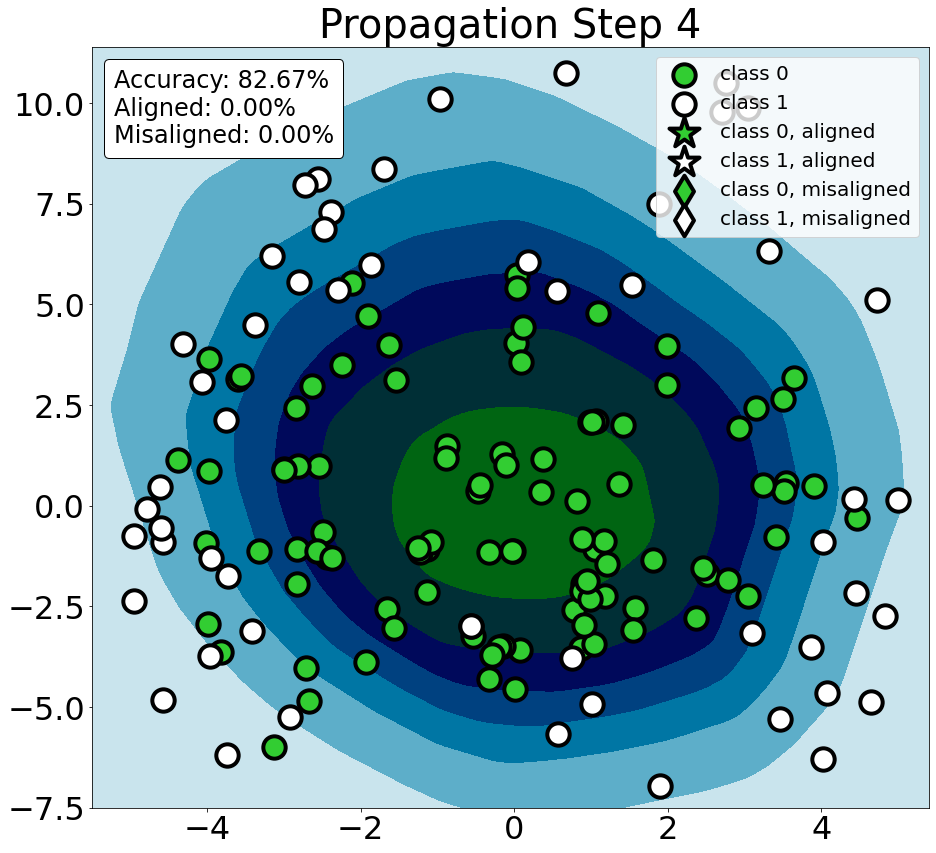

(array([], dtype=int64),)


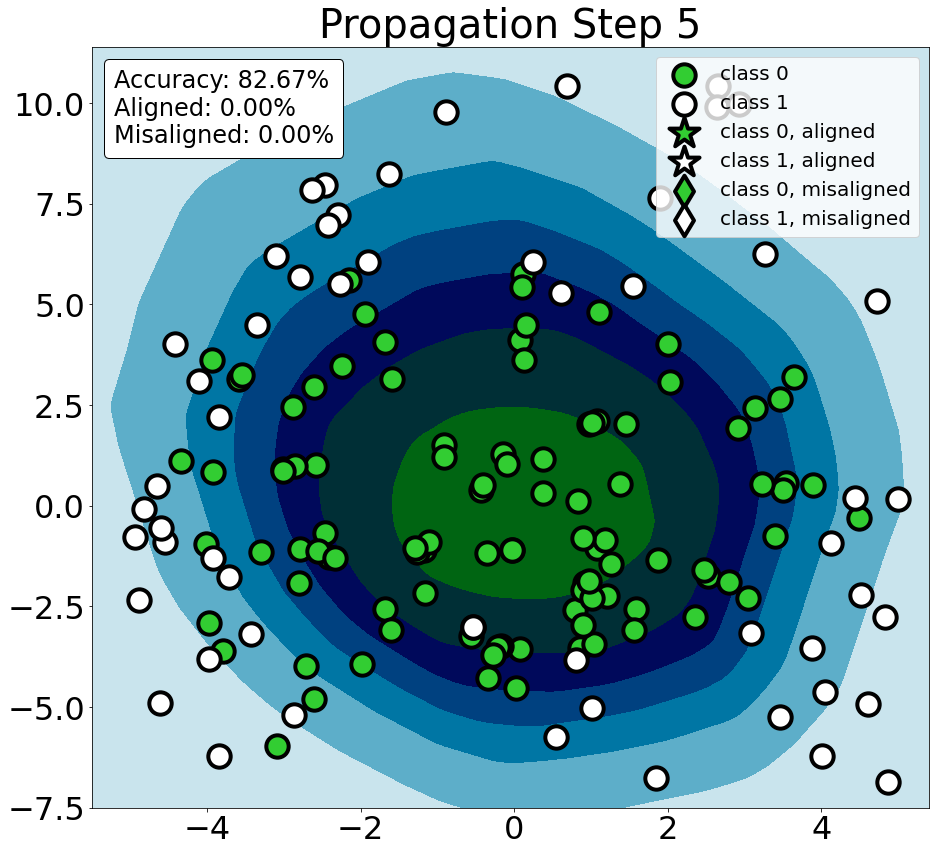

(array([], dtype=int64),)


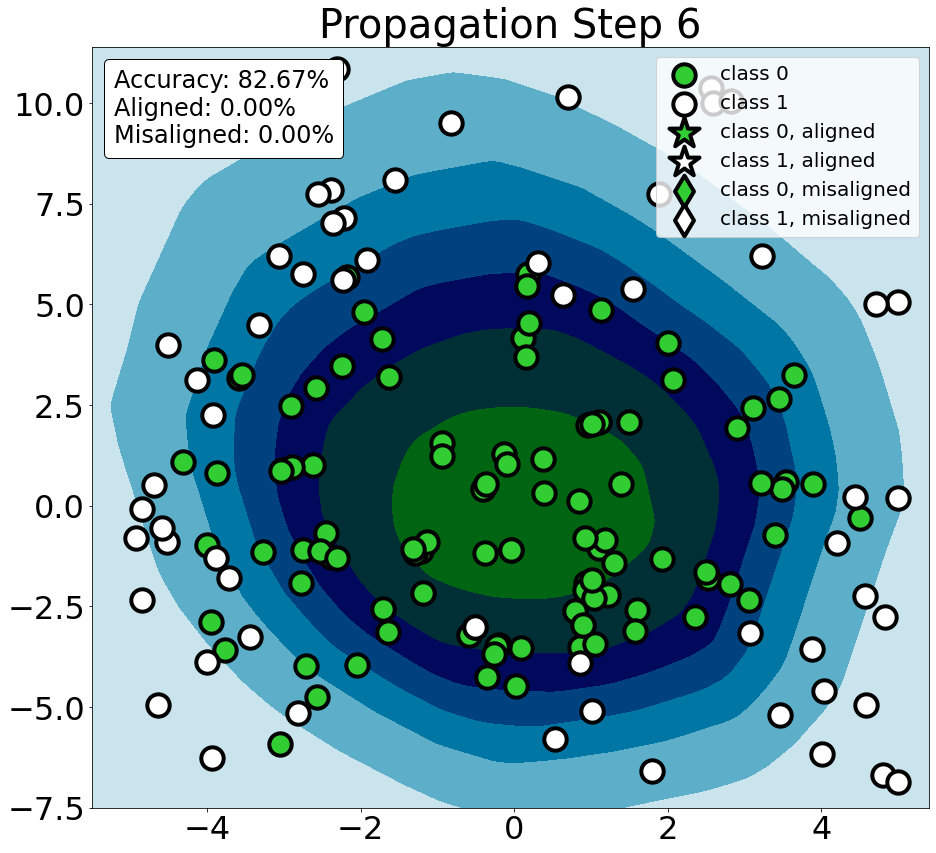

(array([321]),)


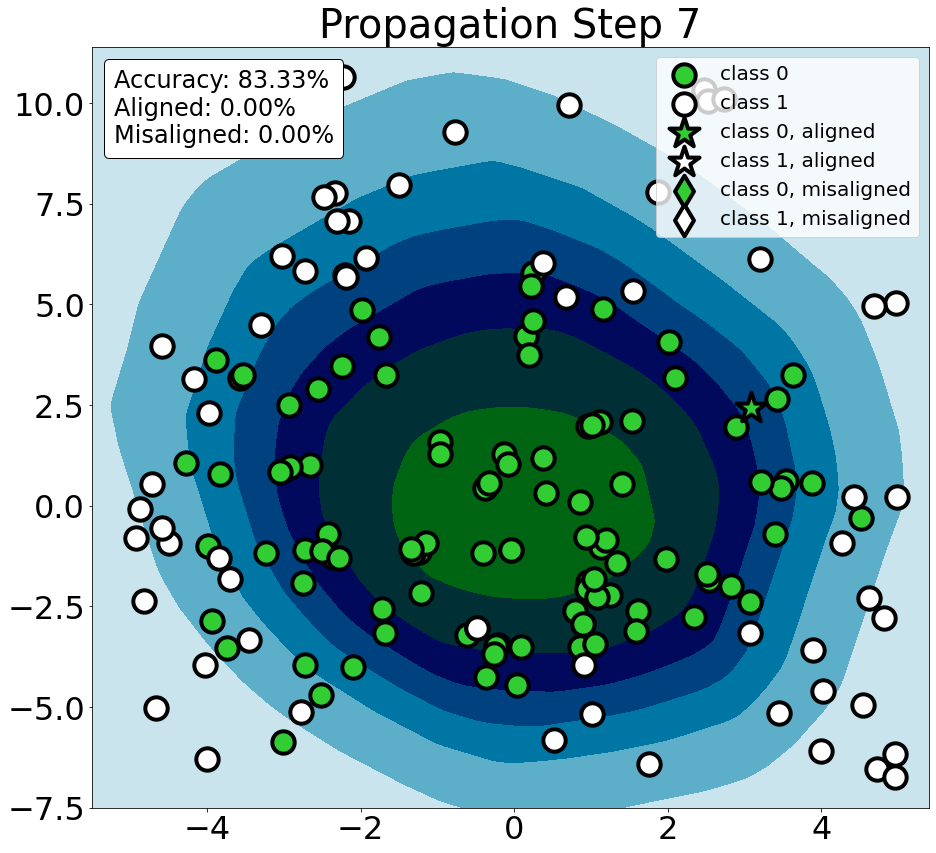

(array([], dtype=int64),)


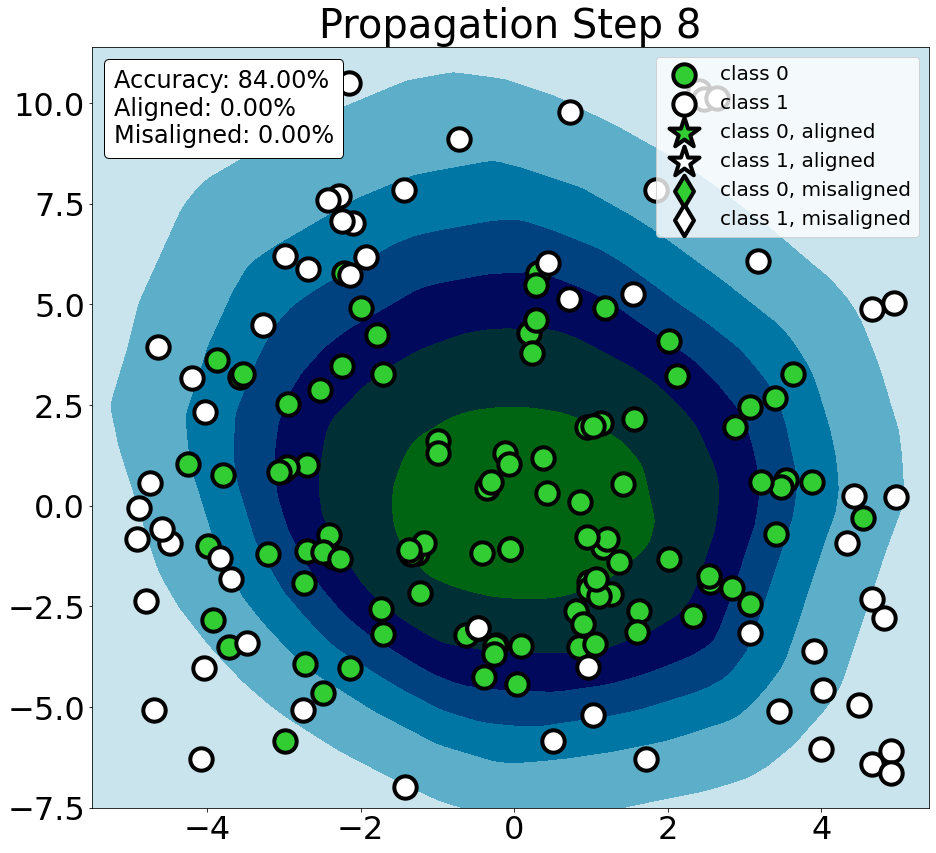

(array([343]),)


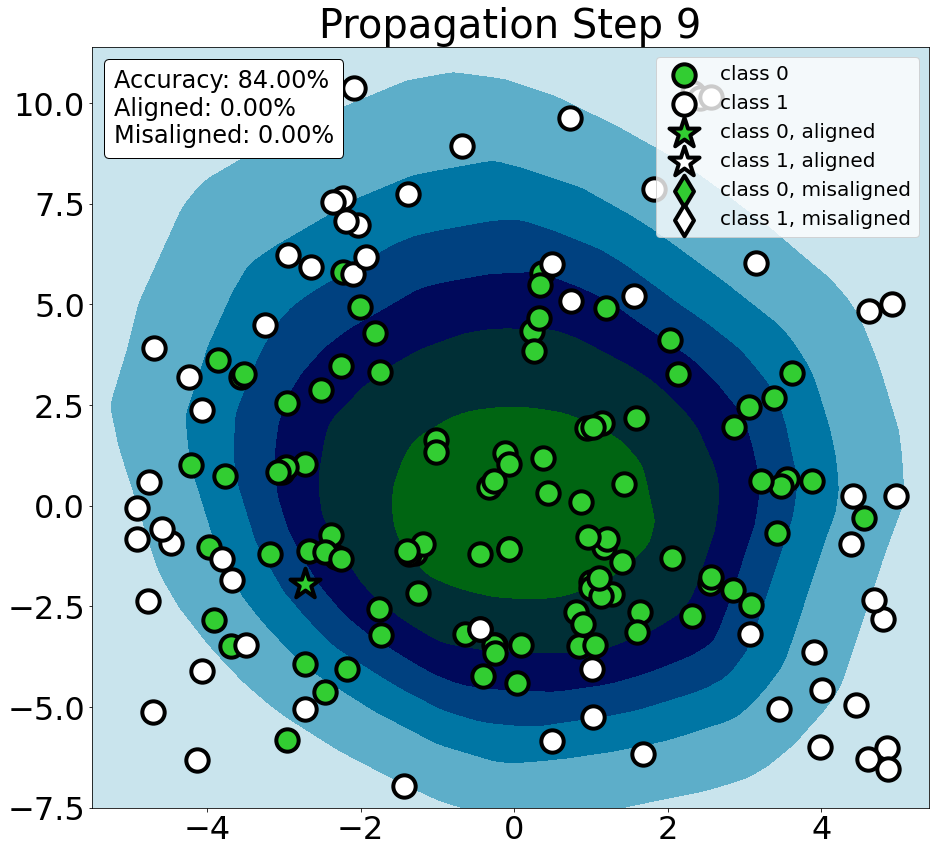

(array([], dtype=int64),)


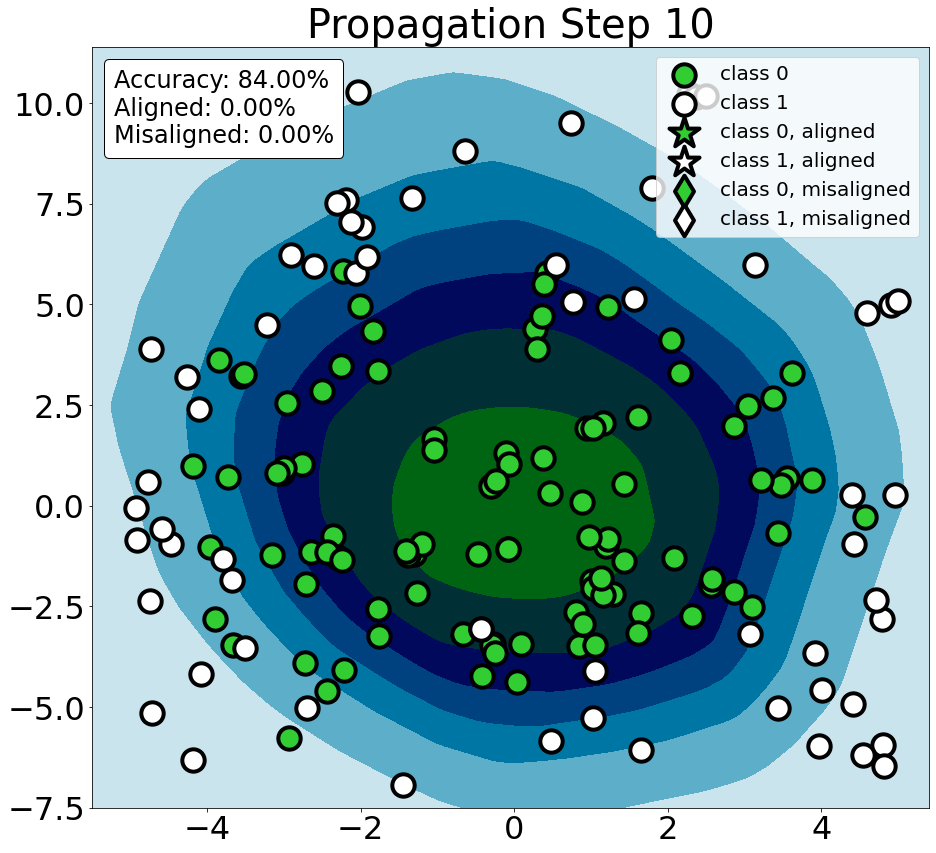

(array([], dtype=int64),)


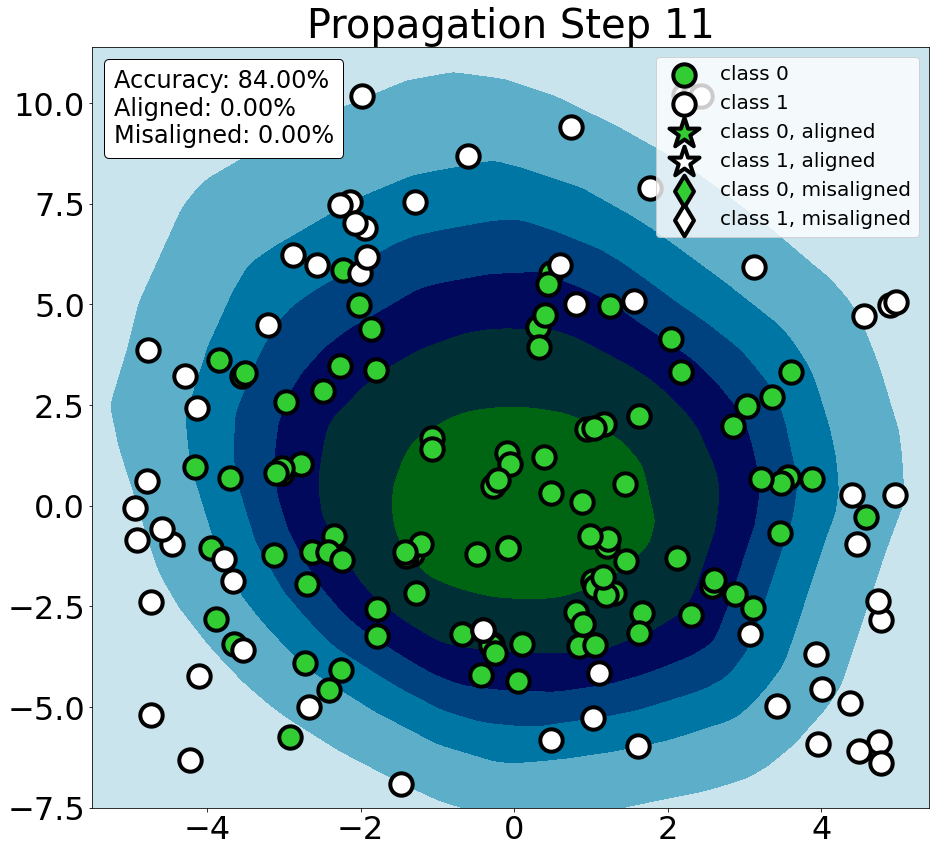

(array([], dtype=int64),)


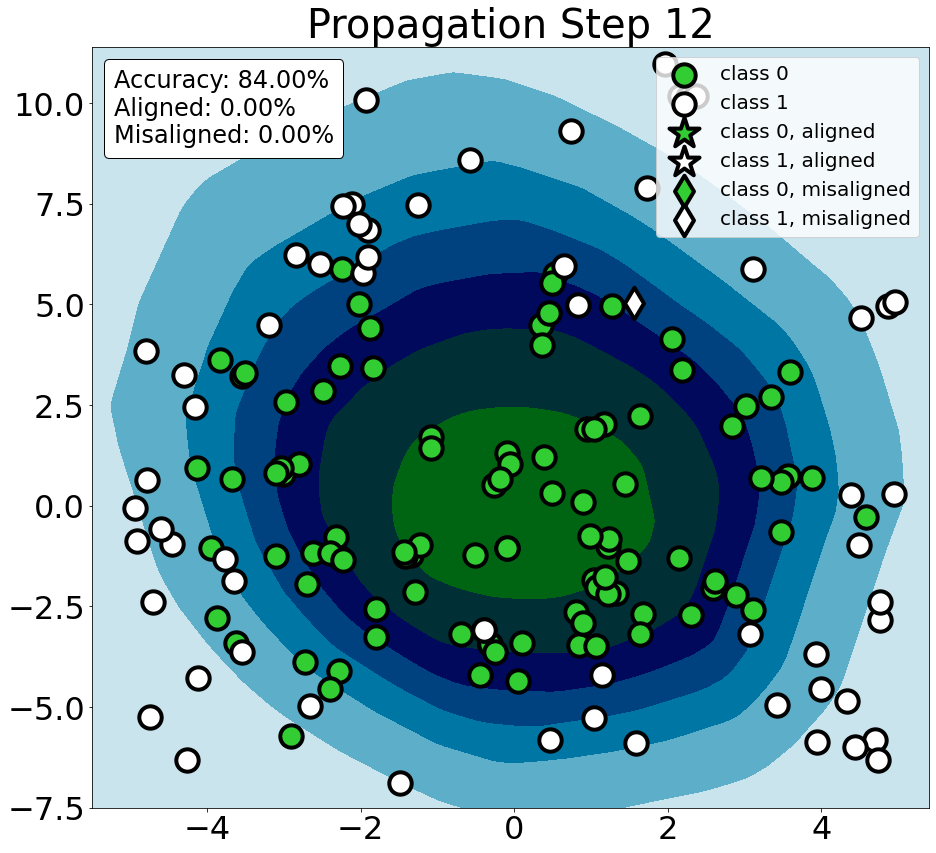

(array([78]),)


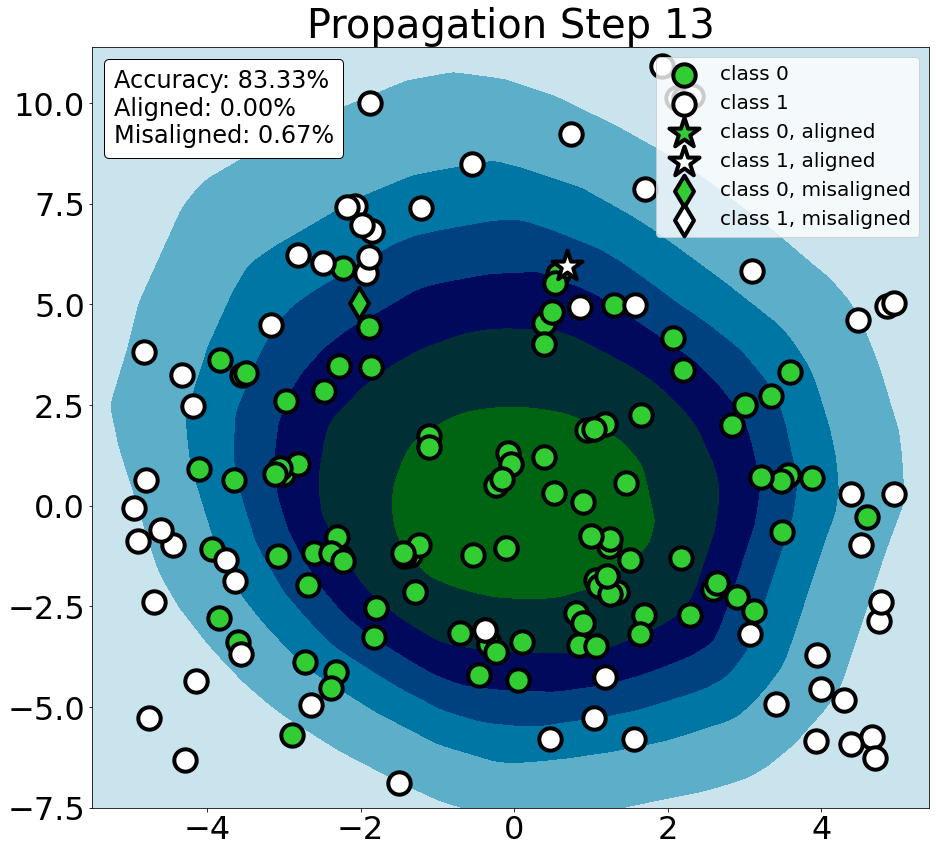

(array([], dtype=int64),)


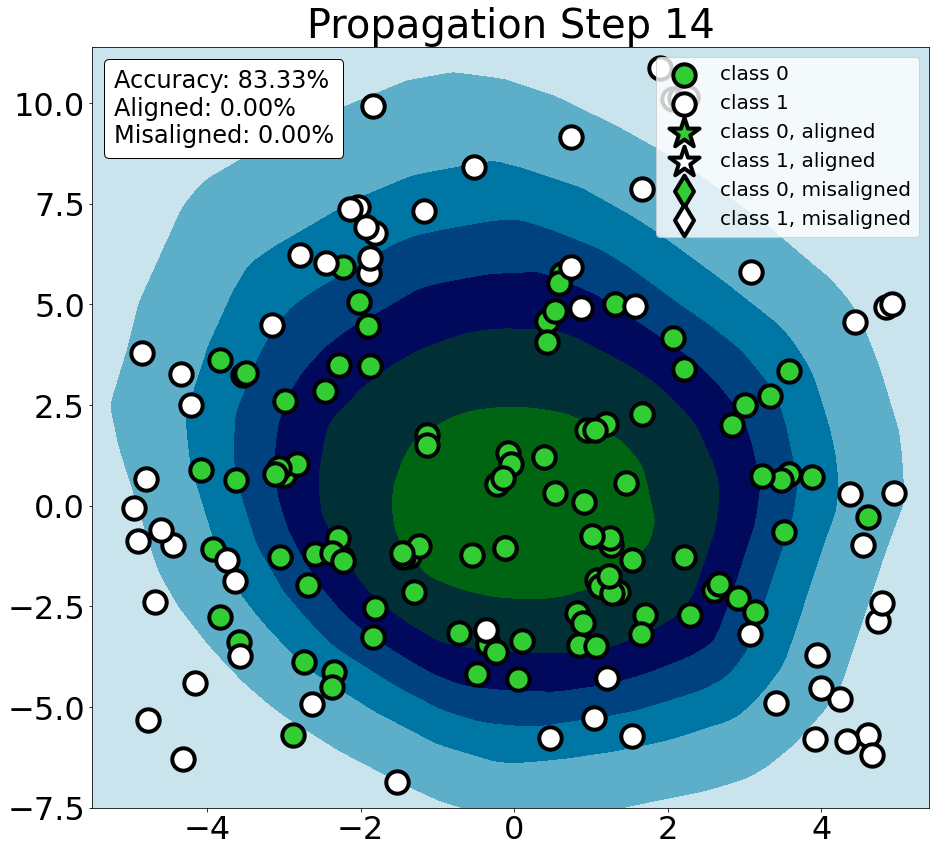

(array([], dtype=int64),)


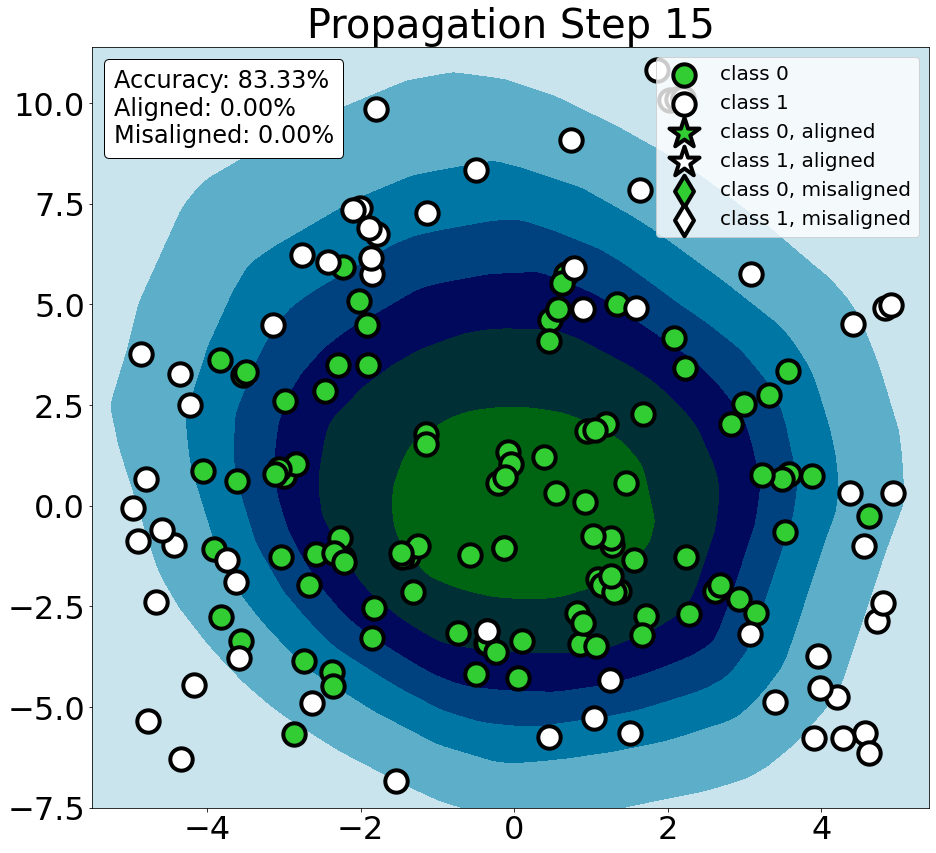

(array([], dtype=int64),)


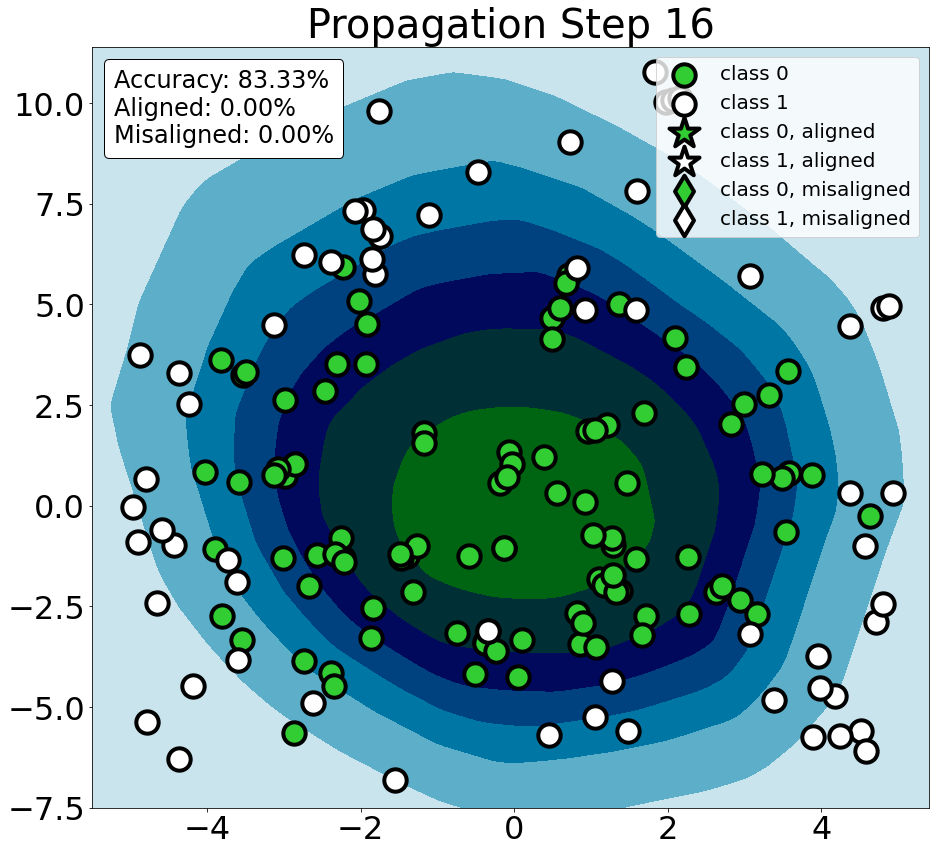

(array([], dtype=int64),)


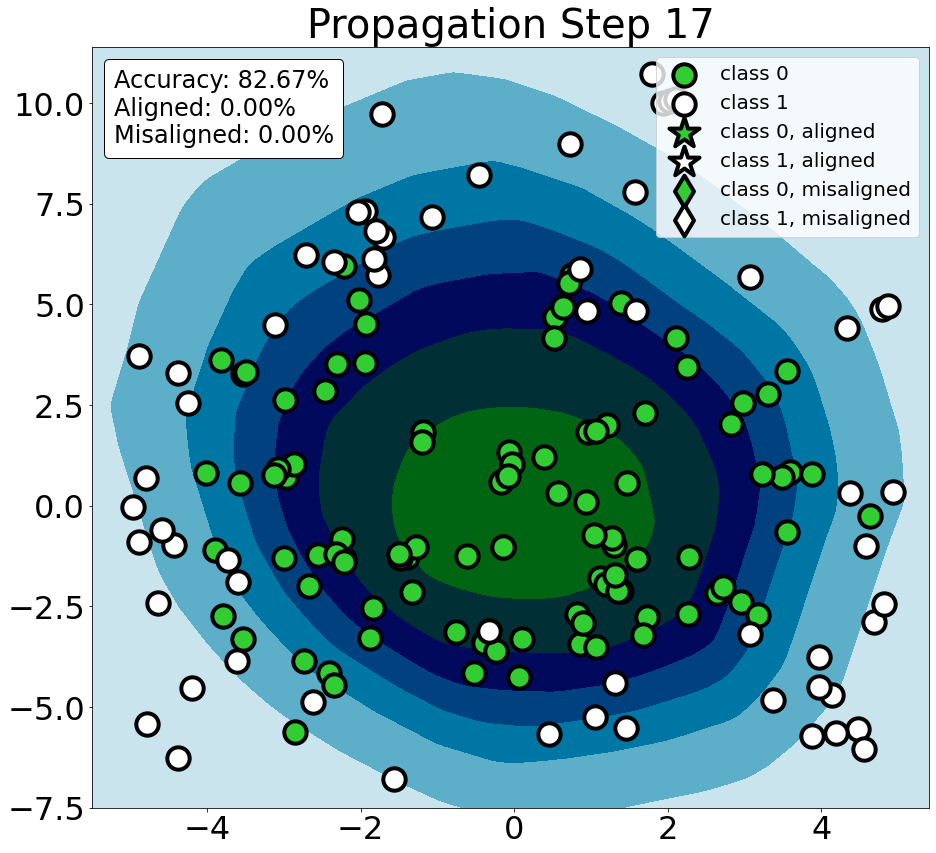

(array([], dtype=int64),)


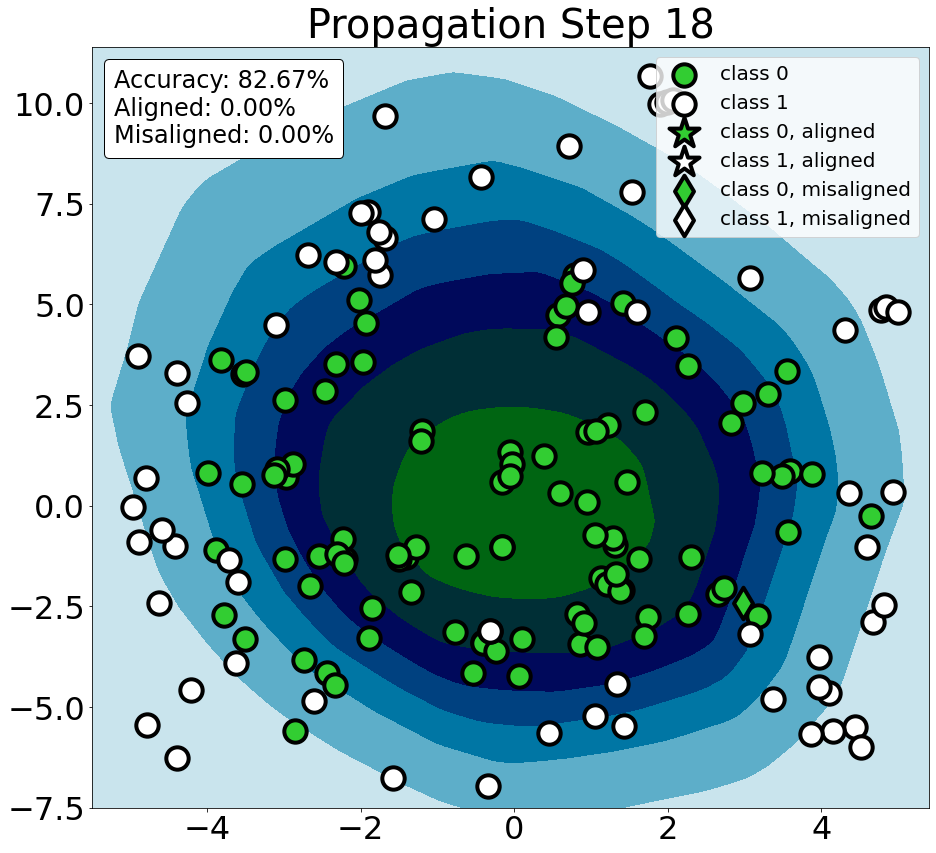

(array([], dtype=int64),)


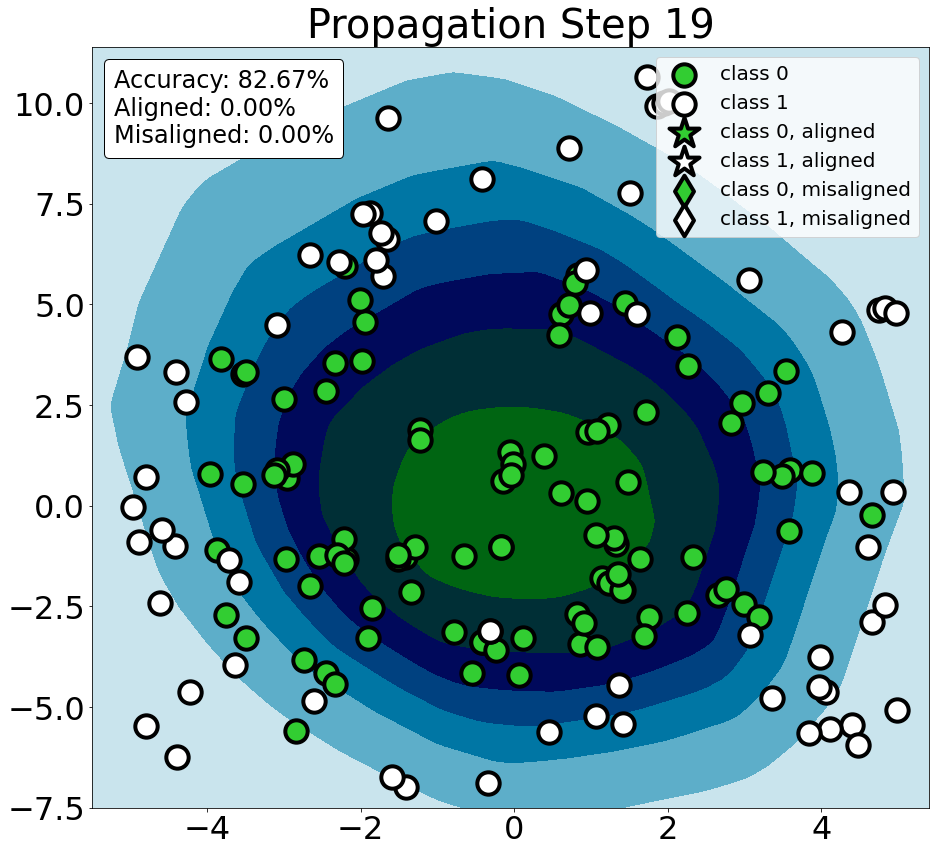

(array([], dtype=int64),)


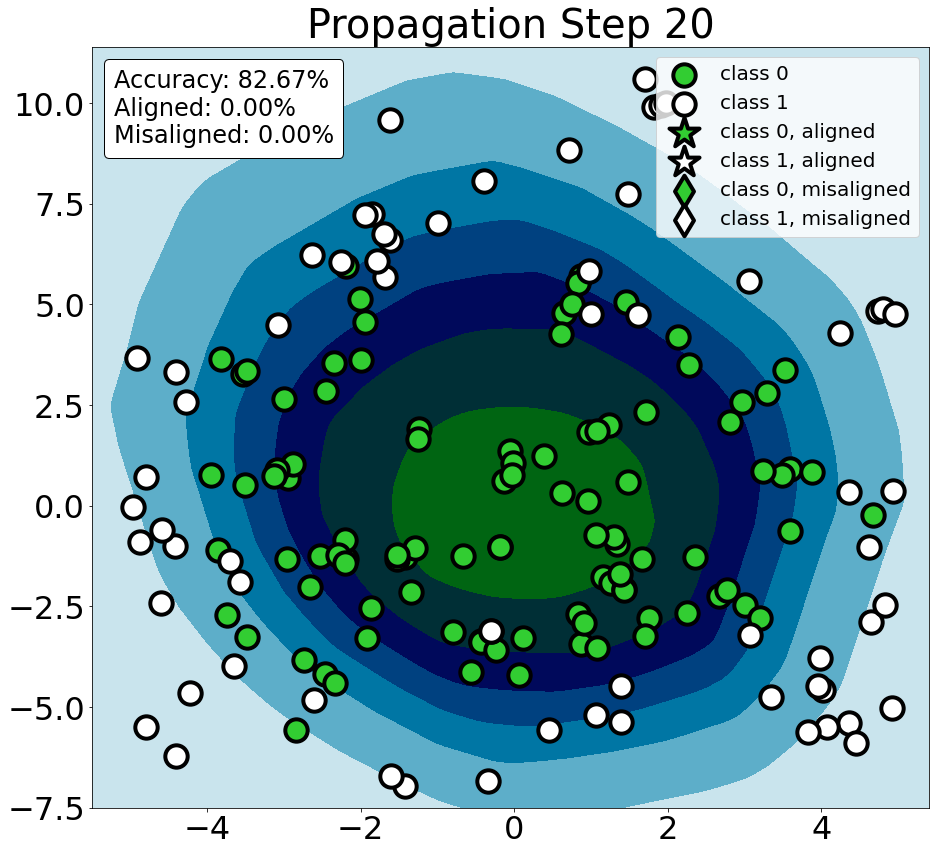

(array([], dtype=int64),)


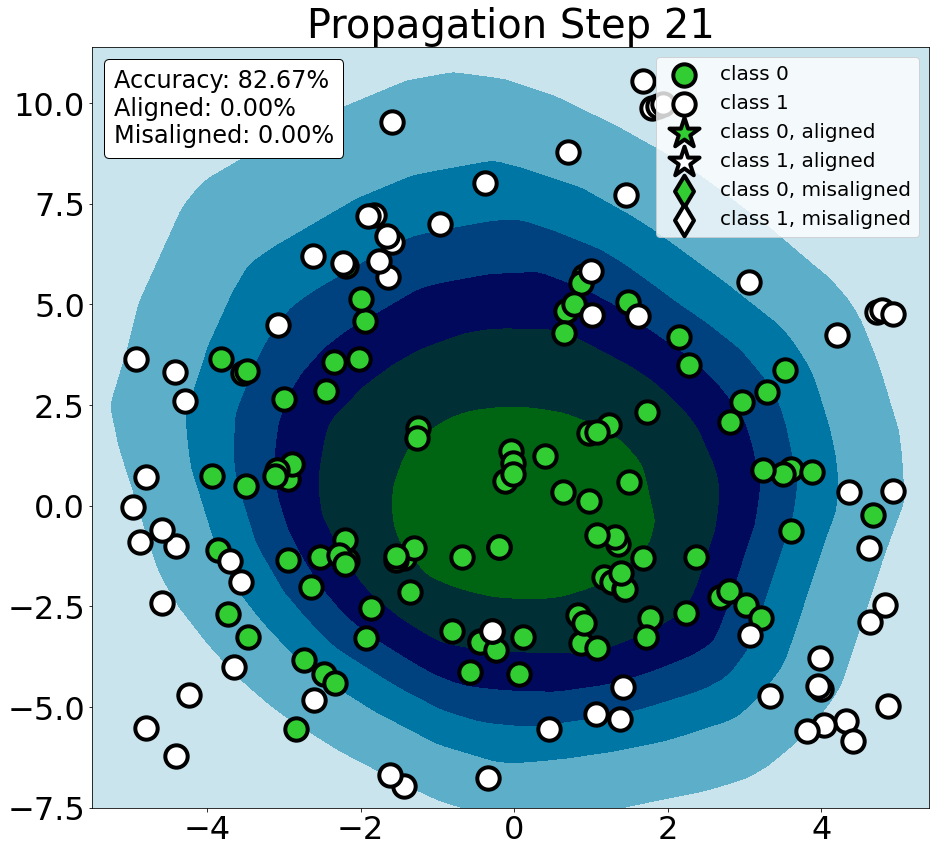

(array([], dtype=int64),)


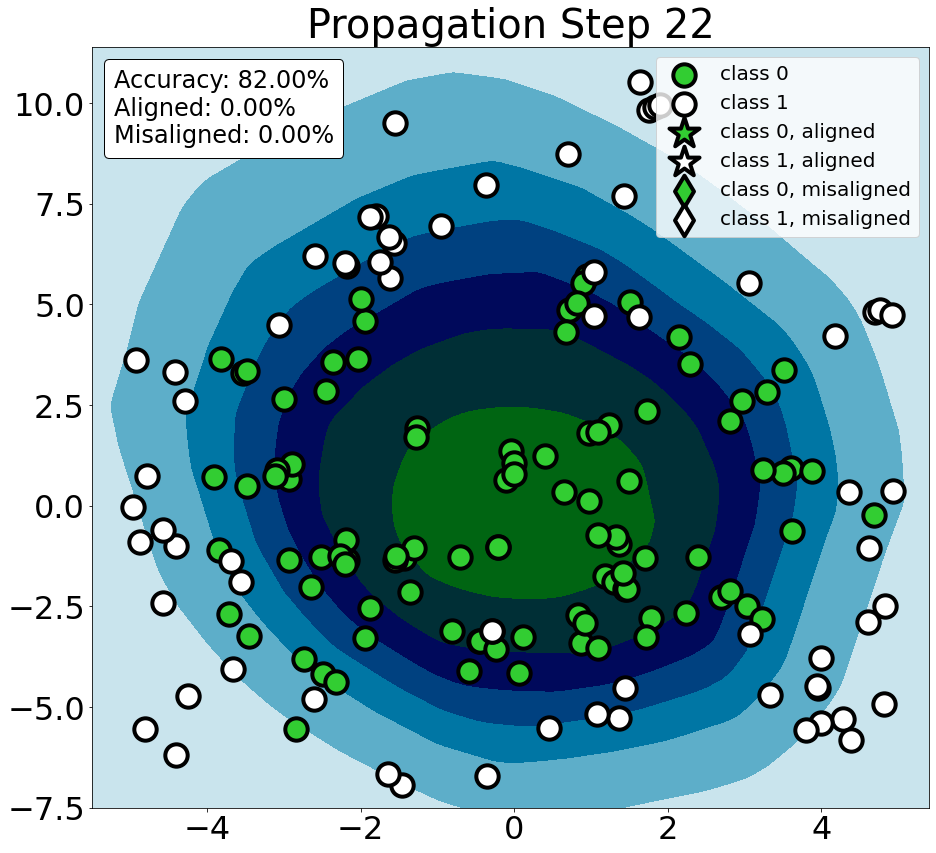

(array([], dtype=int64),)


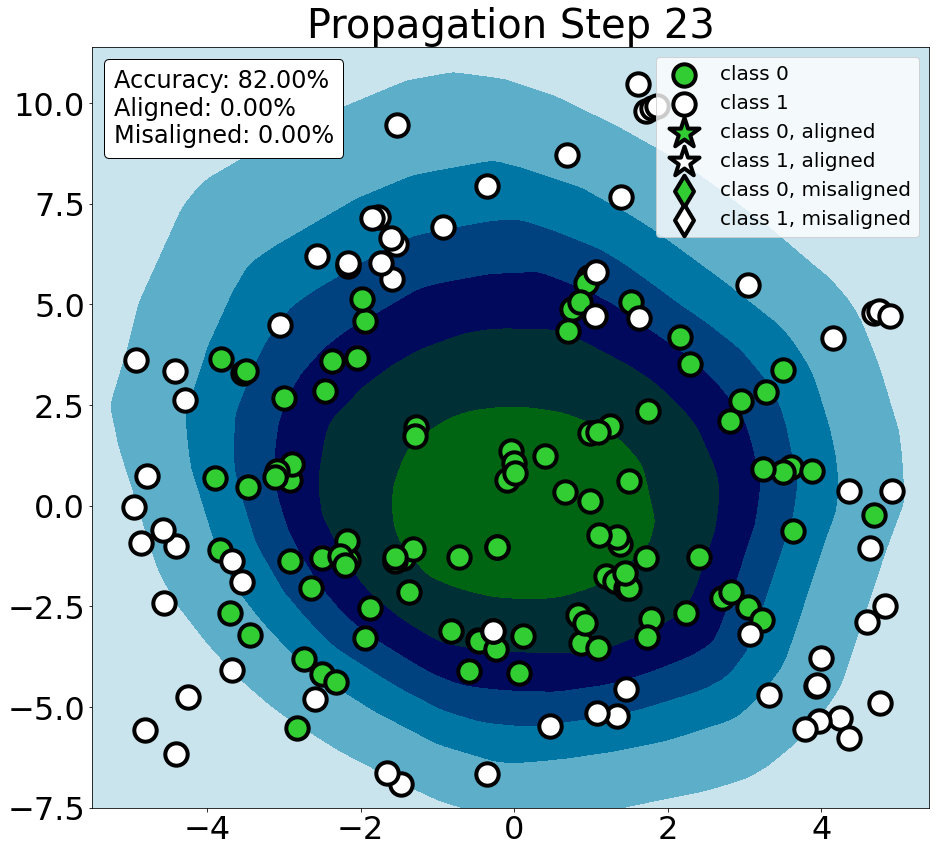

(array([], dtype=int64),)


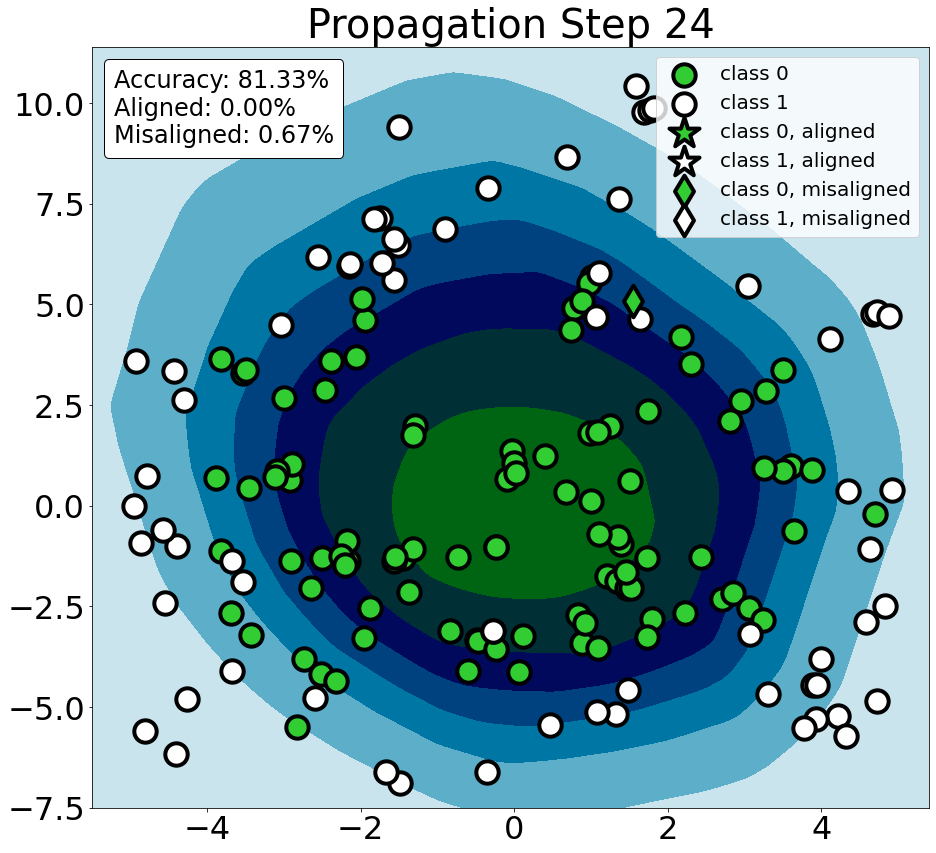

(array([303]),)


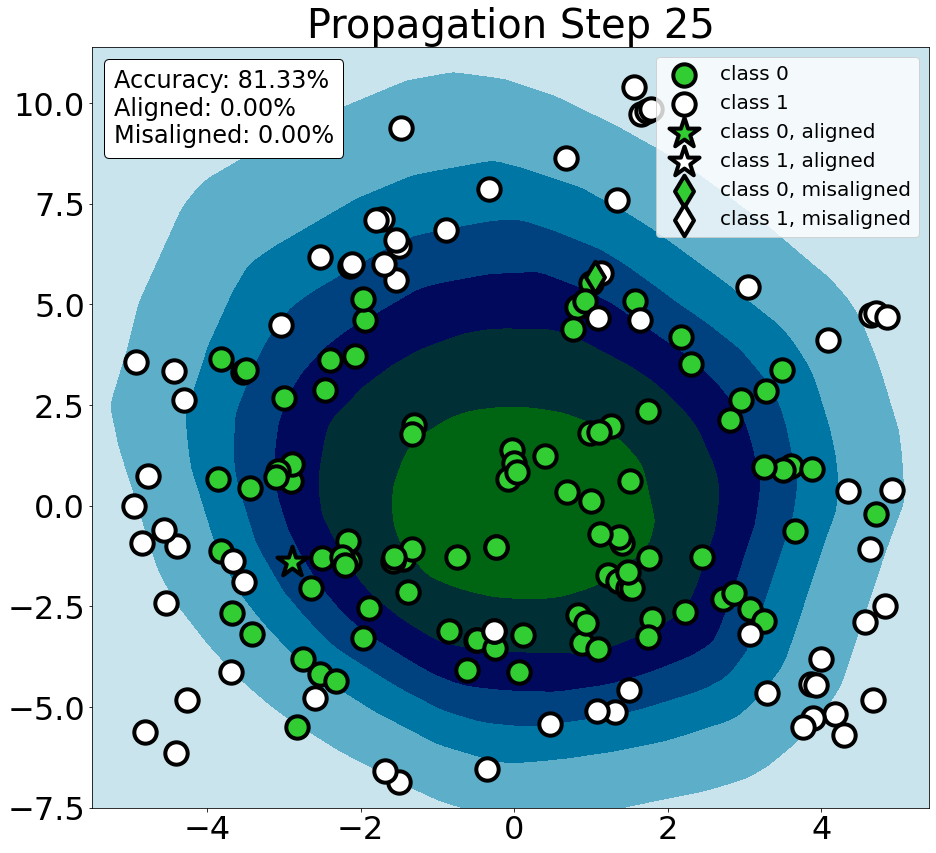

(array([159]),)


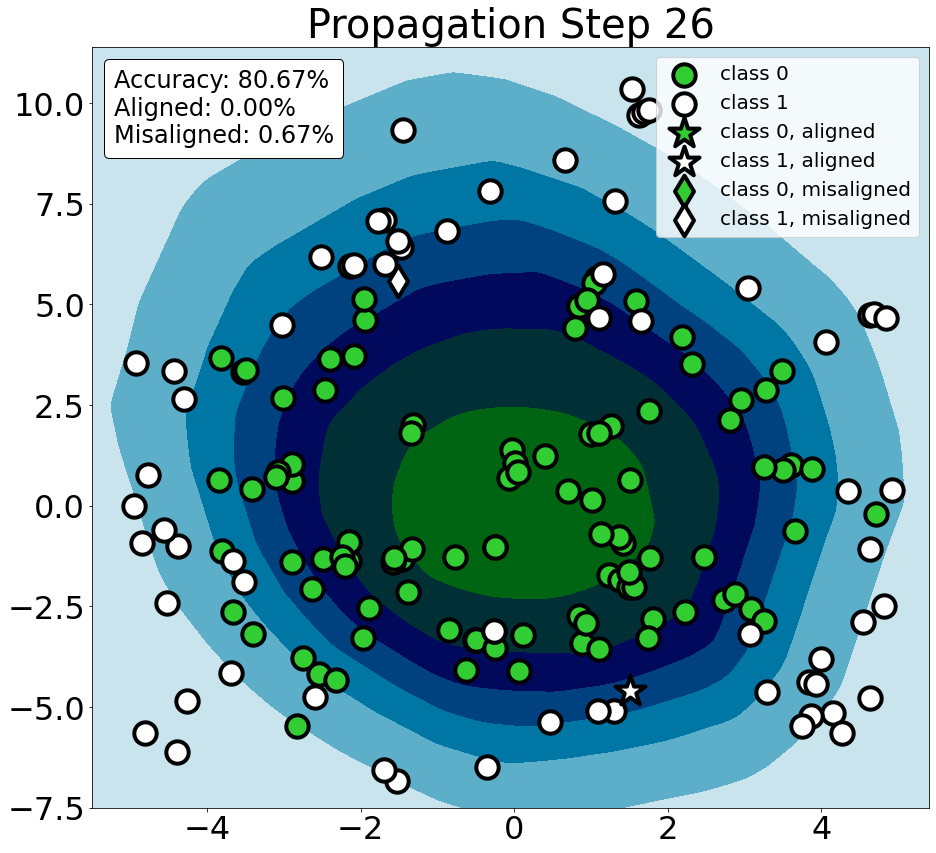

(array([], dtype=int64),)


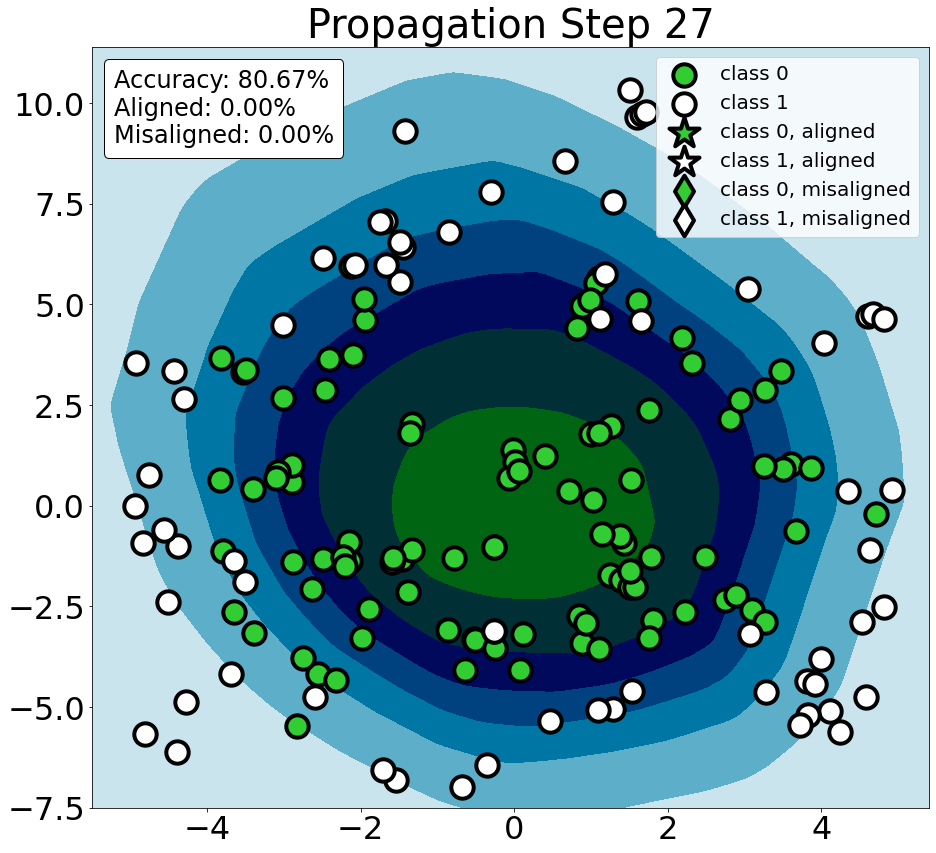

(array([], dtype=int64),)


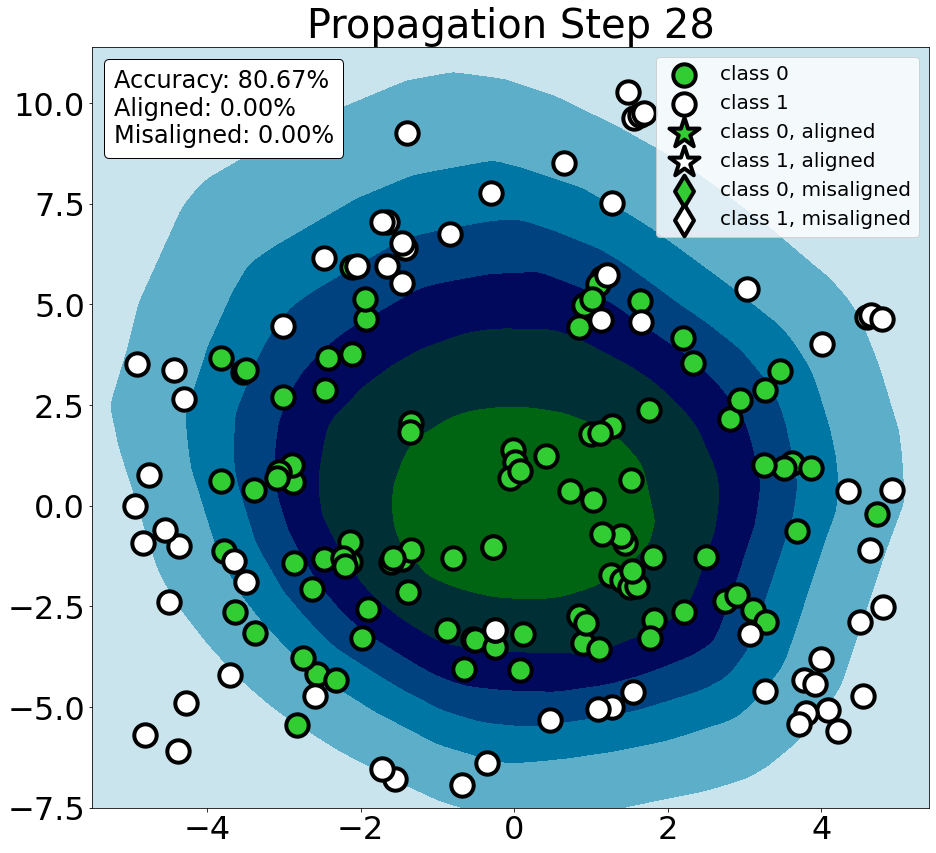

(array([], dtype=int64),)


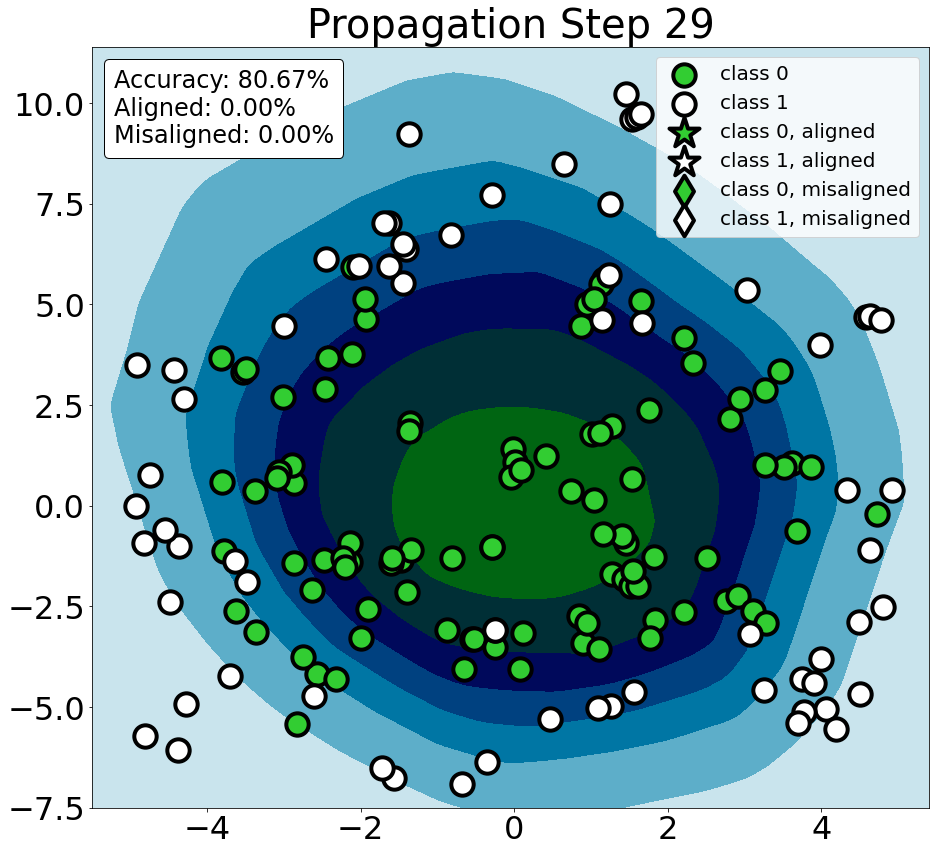

(array([465]),)


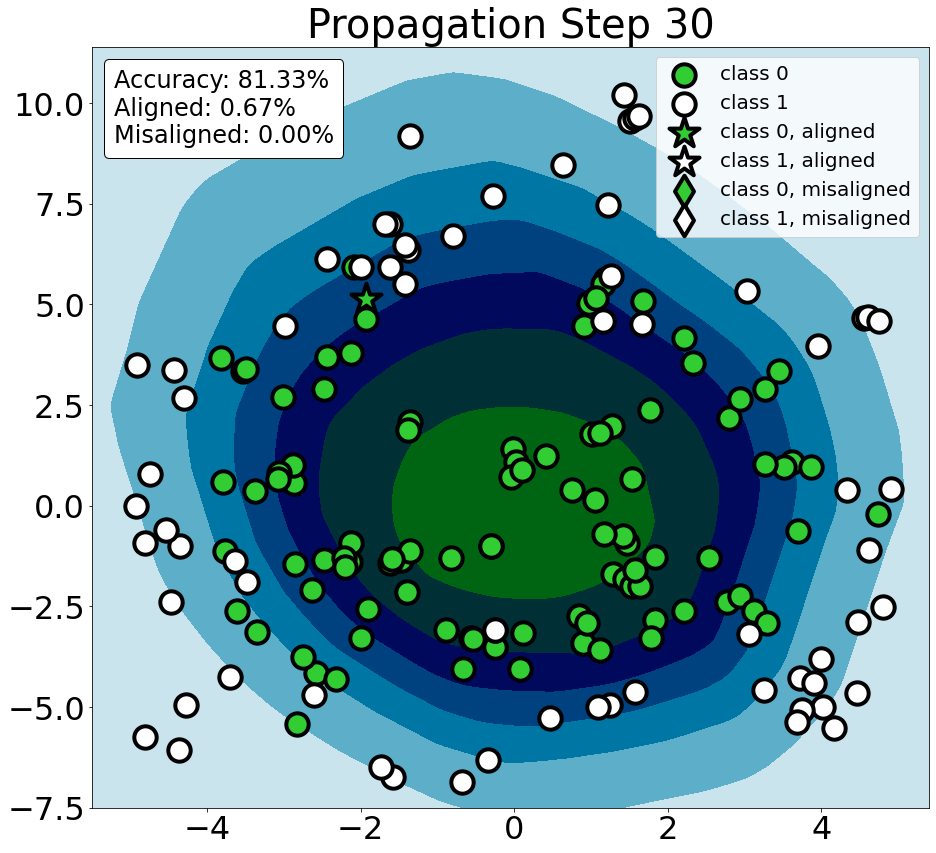

(array([], dtype=int64),)


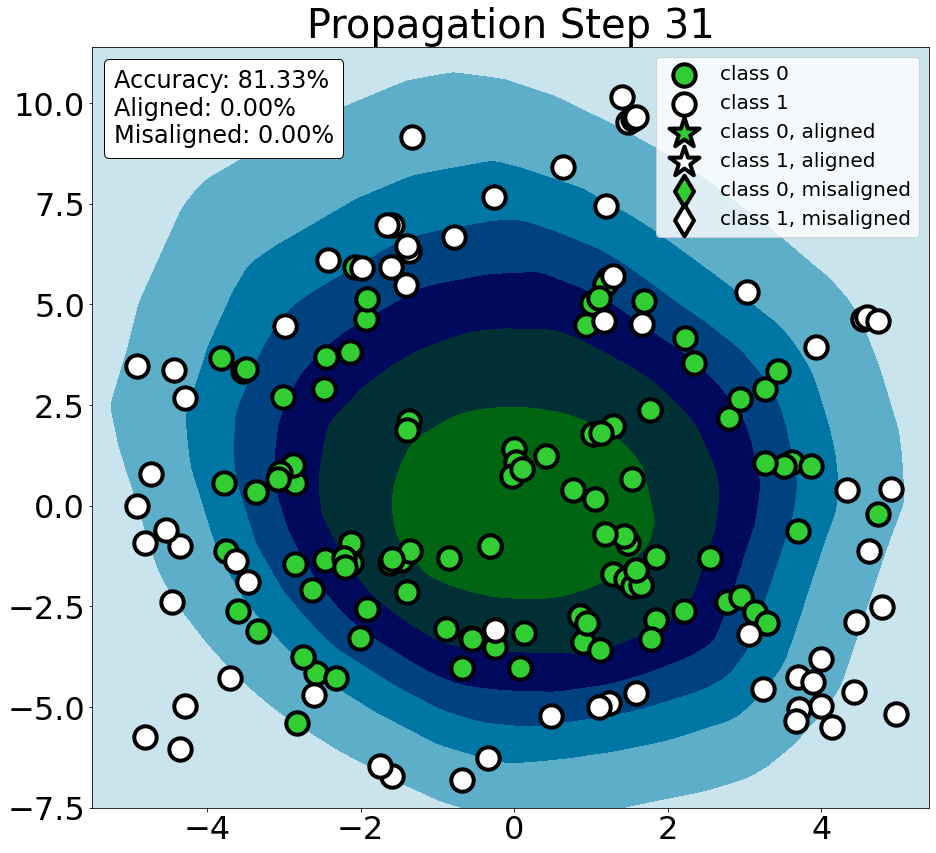

(array([], dtype=int64),)


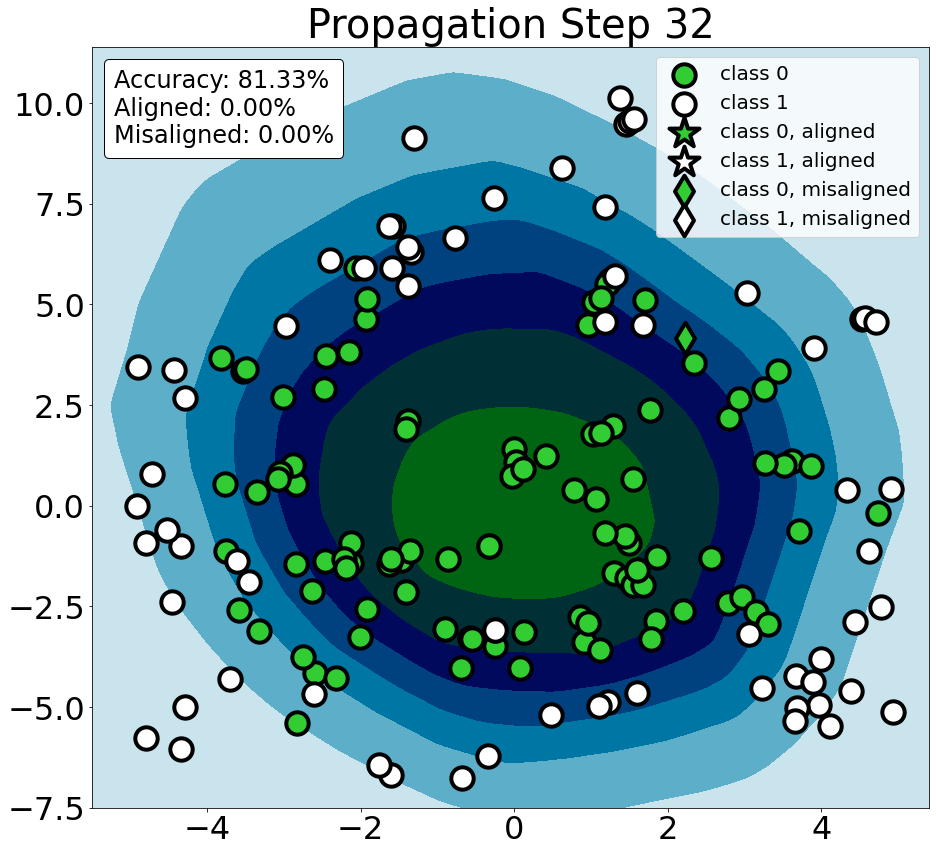

(array([], dtype=int64),)


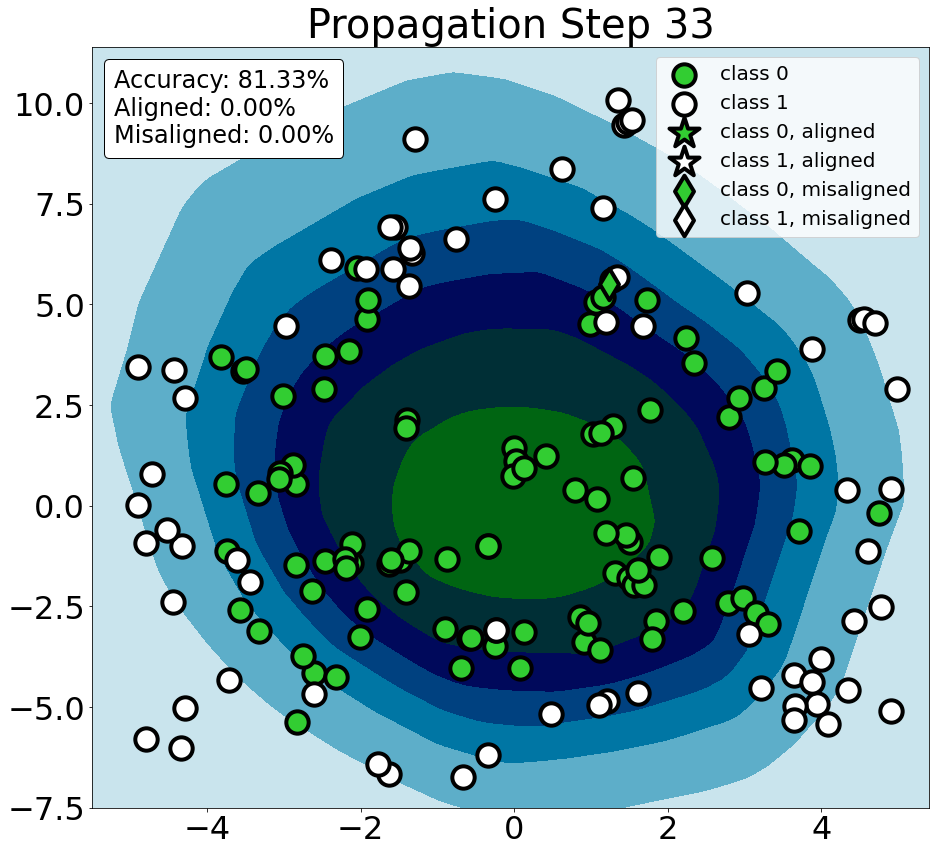

(array([], dtype=int64),)


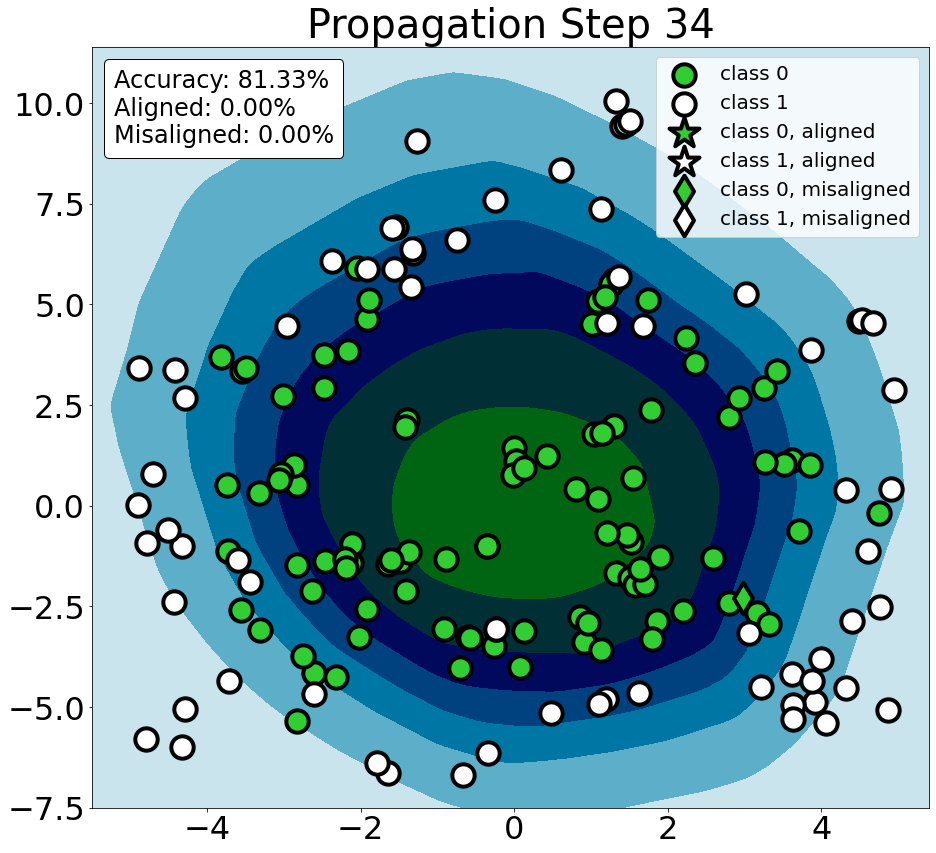

(array([], dtype=int64),)


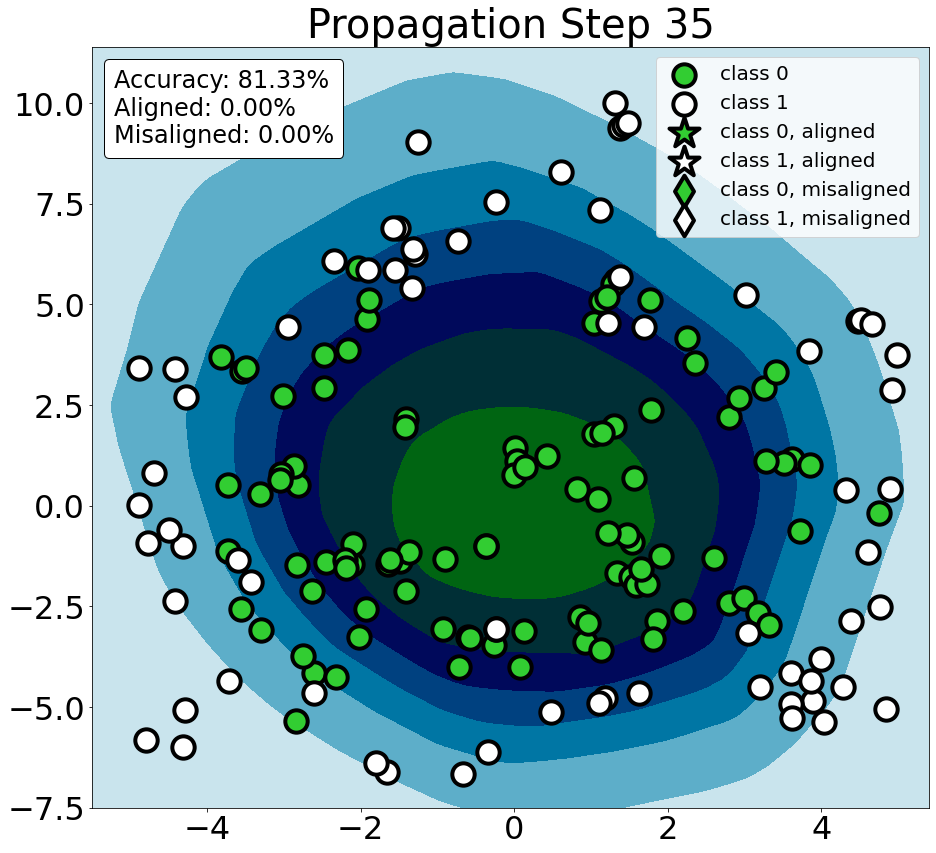

(array([], dtype=int64),)


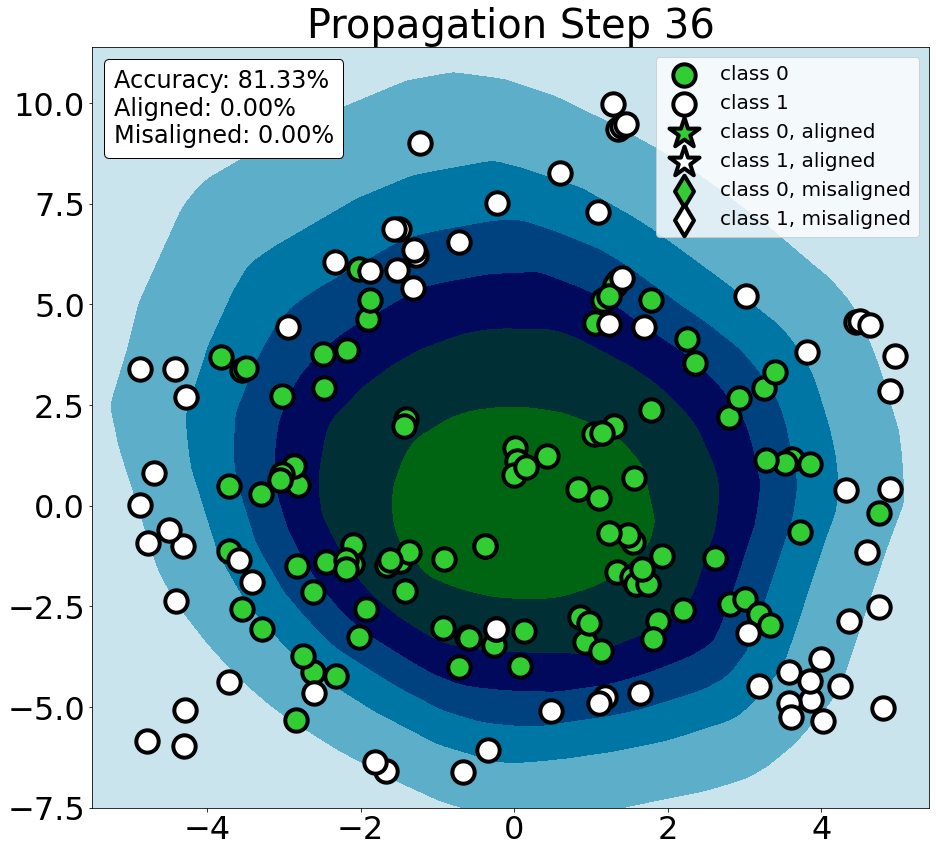

(array([], dtype=int64),)


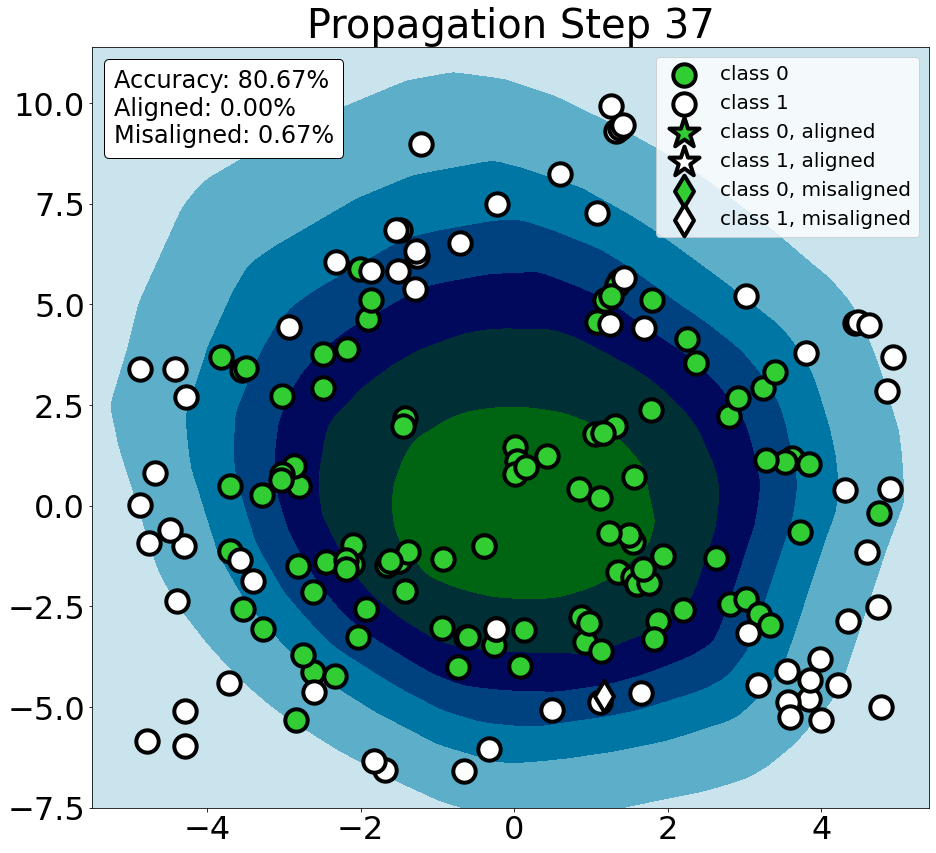

(array([], dtype=int64),)


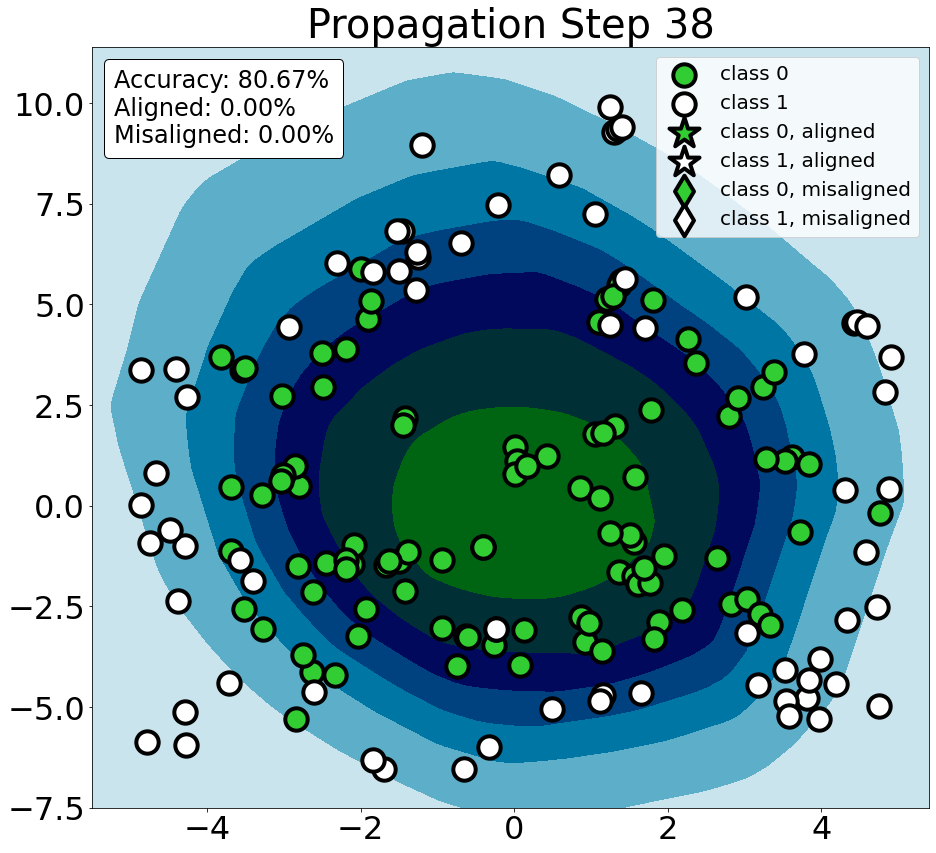

(array([], dtype=int64),)


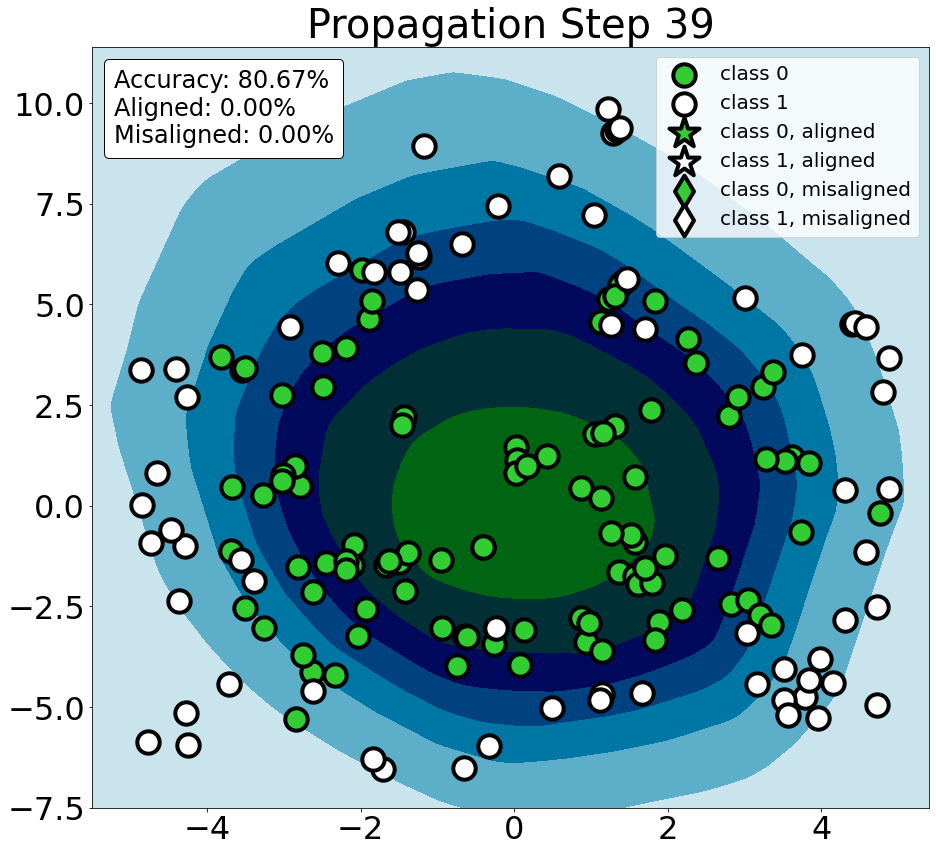

(array([], dtype=int64),)


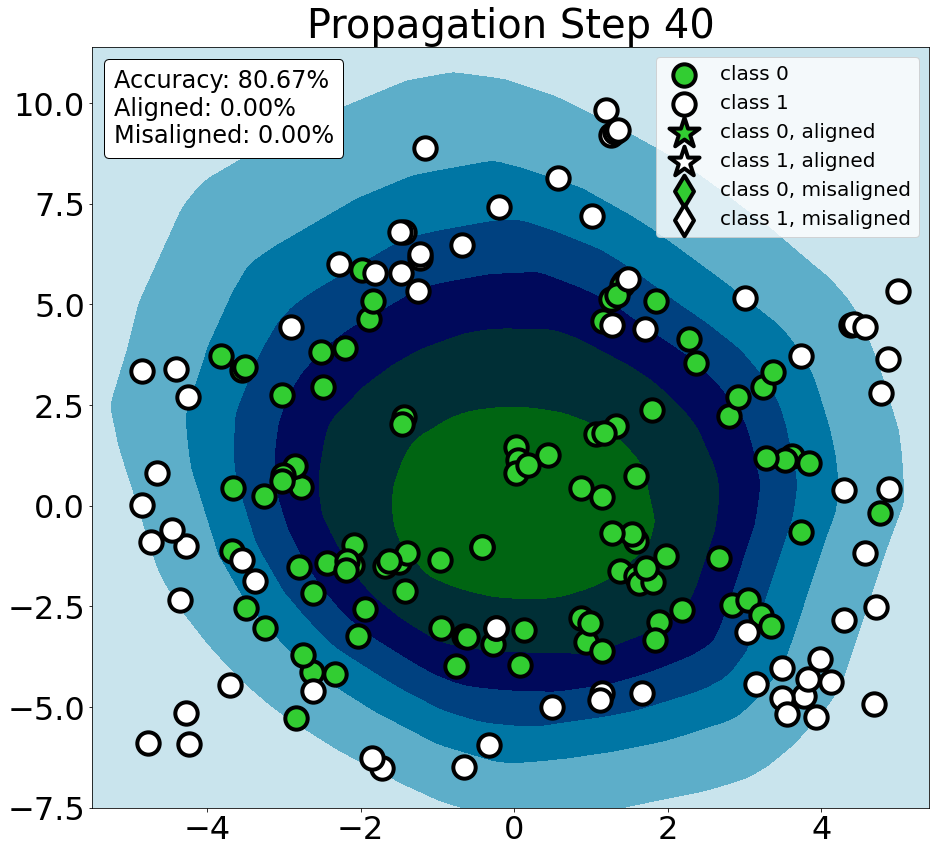

(array([], dtype=int64),)


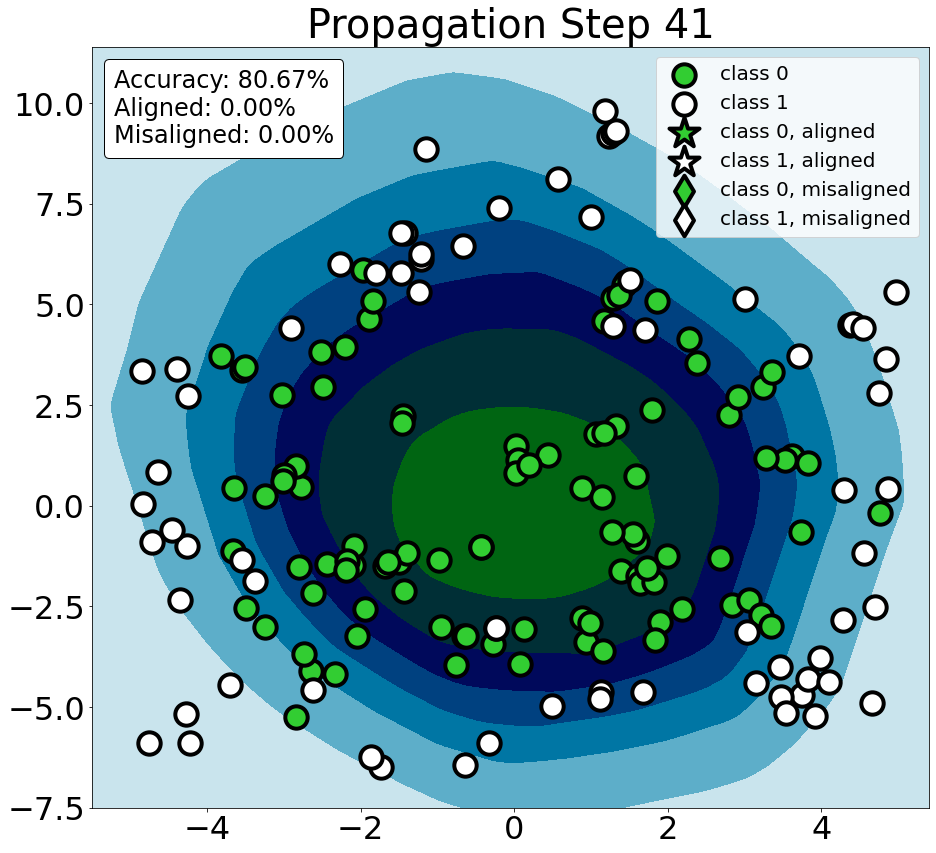

(array([351]),)


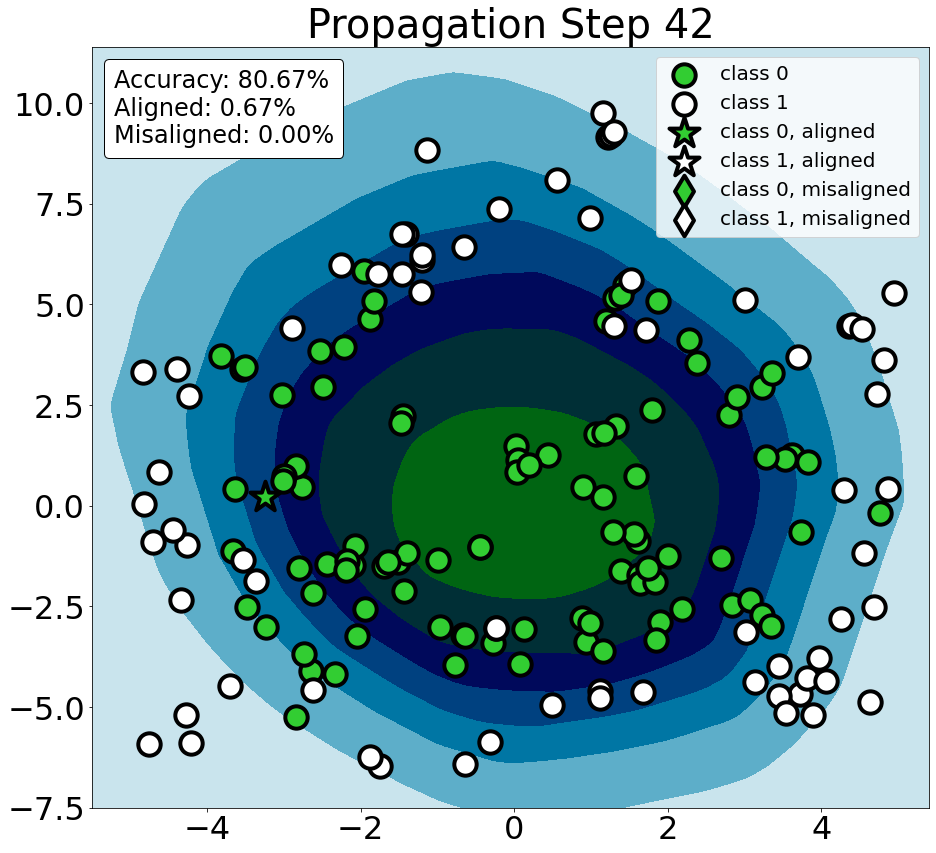

(array([], dtype=int64),)


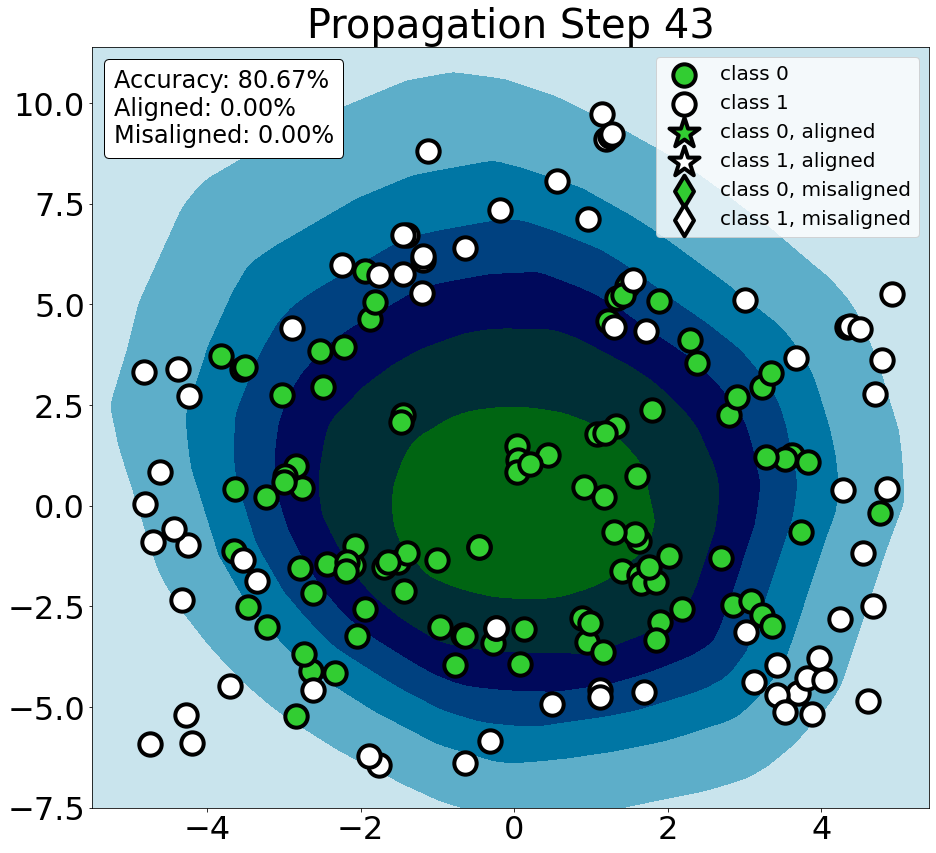

(array([], dtype=int64),)


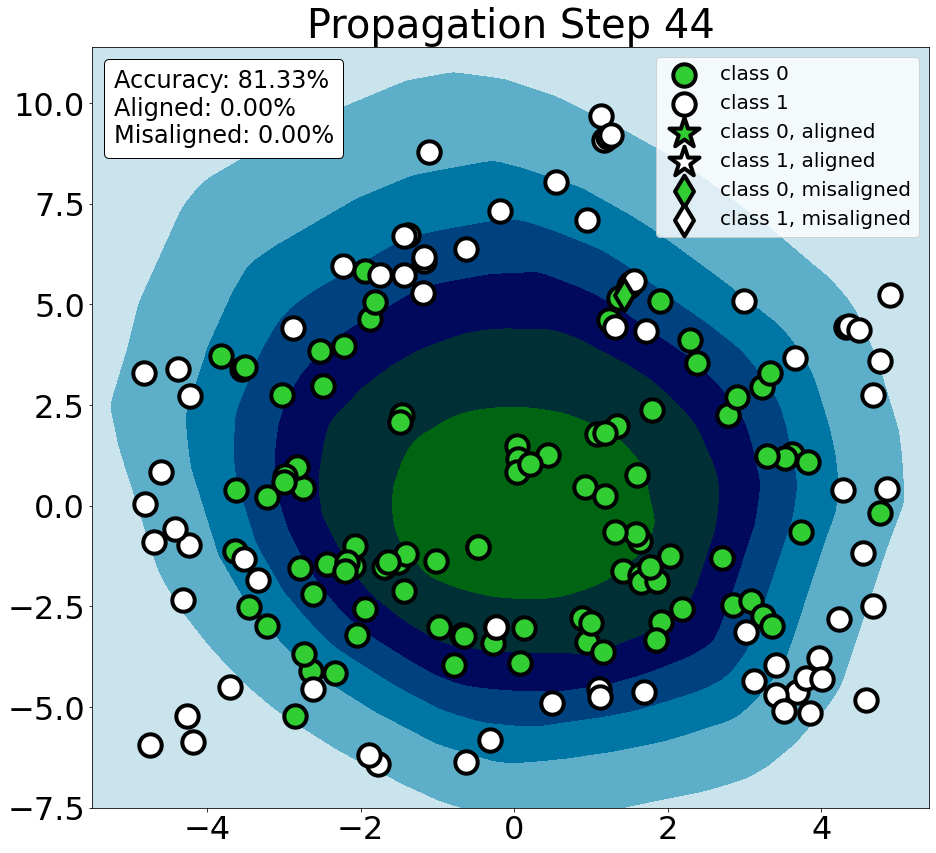

In [ ]:
n_post = 50
post_props = np.arange(n_post)
pred_probs = np.zeros((dataset.num_nodes, n_post, dataset.num_classes))
x_post = copy.deepcopy(dataset.data.x)
train_accs = []
val_accs = []
test_accs = []
train_test_distance = []
train_train_distance = []
last_labels = None
shift_mask = None
static_mask = None
train_probs_init = None
x_post_prev = None
in_frame_mask = np.ones_like(x_post[:, 0])
in_frame_mask = in_frame_mask * rand_mask
tmp = None
for n_post_prop in post_props:
    in_frame_mask = ((x_post[:, 0] > boundx[0] + 0.5) * (x_post[:, 0] < boundx[1] - 0.5) * (x_post[:, 1] > boundy[0] + 0.5) * (x_post[:, 1] < boundy[1] - 0.5)).numpy() * rand_mask
    graph = copy.deepcopy(dataset.data)
    graph.x = x_post
    graph.add_remaining_self_loops()
    graph.sym_norm()
    if model_type == "mlp":
        pred = model.forward(x_post)
    else:
        pred = model.embed_without_prop(graph, len(model.layers))
    train_acc, val_acc, test_acc = eval_acc(pred, dataset, verbose=False)
    train_accs.append(train_acc)
    val_accs.append(val_acc)
    test_accs.append(test_acc)
    pred_probs[:, n_post_prop, :] = torch.softmax(pred, dim=1).detach().numpy()
    preds = pred_probs[:, n_post_prop, :]
    pred_labels = np.argmax(preds, axis=-1)
    train_probs = preds[dataset.data.train_mask][:, 0]
    test_probs = preds[dataset.data.test_mask][:, 0]
    if n_post_prop == 0:
        train_probs_init = train_probs
    else:
        train_train_distance.append(np.max(np.array([np.abs(train_probs[i] - train_probs_init[i]) for i in range(len(train_probs))])))
    max_len = min(len(train_probs), len(test_probs))
    train_test_distance.append(np.max(np.abs(preds[:, 0][(match_t - 151).astype(np.int32)] - preds[:, 0][(match_c - 1).astype(np.int32)])))
#     train_test_distance.append(np.mean(np.array([np.abs(train_probs[i] - test_probs[i]) for i in range(max_len)])))
    if last_labels is not None:
        shift_mask = (last_labels != pred_labels) * in_frame_mask
        static_mask = (last_labels == pred_labels) * in_frame_mask
    c0_mask = (dataset.data.y == 0) * in_frame_mask
    c1_mask = (dataset.data.y == 1) * in_frame_mask
    right_mask = np.equal(dataset.data.y, pred_labels).numpy() * in_frame_mask
    wrong_mask = np.not_equal(dataset.data.y, pred_labels).numpy() * in_frame_mask
    c0_c = 'limegreen'
    c1_c = 'white'
    shift_c = 'black'
    last_labels = pred_labels
    fig, ax = plt.subplots()
    plt.contourf(contour_x, contour_y, contour_Z, cmap='ocean')
    marker_size = 500
    right_size = 1000
    wrong_size = 500
    linewidth = 4
#     print(np.where(c1_mask * (dataset.data.x[:, 0] > 4.5).numpy() * (dataset.data.x[:, 1] > 2.5).numpy() * (dataset.data.x[:, 1] < 5).numpy()))
#     print(np.where(c0_mask * (dataset.data.x[:, 0] < -3).numpy() * (dataset.data.x[:, 1] > -2.5).numpy() * (dataset.data.x[:, 1] < -1.5).numpy()))
    if shift_mask is not None:
        plt.scatter(x_post[:, 0][np.where(c0_mask * static_mask)], x_post[:, 1][np.where(c0_mask * static_mask)], c=c0_c, s=marker_size, label="class 0", edgecolors="black", linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * static_mask)], x_post[:, 1][np.where(c1_mask * static_mask)], c=c1_c, s=marker_size, label="class 1", edgecolors="black", linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c0_mask * shift_mask * right_mask)], x_post[:, 1][np.where(c0_mask * shift_mask * right_mask)], c=c0_c, s=right_size, marker='*', label="class 0, aligned", edgecolors=shift_c, linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * shift_mask * right_mask)], x_post[:, 1][np.where(c1_mask * shift_mask * right_mask)], c=c1_c, s=right_size, marker='*', label="class 1, aligned", edgecolors=shift_c, linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c0_mask * shift_mask * wrong_mask)], x_post[:, 1][np.where(c0_mask * shift_mask * wrong_mask)], c=c0_c, s=wrong_size, marker='d', label="class 0, misaligned", edgecolors=shift_c, linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * shift_mask * wrong_mask)], x_post[:, 1][np.where(c1_mask * shift_mask * wrong_mask)], c=c1_c, s=wrong_size, marker='d', label="class 1, misaligned", edgecolors=shift_c, linewidth=linewidth)
#         plt.scatter(x_post[:, 0][static_mask], x_post[:, 1][static_mask], c=dataset.data.y[static_mask], cmap='ocean', s=marker_size, label="not shifted")
#         plt.scatter(x_post[:, 0][shift_mask], x_post[:, 1][shift_mask], c=dataset.data.y[shift_mask], cmap='ocean', marker='+', s=100, label="shifted")
#         plt.legend(["not shifted", "shifted"])
        at = AnchoredText("Accuracy: {:.2f}%\nAligned: {:.2f}%\nMisaligned: {:.2f}%".format(test_acc * 100, np.sum((graph.test_mask.numpy() * shift_mask * right_mask)) / torch.sum(graph.test_mask) * 100, np.sum((graph.test_mask.numpy() * shift_mask * wrong_mask)) / torch.sum(graph.test_mask) * 100), prop=dict(size=24), frameon=True, loc='upper left')
        at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
        ax.add_artist(at)
        print(np.where(shift_mask * right_mask * in_frame_mask))
    else:
        plt.scatter(x_post[:, 0][np.where(c0_mask * in_frame_mask)], x_post[:, 1][np.where(c0_mask * in_frame_mask)], c=c0_c, s=marker_size, label="class 0", edgecolors="black", linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * in_frame_mask)], x_post[:, 1][np.where(c1_mask * in_frame_mask)], c=c1_c, s=marker_size, label="class 1", edgecolors="black", linewidth=linewidth)
        at = AnchoredText("Accuracy: {:.2f}%".format(test_acc * 100), prop=dict(size=24), frameon=True, loc='upper left')
        at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
        ax.add_artist(at)
#         plt.scatter(x_post[:, 0], x_post[:, 1], c=dataset.data.y, cmap='ocean', s=marker_size)
#     sample = [389, 390, 394, 455]
#     sample = [37,  43, 100, 104, 112, 130]
#     sample = [104]
#     for i in sample:
#         plt.scatter(x_post[i, 0], x_post[i, 1], c="gold", marker='o', s=marker_size)
    if n_post_prop == 1:
#         sample = [37,  43, 100, 104, 394, 455]
        sample = [104, 394, 455, 467, 280, 343]
        tmp = x_post_prev
        for i in sample:
            plt.scatter(x_post_prev[i, 0], x_post_prev[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', linestyle='--', edgecolors="black", s=marker_size)
            if shift_mask[i]:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='*', edgecolors="black", s=right_size, linewidth=linewidth)
            else:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', edgecolors="black", s=marker_size, linewidth=linewidth)
            plt.arrow(x_post_prev[i, 0], x_post_prev[i, 1], x_post[i, 0] - x_post_prev[i, 0], x_post[i, 1] - x_post_prev[i, 1], width=0.03, head_width=0.2, head_length=0.2, overhang=0.3, color="red", length_includes_head=True)
    if n_post_prop == 2:
#         sample = [15, 345, 389, 390]
        sample = [104, 394, 455, 467, 280, 343]
        for i in sample:
            plt.scatter(tmp[i, 0], tmp[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', linestyle='--', edgecolors="black", s=marker_size)
            plt.scatter(x_post_prev[i, 0], x_post_prev[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', linestyle='--', edgecolors="black", s=marker_size)
            if shift_mask[i]:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='*', edgecolors="black", s=right_size, linewidth=linewidth)
            else:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', edgecolors="black", s=marker_size, linewidth=linewidth)
            plt.arrow(tmp[i, 0], tmp[i, 1], x_post_prev[i, 0] - tmp[i, 0], x_post_prev[i, 1] - tmp[i, 1], width=0.03, head_width=0.2, head_length=0.1, overhang=0.3, color="red", length_includes_head=True)
            plt.arrow(x_post_prev[i, 0], x_post_prev[i, 1], x_post[i, 0] - x_post_prev[i, 0], x_post[i, 1] - x_post_prev[i, 1], width=0.03, head_width=0.2, head_length=0.1, overhang=0.3, color="red", length_includes_head=True)
    plt.title("Propagation Step {}".format(n_post_prop), fontsize=40)
    plt.yticks(fontsize=32)
    plt.xticks(fontsize=32)
    plt.legend(fontsize=20, loc=1)
    plt.savefig("./save_figures/synthetic/synthetic_{}.png".format(n_post_prop), bbox_inches='tight')
    plt.show()
    x_post_prev = x_post
    x_post = spmm(graph, x_post)
    
    # check if there is nan in results
    if torch.isnan(pred).any() or torch.isnan(x_post).any():
        print(n_post_prop)
        break

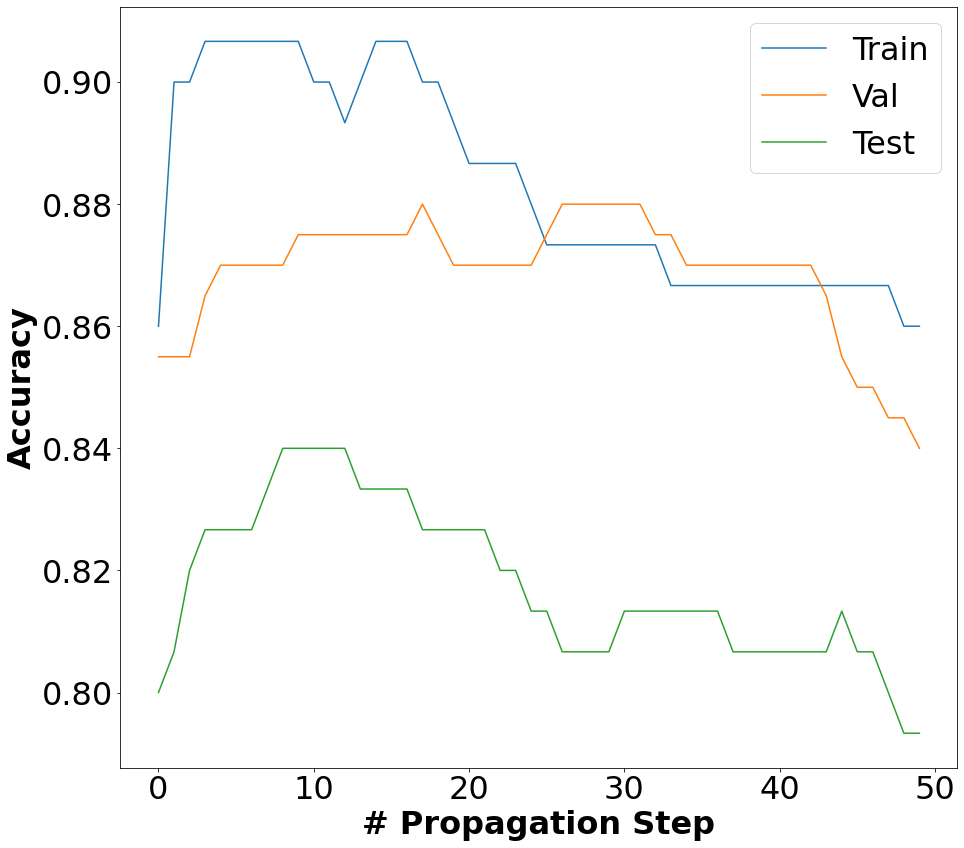

In [22]:
plt.plot(post_props, train_accs, label="Train")
plt.plot(post_props, val_accs, label="Val")
plt.plot(post_props, test_accs, label="Test")
# plt.title("{}".format(model_name), fontsize=32, fontweight='bold')
plt.ylabel("Accuracy", fontsize=32, fontweight='bold')
plt.xlabel("# Propagation Step", fontsize=32, fontweight='bold')
plt.xticks(fontsize=32)
plt.yticks(fontsize=32)
plt.legend(fontsize=32)
# plt.savefig("./figures/post_woa_{}.png".format(model_name), bbox_inches='tight')
plt.show()

In [23]:
print(train_test_distance)

[0.9015127256279811, 0.9018508738372475, 0.9021948562585749, 0.9022720577195287, 0.902364938869141, 0.9024218542035669, 0.9024685207987204, 0.90249618596863, 0.9024373707361519, 0.902340235421434, 0.9021762674674392, 0.9019638679455966, 0.9017451601102948, 0.9015195823740214, 0.9012856748886406, 0.9010097258724272, 0.900728173321113, 0.9004404961597174, 0.9001461120788008, 0.8998446164187044, 0.8995354834478348, 0.8991927444003522, 0.8988027083687484, 0.8983931592665613, 0.89794712793082, 0.8974945386871696, 0.8970347717404366, 0.8965674149803817, 0.8960918304510415, 0.8956075455062091, 0.8951141801662743, 0.89461106993258, 0.8940980681218207, 0.893574530724436, 0.8930401792749763, 0.8924962831661105, 0.8919484652578831, 0.8913886314257979, 0.8908161604776978, 0.8902310179546475, 0.8896328471601009, 0.8890212355181575, 0.8883959390223026, 0.8877566484734416, 0.8871031552553177, 0.886435192078352, 0.8857525745406747, 0.8850548565387726, 0.8843418331816792, 0.8836134038865566]


In [24]:
print(train_train_distance)

[0.15877573192119598, 0.20158565044403076, 0.22019042074680328, 0.2273915559053421, 0.24159201234579086, 0.25659002363681793, 0.26782818883657455, 0.2764524668455124, 0.2831052616238594, 0.28986573219299316, 0.2976391315460205, 0.3042595088481903, 0.30991461873054504, 0.31475234031677246, 0.3188910186290741, 0.32242560386657715, 0.32543352246284485, 0.32797855138778687, 0.3301135003566742, 0.3318830877542496, 0.33332471549510956, 0.3344705253839493, 0.3353481888771057, 0.3359817564487457, 0.3363921791315079, 0.336597740650177, 0.3366148769855499, 0.3364579677581787, 0.3361397683620453, 0.33567216992378235, 0.33506518602371216, 0.3343285769224167, 0.3334706574678421, 0.33249929547309875, 0.33142170310020447, 0.33024412393569946, 0.32897287607192993, 0.3276129961013794, 0.32616981863975525, 0.32464805245399475, 0.32305198907852173, 0.3213856816291809, 0.31965288519859314, 0.317857027053833, 0.3160015344619751, 0.31408923864364624, 0.3121231496334076, 0.31076619029045105, 0.31330111622810

In [25]:
# f_train = dataset.data.x[dataset.data.train_mask]
# f_test = dataset.data.x[dataset.data.test_mask]
# f_val = dataset.data.x[dataset.data.val_mask]
# is_train = np.concatenate((np.zeros(f_train.shape[0]), np.ones(f_test.shape[0])))
# dim1 = dataset.data.x[:, 0][dataset.data.train_mask + dataset.data.test_mask]
# dim2 = dataset.data.x[:, 1][dataset.data.train_mask + dataset.data.test_mask]
# # y = dataset.data.y[dataset.data.train_mask + dataset.data.test_mask]
# df = pd.DataFrame({"train": is_train, "dim1": dim1, "dim2": dim2})

In [26]:
# %%R -i df -o dfm_tr -o dfm_x -o match_t -o match_c

# library(Matching)
# # df[, 2:3]
# matched <- Match(Tr = df$train, X = as.matrix(df[, 2:3]))
# # summary(matched)
# # MatchBalance(train ~ ., data = df, match.out = matched)
# # print(df)
# dfm <- matched$mdata
# dfm_tr <- dfm$Tr
# dfm_x <- dfm$X
# match_t <- matched$index.treated
# match_c <- matched$index.control

In [27]:
# np.max(np.abs(preds[:, 0][(match_t - 151).astype(np.int32)] - preds[:, 0][(match_c - 1).astype(np.int32)]))

In [28]:
# n_post = 50
# post_props = np.arange(n_post)
# pred_probs = np.zeros((dataset.num_nodes, n_post, dataset.num_classes))
# x_post = copy.deepcopy(dataset.data.x)
# train_accs = []
# val_accs = []
# test_accs = []
# train_test_distance = []
# train_train_distance = []
# last_labels = None
# shift_mask = None
# static_mask = None
# train_probs_init = None
# x_post_prev = None
# in_frame_mask = np.ones_like(x_post[:, 0])
# align_percent = 0.0
# misalign_percent = 0.0
# for n_post_prop in post_props:
#     in_frame_mask = ((x_post[:, 0] > boundx[0] + 0.5) * (x_post[:, 0] < boundx[1] - 0.5) * (x_post[:, 1] > boundy[0] + 0.5) * (x_post[:, 1] < boundy[1] - 0.5)).numpy()
#     graph = copy.deepcopy(dataset.data)
#     graph.x = x_post
#     graph.add_remaining_self_loops()
#     graph.sym_norm()
#     if model_type == "mlp":
#         pred = model.forward(x_post)
#     else:
#         pred = model.embed_without_prop(graph, len(model.layers))
#     train_acc, val_acc, test_acc = eval_acc(pred, dataset, verbose=False)
#     train_accs.append(train_acc)
#     val_accs.append(val_acc)
#     test_accs.append(test_acc)
#     pred_probs[:, n_post_prop, :] = torch.softmax(pred, dim=1).detach().numpy()
#     preds = pred_probs[:, n_post_prop, :]
#     pred_labels = np.argmax(preds, axis=-1)
#     train_probs = preds[dataset.data.train_mask][:, 0]
#     test_probs = preds[dataset.data.test_mask][:, 0]
#     if n_post_prop == 0:
#         train_probs_init = train_probs
#     else:
#         train_train_distance.append(np.max(np.array([np.abs(train_probs[i] - train_probs_init[i]) for i in range(len(train_probs))])))
#     max_len = min(len(train_probs), len(test_probs))
#     train_test_distance.append(np.max(np.abs(preds[:, 0][(match_t - 151).astype(np.int32)] - preds[:, 0][(match_c - 1).astype(np.int32)])))
# #     train_test_distance.append(np.mean(np.array([np.abs(train_probs[i] - test_probs[i]) for i in range(max_len)])))
#     if last_labels is not None:
#         shift_mask = (last_labels != pred_labels) * in_frame_mask
#         static_mask = (last_labels == pred_labels) * in_frame_mask
#     c0_mask = (dataset.data.y == 0) * in_frame_mask
#     c1_mask = (dataset.data.y == 1) * in_frame_mask
#     right_mask = np.equal(dataset.data.y, pred_labels).numpy() * in_frame_mask
#     wrong_mask = np.not_equal(dataset.data.y, pred_labels).numpy() * in_frame_mask
#     c0_c = 'forestgreen'
#     c1_c = 'white'
#     shift_c = 'black'
#     last_labels = pred_labels
#     fig, ax = plt.subplots()
#     plt.contourf(contour_x, contour_y, contour_Z, cmap='ocean')
#     marker_size = 150
# #     print(np.where(c0_mask * (dataset.data.x[:, 0] < -7.5).numpy()))
    
#     if shift_mask is not None:
#         plt.scatter(x_post[:, 0][np.where(c0_mask * static_mask)], x_post[:, 1][np.where(c0_mask * static_mask)], c=c0_c, s=marker_size, label="class 0", edgecolors="black")
#         plt.scatter(x_post[:, 0][np.where(c1_mask * static_mask)], x_post[:, 1][np.where(c1_mask * static_mask)], c=c1_c, s=marker_size, label="class 1", edgecolors="black")
#         plt.scatter(x_post[:, 0][np.where(c0_mask * shift_mask * right_mask)], x_post[:, 1][np.where(c0_mask * shift_mask * right_mask)], c=c0_c, s=700, marker='*', label="class 0, aligned", edgecolors=shift_c)
#         plt.scatter(x_post[:, 0][np.where(c1_mask * shift_mask * right_mask)], x_post[:, 1][np.where(c1_mask * shift_mask * right_mask)], c=c1_c, s=700, marker='*', label="class 1, aligned", edgecolors=shift_c)
#         plt.scatter(x_post[:, 0][np.where(c0_mask * shift_mask * wrong_mask)], x_post[:, 1][np.where(c0_mask * shift_mask * wrong_mask)], c=c0_c, s=300, marker='d', label="class 0, misaligned", edgecolors=shift_c)
#         plt.scatter(x_post[:, 0][np.where(c1_mask * shift_mask * wrong_mask)], x_post[:, 1][np.where(c1_mask * shift_mask * wrong_mask)], c=c1_c, s=300, marker='d', label="class 1, misaligned", edgecolors=shift_c)
# #         plt.scatter(x_post[:, 0][static_mask], x_post[:, 1][static_mask], c=dataset.data.y[static_mask], cmap='ocean', s=marker_size, label="not shifted")
# #         plt.scatter(x_post[:, 0][shift_mask], x_post[:, 1][shift_mask], c=dataset.data.y[shift_mask], cmap='ocean', marker='+', s=100, label="shifted")
# #         plt.legend(["not shifted", "shifted"])
#         align_percent += np.sum((graph.test_mask.numpy() * shift_mask * right_mask)) / torch.sum(graph.test_mask) * 100
#         misalign_percent += np.sum((graph.test_mask.numpy() * shift_mask * wrong_mask)) / torch.sum(graph.test_mask) * 100
#         at = AnchoredText("Accuracy: {:.2f}%\nAligned: {:.2f}%\nMisaligned: {:.2f}%".format(test_acc * 100, align_percent, misalign_percent), prop=dict(size=24), frameon=True, loc='upper left')
#         at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
#         ax.add_artist(at)
#         print(np.where(shift_mask * right_mask * in_frame_mask))
#     else:
#         plt.scatter(x_post[:, 0][np.where(c0_mask * in_frame_mask)], x_post[:, 1][np.where(c0_mask * in_frame_mask)], c=c0_c, s=marker_size, label="class 0", edgecolors="black")
#         plt.scatter(x_post[:, 0][np.where(c1_mask * in_frame_mask)], x_post[:, 1][np.where(c1_mask * in_frame_mask)], c=c1_c, s=marker_size, label="class 1", edgecolors="black")
#         at = AnchoredText("Accuracy: {:.2f}%".format(test_acc * 100), prop=dict(size=24), frameon=True, loc='upper left')
#         at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
#         ax.add_artist(at)
# #         plt.scatter(x_post[:, 0], x_post[:, 1], c=dataset.data.y, cmap='ocean', s=marker_size)
# #     sample = [389, 390, 394, 455]
# #     sample = [37,  43, 100, 104, 112, 130]
# #     sample = [104]
# #     for i in sample:
# #         plt.scatter(x_post[i, 0], x_post[i, 1], c="gold", marker='o', s=marker_size)
#     if n_post_prop == 1:
#         sample = [37,  43, 100, 104, 394, 455]
#         for i in sample:
#             plt.scatter(x_post_prev[i, 0], x_post_prev[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', linestyle='--', edgecolors="black", s=marker_size)
#             plt.arrow(x_post_prev[i, 0], x_post_prev[i, 1], x_post[i, 0] - x_post_prev[i, 0], x_post[i, 1] - x_post_prev[i, 1], width=0.01, head_width=0.2, head_length=0.2, overhang=0.3, color="red", length_includes_head=True)
#     if n_post_prop == 2:
#         sample = [15, 345, 389, 390]
#         for i in sample:
#             plt.scatter(x_post_prev[i, 0], x_post_prev[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', linestyle='--', edgecolors="black", s=marker_size)
#             plt.arrow(x_post_prev[i, 0], x_post_prev[i, 1], x_post[i, 0] - x_post_prev[i, 0], x_post[i, 1] - x_post_prev[i, 1], width=0.01, head_width=0.2, head_length=0.1, overhang=0.3, color="red", length_includes_head=True)
#     plt.title("Propagation Step {}".format(n_post_prop), fontsize=32)
#     plt.yticks(fontsize=28)
#     plt.xticks(fontsize=28)
#     plt.legend(fontsize=20, loc=1)
#     plt.savefig("./save_figures/synthetic/synthetic_{}.png".format(n_post_prop), bbox_inches='tight')
#     plt.show()
#     x_post_prev = x_post
#     x_post = spmm(graph, x_post)
    
#     # check if there is nan in results
#     if torch.isnan(pred).any() or torch.isnan(x_post).any():
#         print(n_post_prop)
#         break

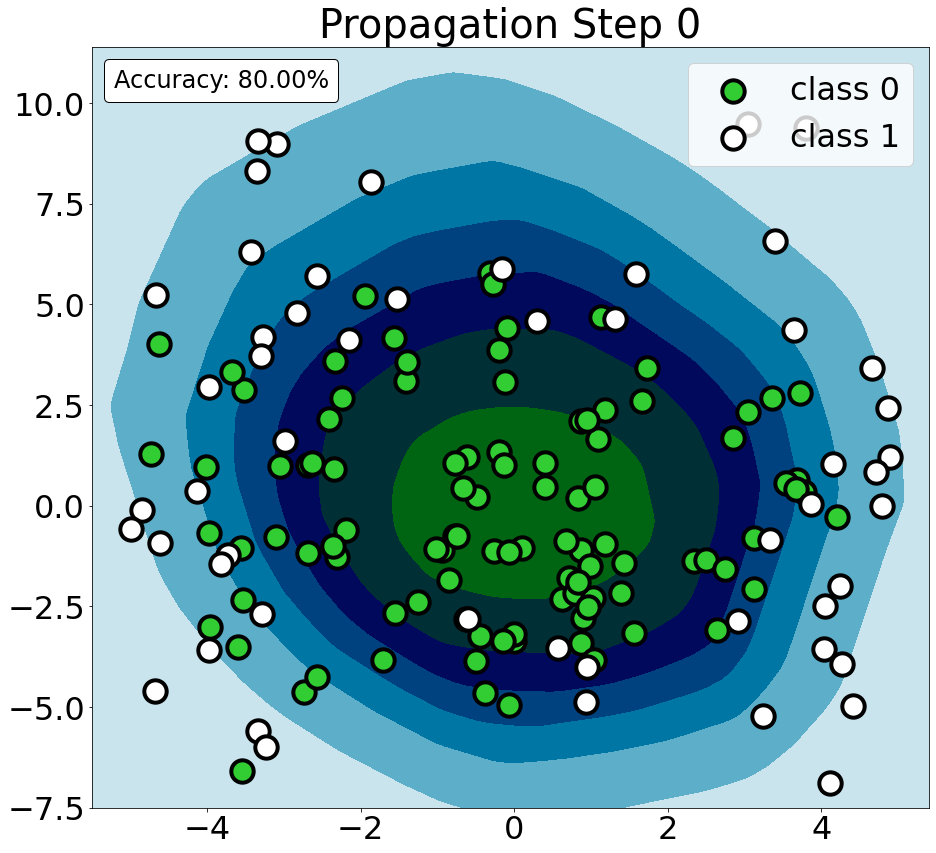

(array([ 43, 104, 394, 455]),)
tensor([361, 251,  62, 260])
tensor(True) tensor(False) tensor(False)
tensor([False, False,  True, False]) tensor([False,  True, False,  True]) tensor([ True, False, False, False])
----
tensor([ 18, 434])
tensor(True) tensor(False) tensor(False)
tensor([ True, False]) tensor([False, False]) tensor([False,  True])
----
tensor([  1,  66, 113])
tensor(False) tensor(False) tensor(True)
tensor([True, True, True]) tensor([False, False, False]) tensor([False, False, False])
----
tensor([ 16, 326, 399, 479])
tensor(False) tensor(False) tensor(True)
tensor([ True, False, False, False]) tensor([False,  True, False, False]) tensor([False, False,  True,  True])
----


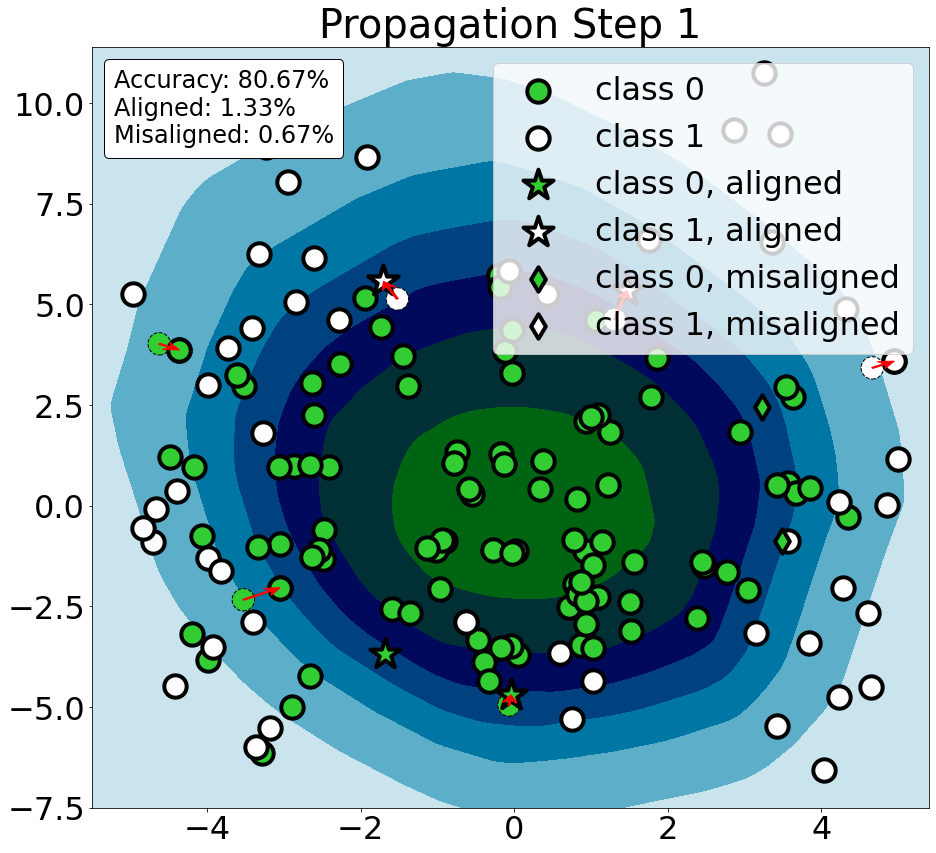

(array([ 15, 345, 389, 390]),)
tensor([306, 303, 333, 185])
tensor(True) tensor(False) tensor(False)
tensor([False, False, False, False]) tensor([True, True, True, True]) tensor([False, False, False, False])
----
tensor([ 94, 217, 253, 448])
tensor(False) tensor(True) tensor(False)
tensor([ True, False, False, False]) tensor([False,  True,  True, False]) tensor([False, False, False,  True])
----
tensor([ 24, 170])
tensor(False) tensor(False) tensor(True)
tensor([ True, False]) tensor([False,  True]) tensor([False, False])
----
tensor([281, 490])
tensor(False) tensor(False) tensor(True)
tensor([False, False]) tensor([ True, False]) tensor([False,  True])
----


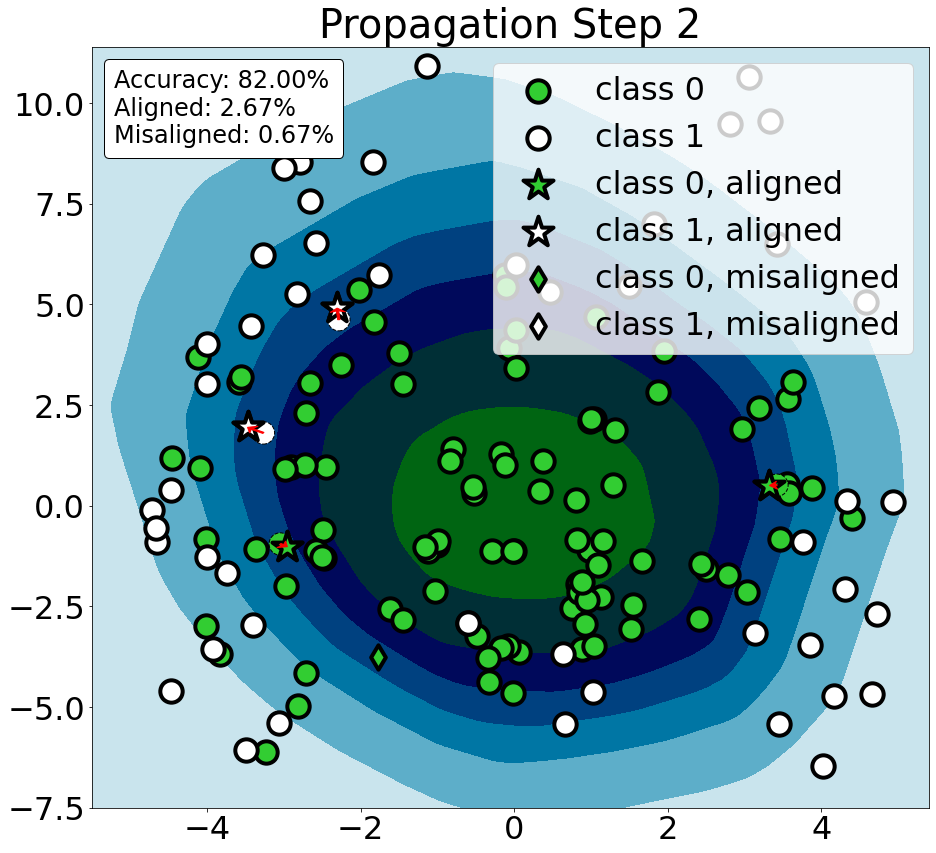

(array([437]),)
tensor([169, 289])
tensor(False) tensor(False) tensor(True)
tensor([False, False]) tensor([True, True]) tensor([False, False])
----


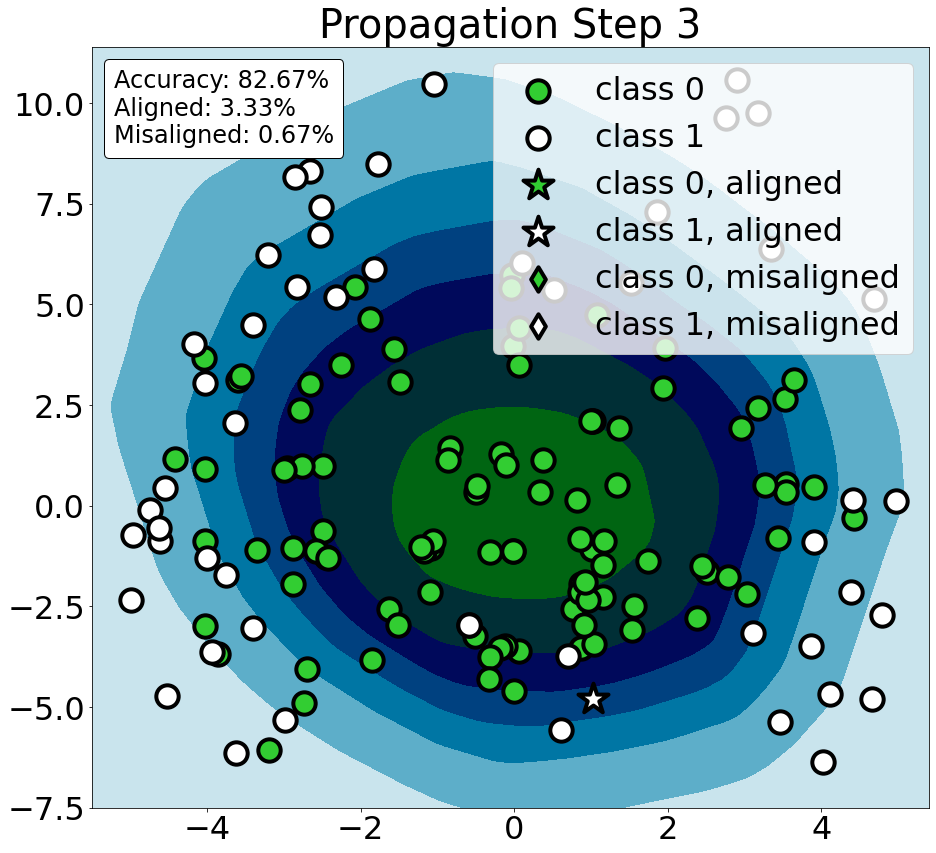

(array([], dtype=int64),)


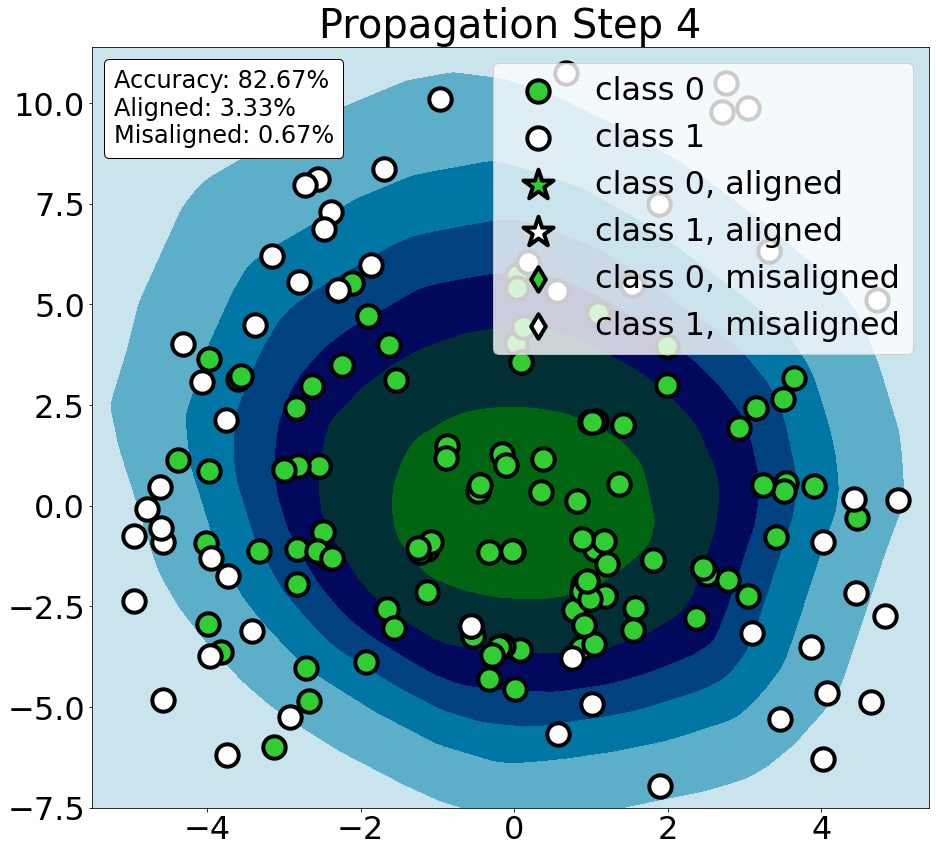

(array([], dtype=int64),)


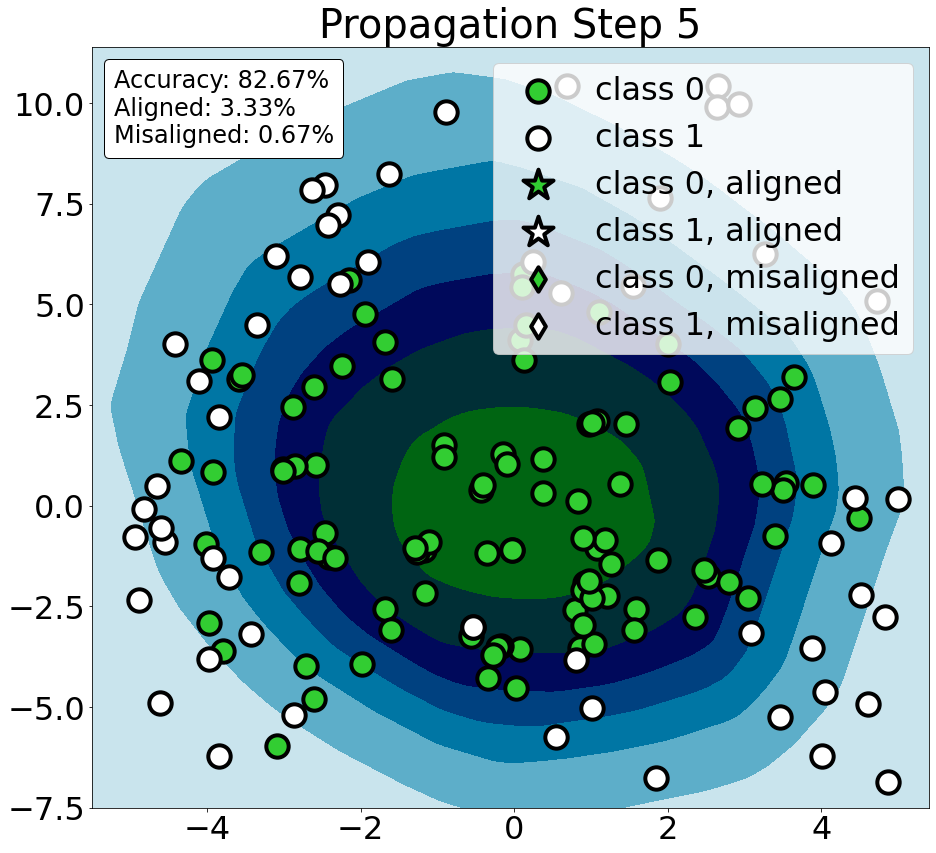

(array([], dtype=int64),)


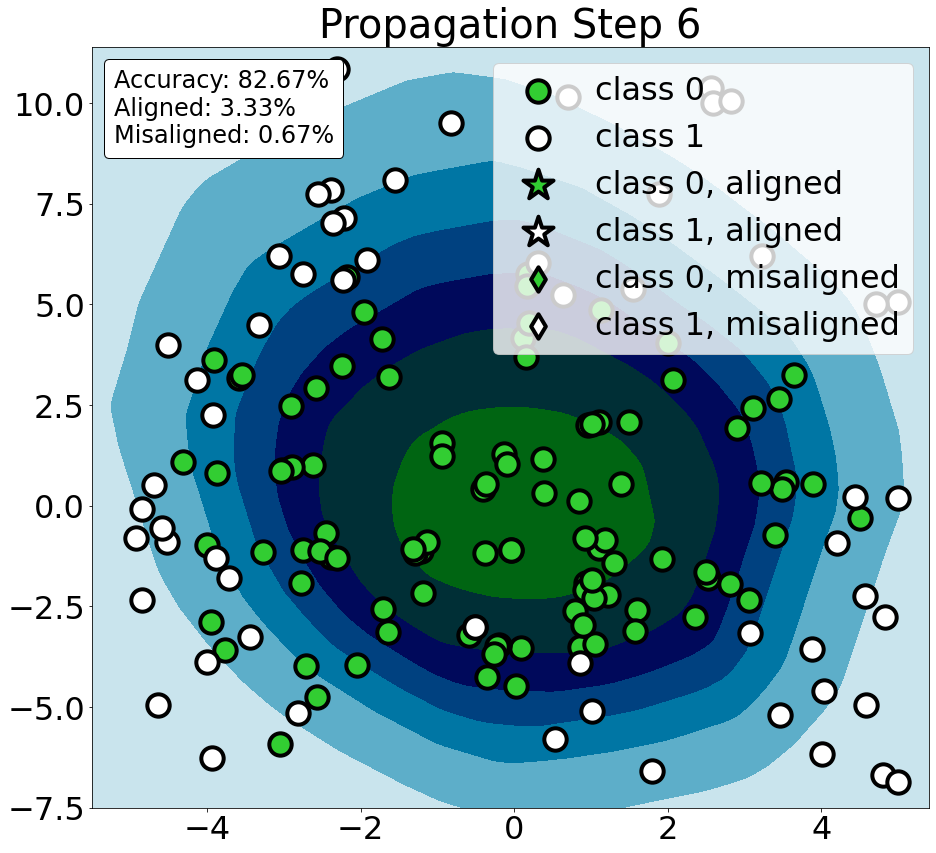

(array([321]),)
tensor([160, 192, 499])
tensor(False) tensor(True) tensor(False)
tensor([False, False, False]) tensor([ True,  True, False]) tensor([False, False,  True])
----


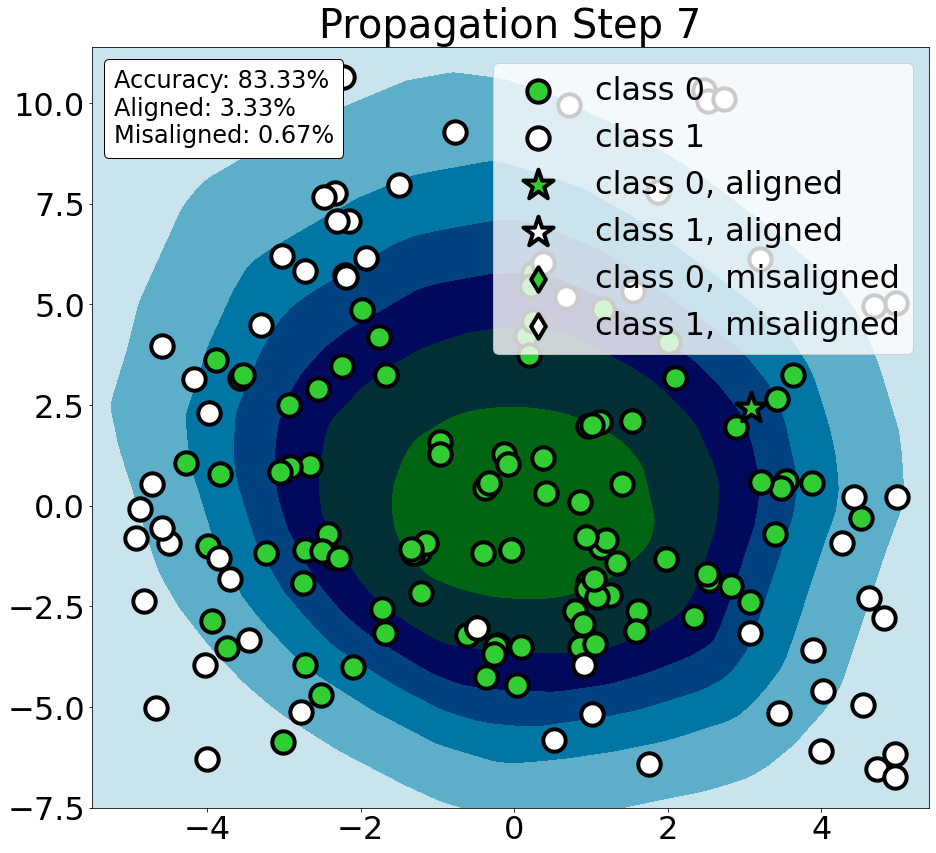

(array([], dtype=int64),)


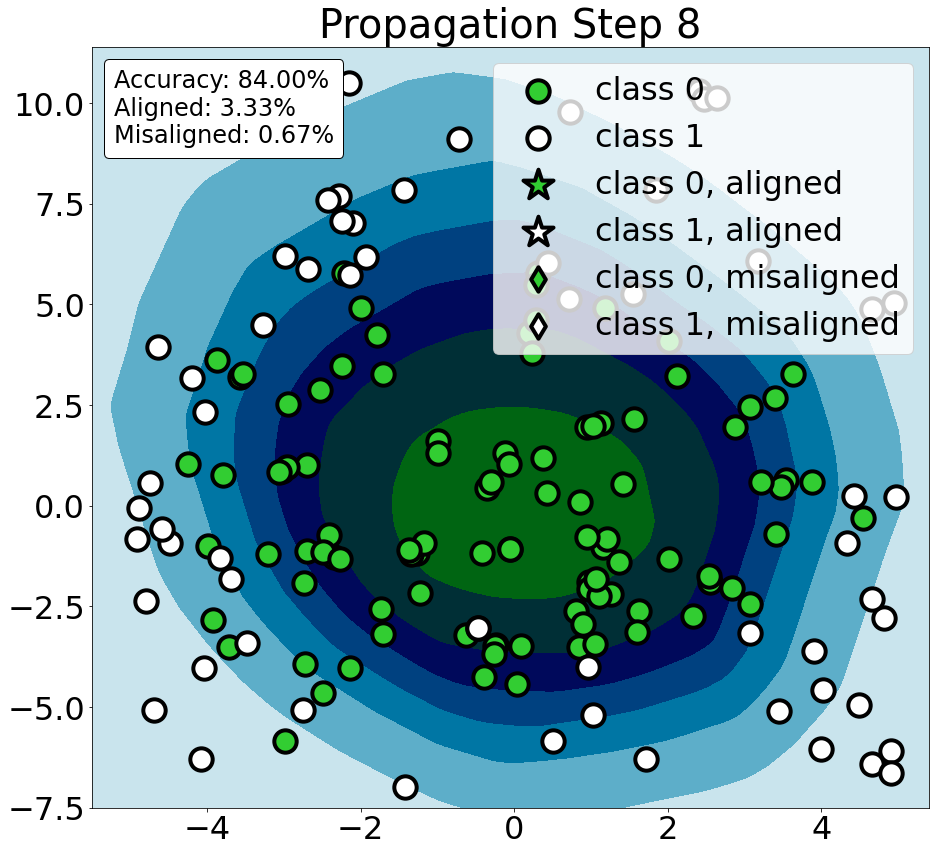

(array([343]),)
tensor([ 75, 142, 218, 277, 306, 333])
tensor(False) tensor(True) tensor(False)
tensor([ True,  True, False, False, False, False]) tensor([False, False,  True,  True,  True,  True]) tensor([False, False, False, False, False, False])
----


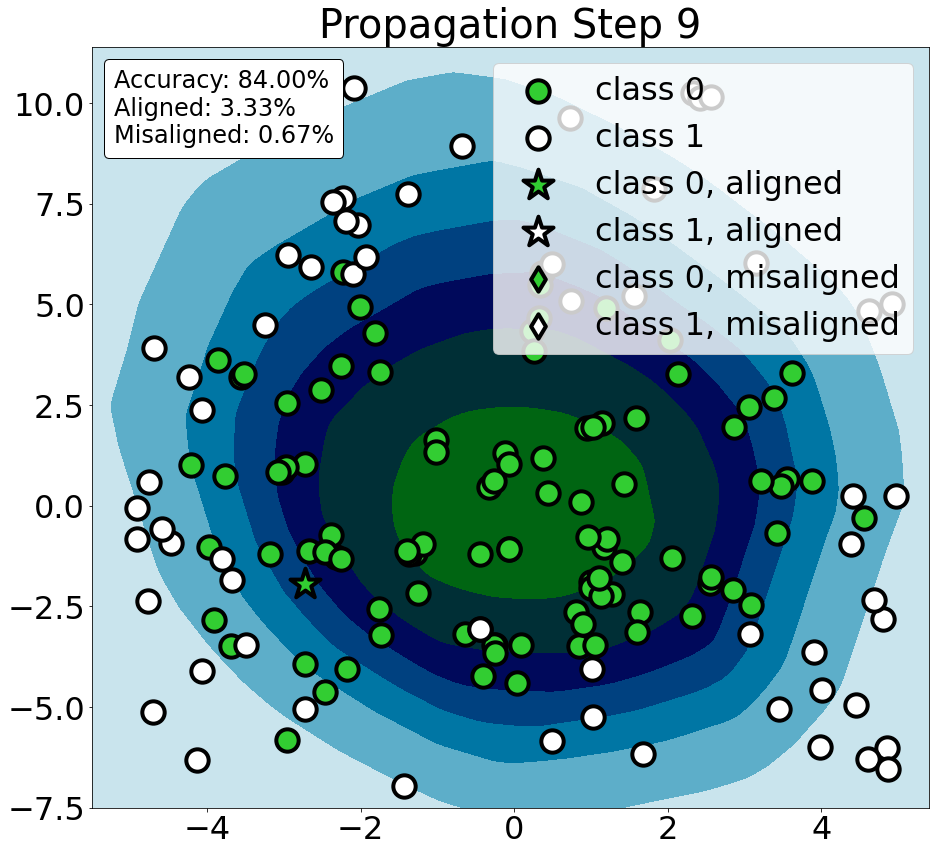

(array([], dtype=int64),)


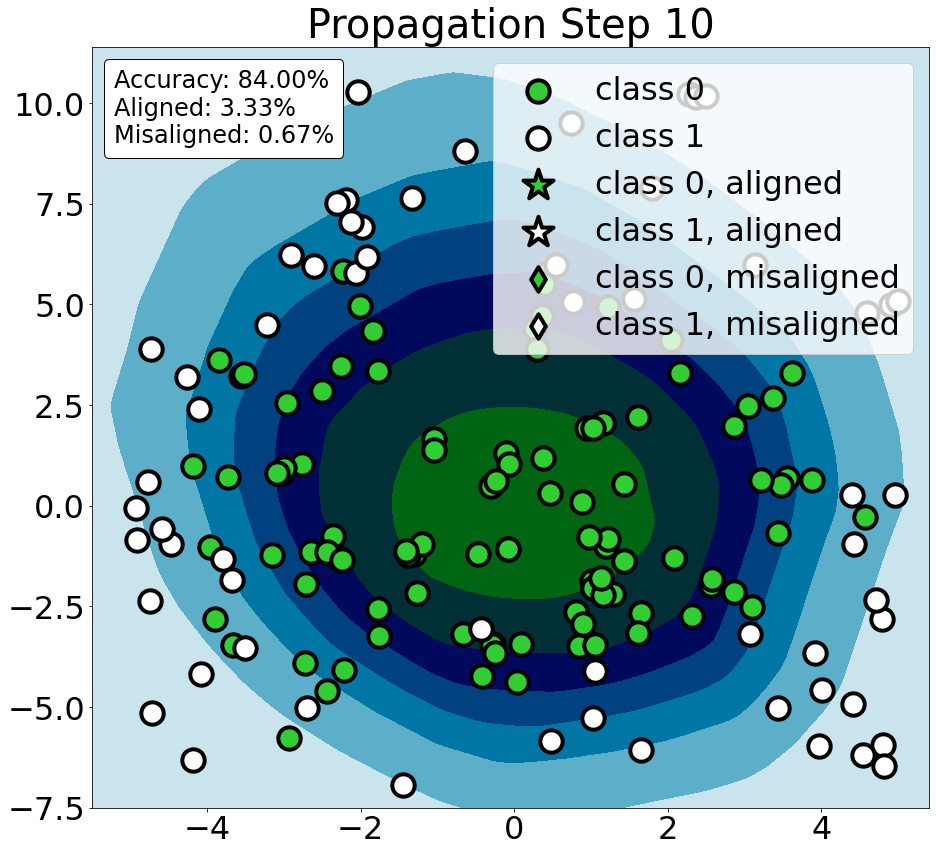

(array([], dtype=int64),)


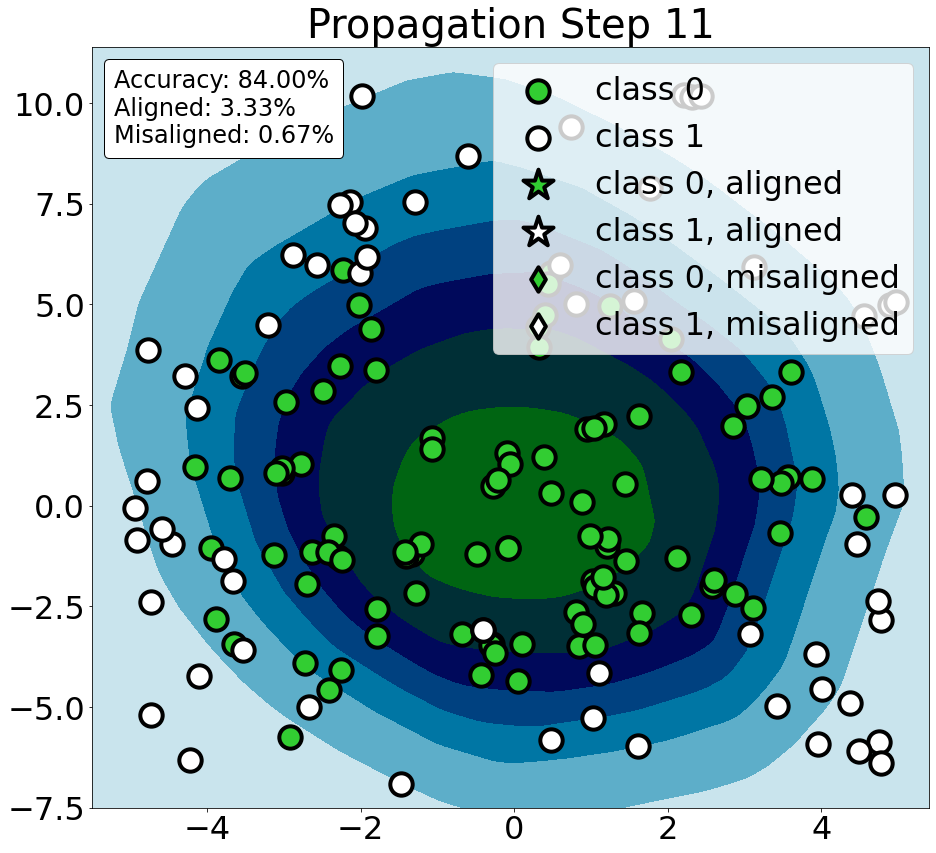

(array([], dtype=int64),)


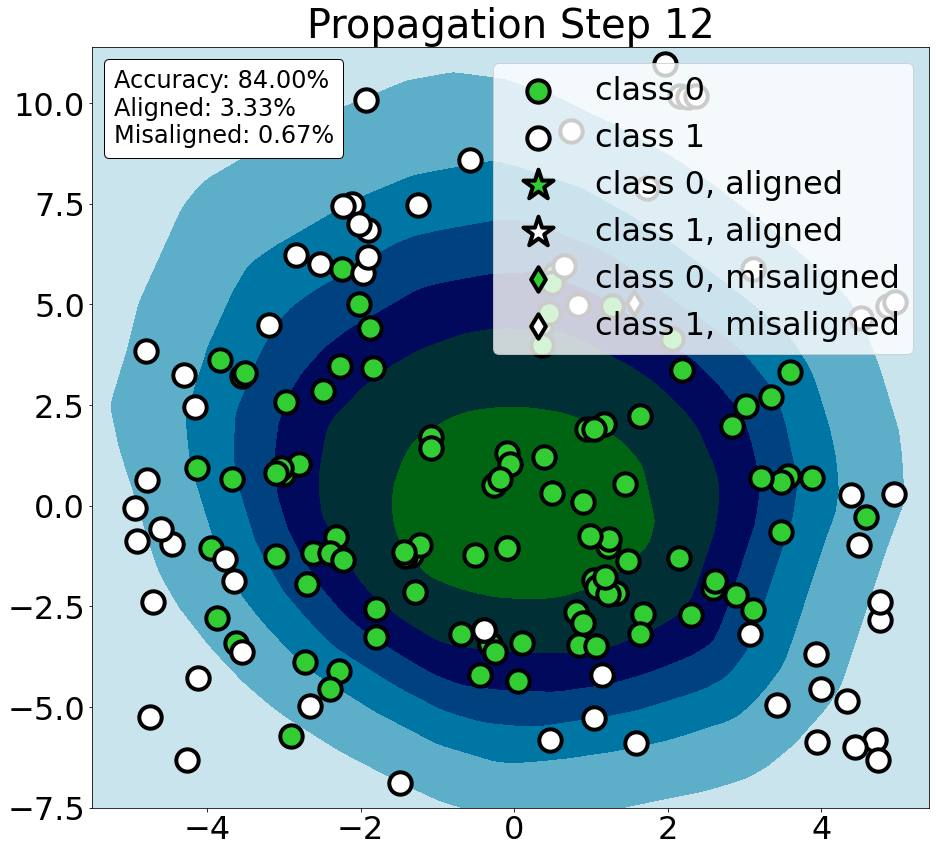

(array([78]),)
tensor([ 49, 215, 111, 259])
tensor(True) tensor(False) tensor(False)
tensor([ True, False,  True, False]) tensor([False,  True, False,  True]) tensor([False, False, False, False])
----


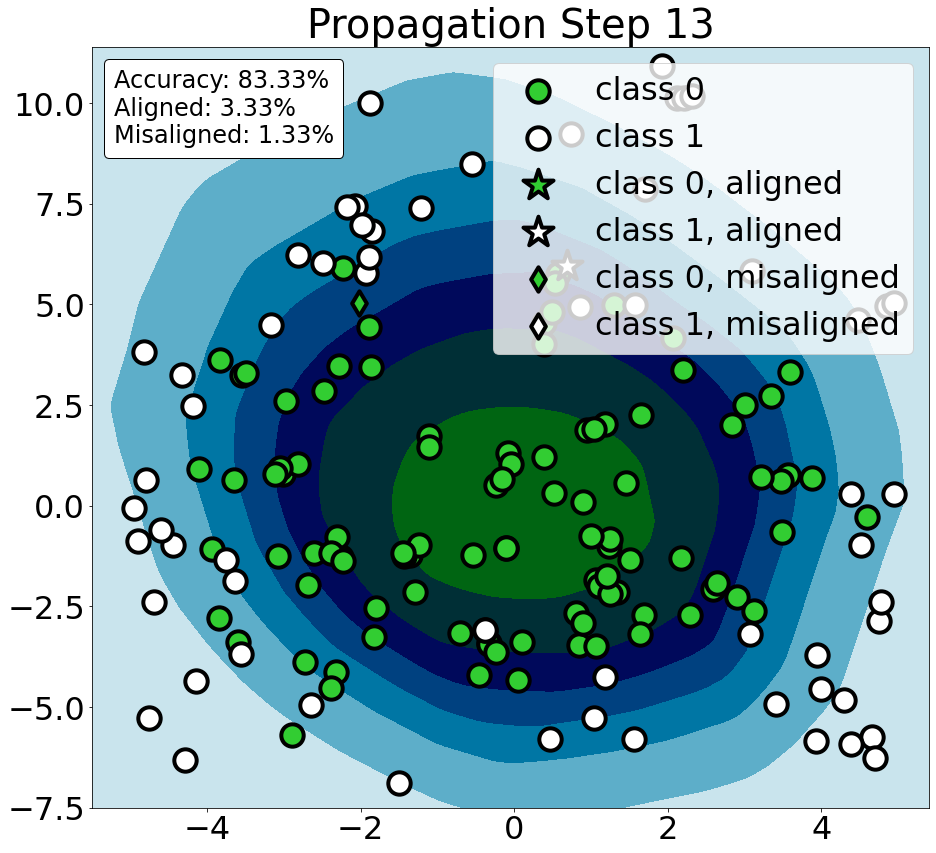

(array([], dtype=int64),)


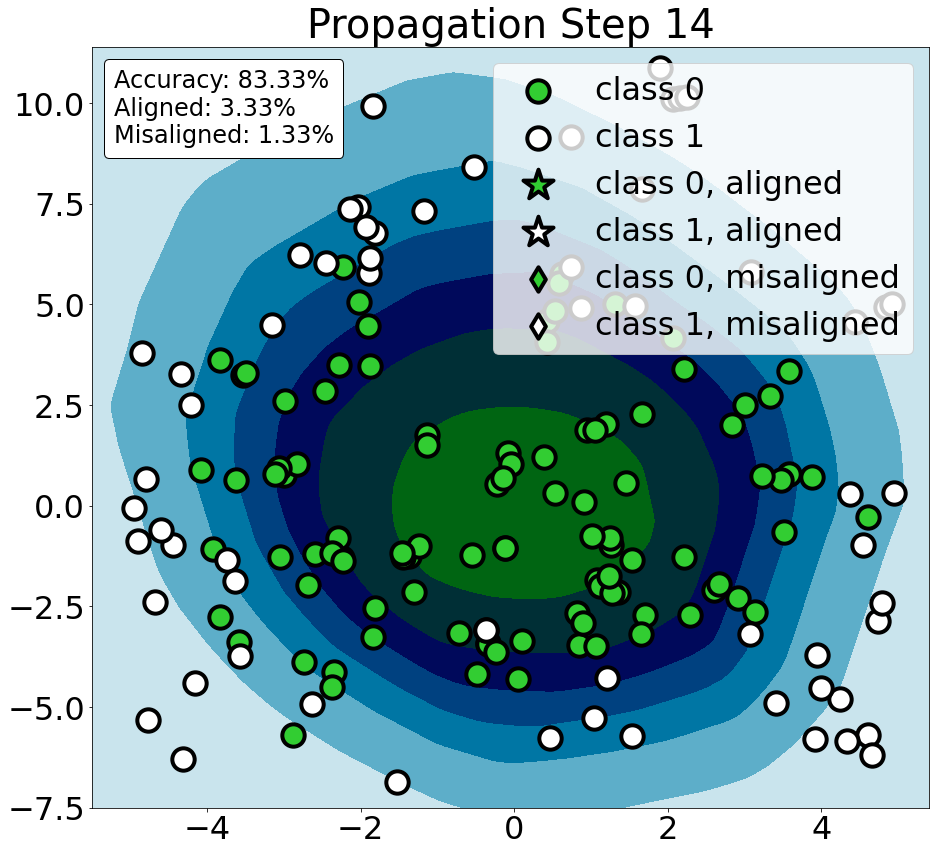

(array([], dtype=int64),)


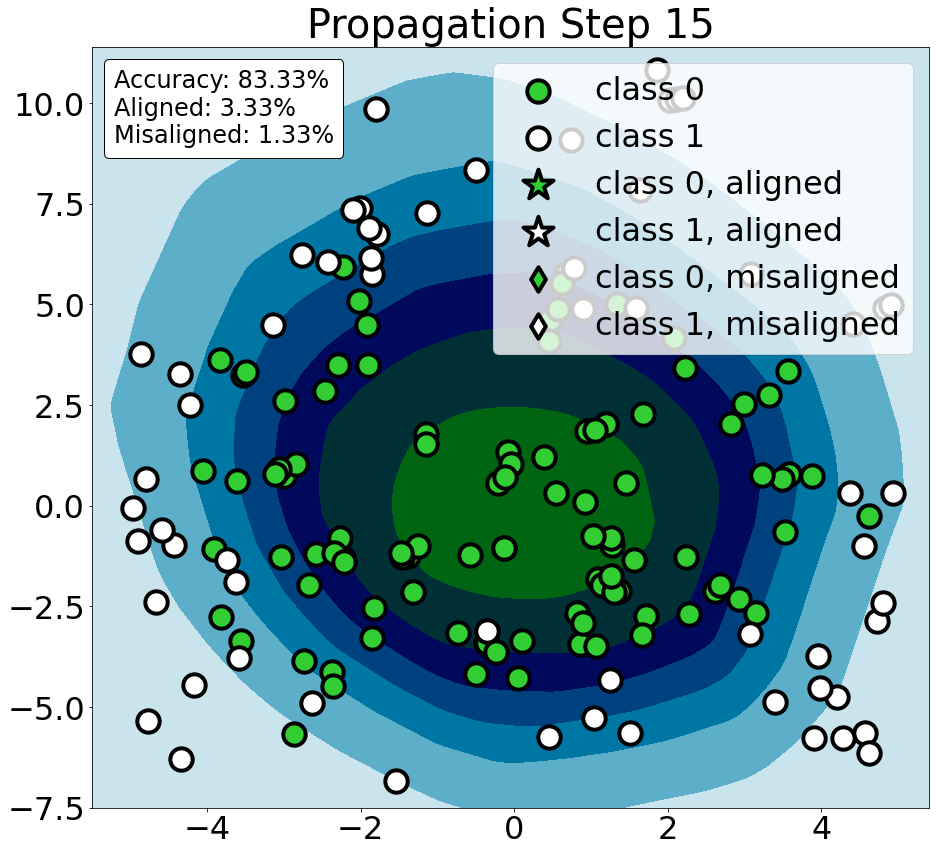

(array([], dtype=int64),)


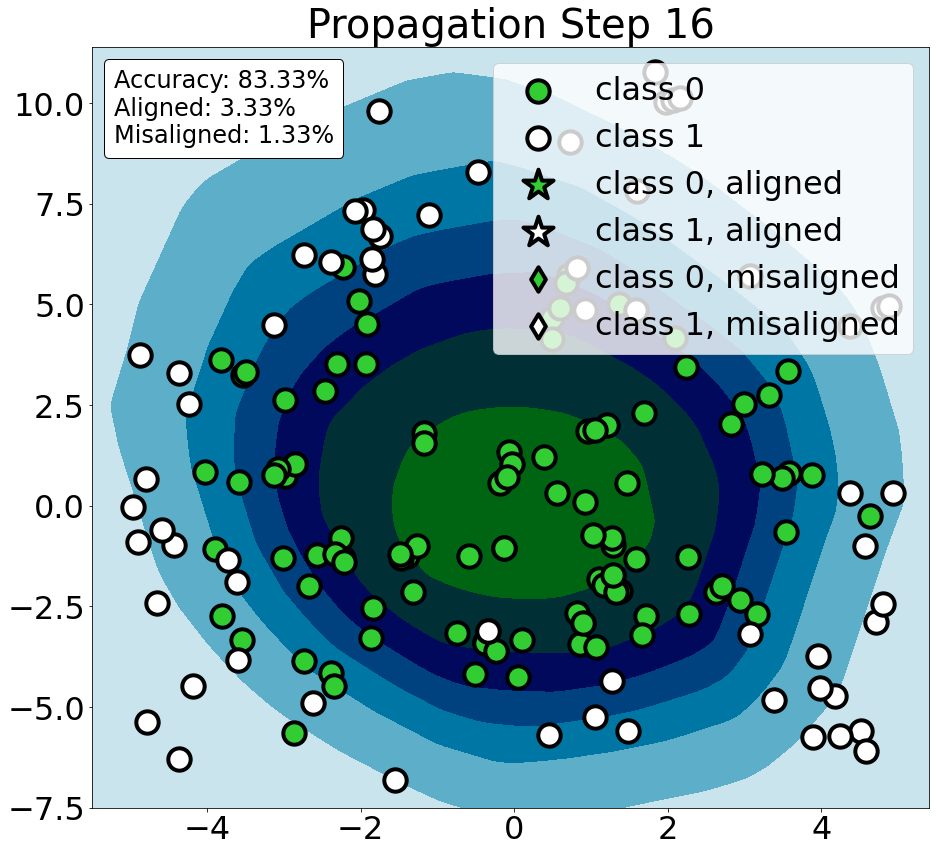

(array([], dtype=int64),)


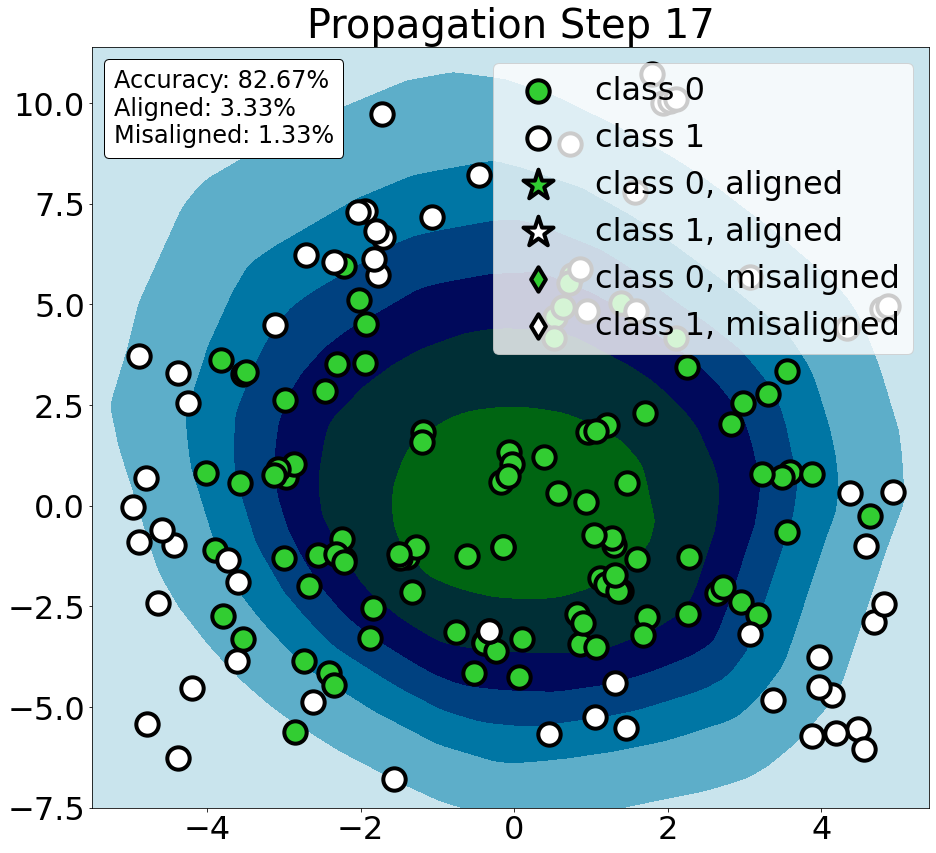

(array([], dtype=int64),)


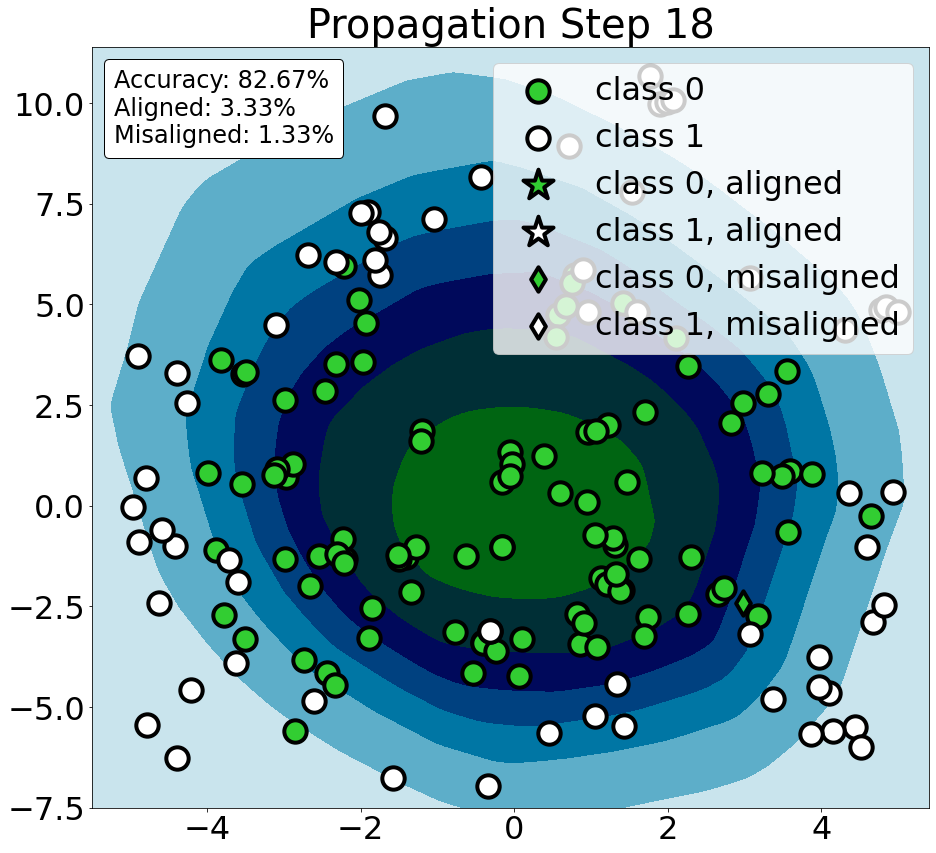

(array([], dtype=int64),)


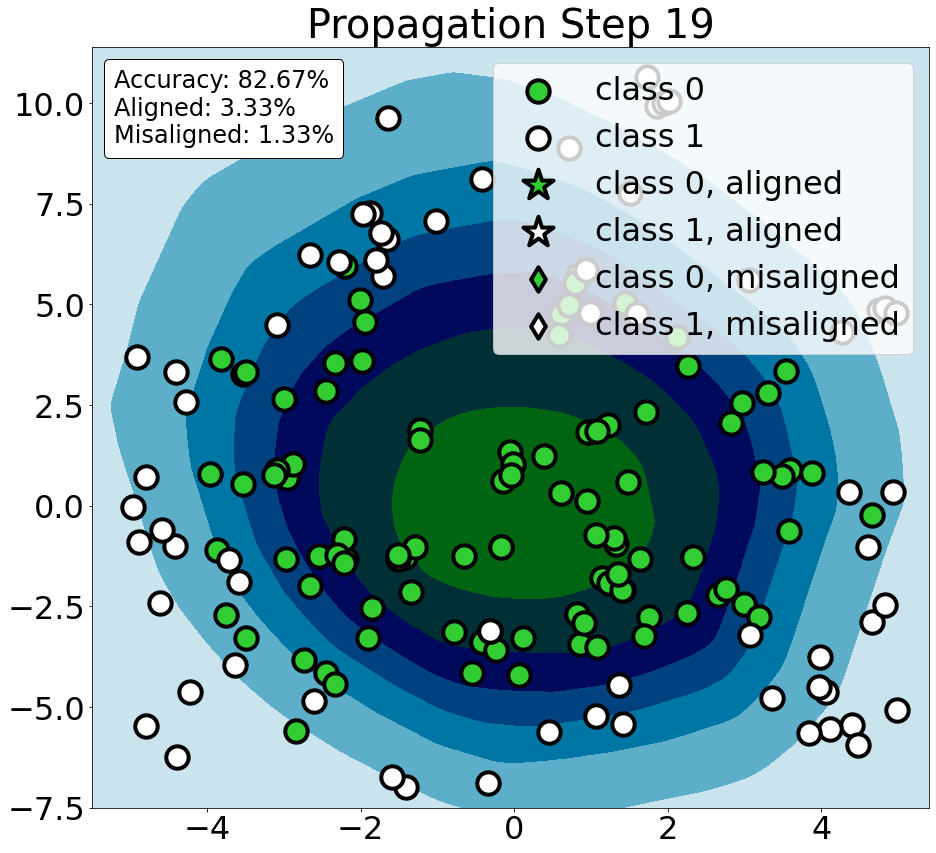

(array([], dtype=int64),)


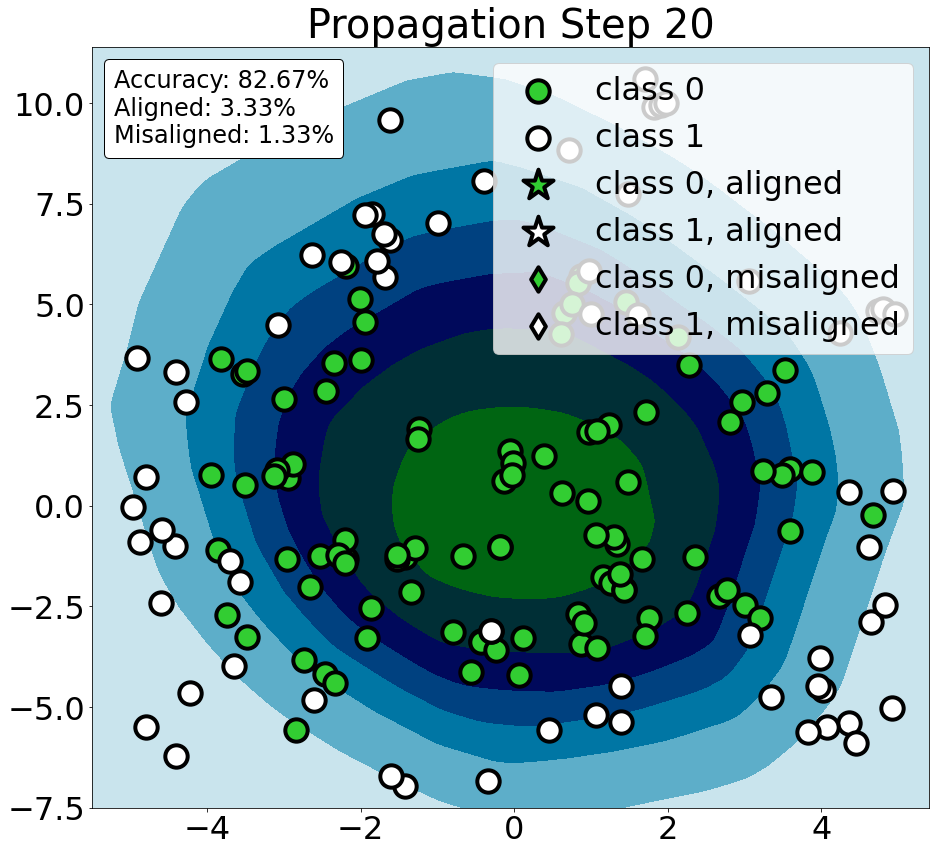

(array([], dtype=int64),)


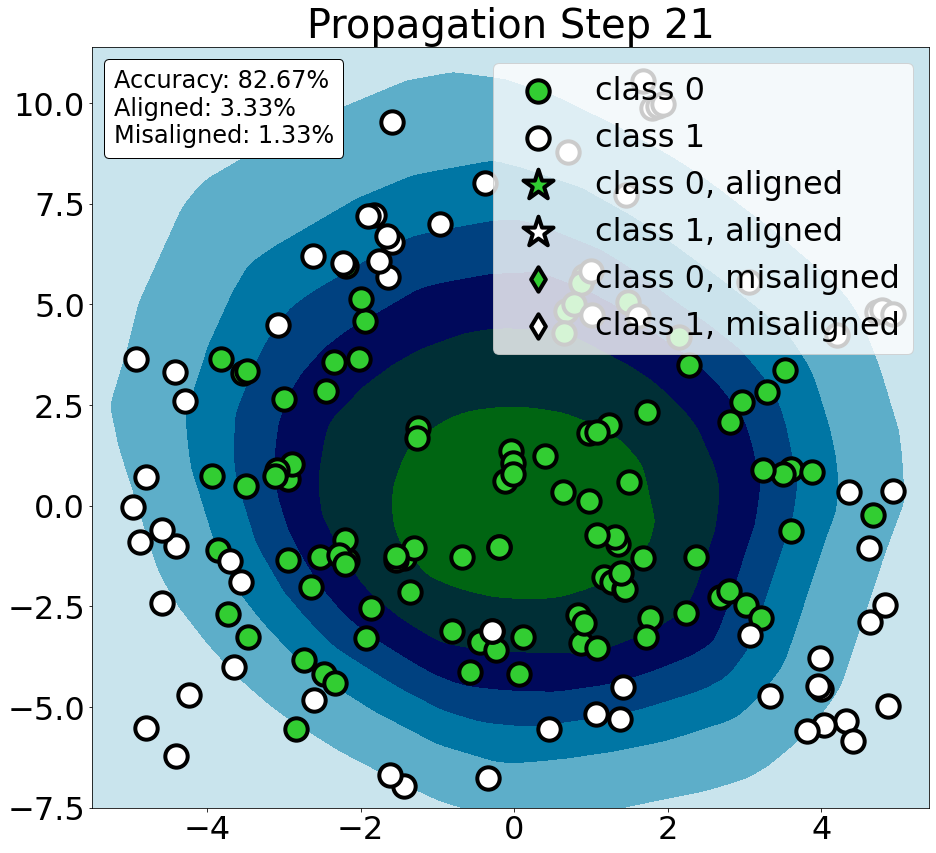

(array([], dtype=int64),)


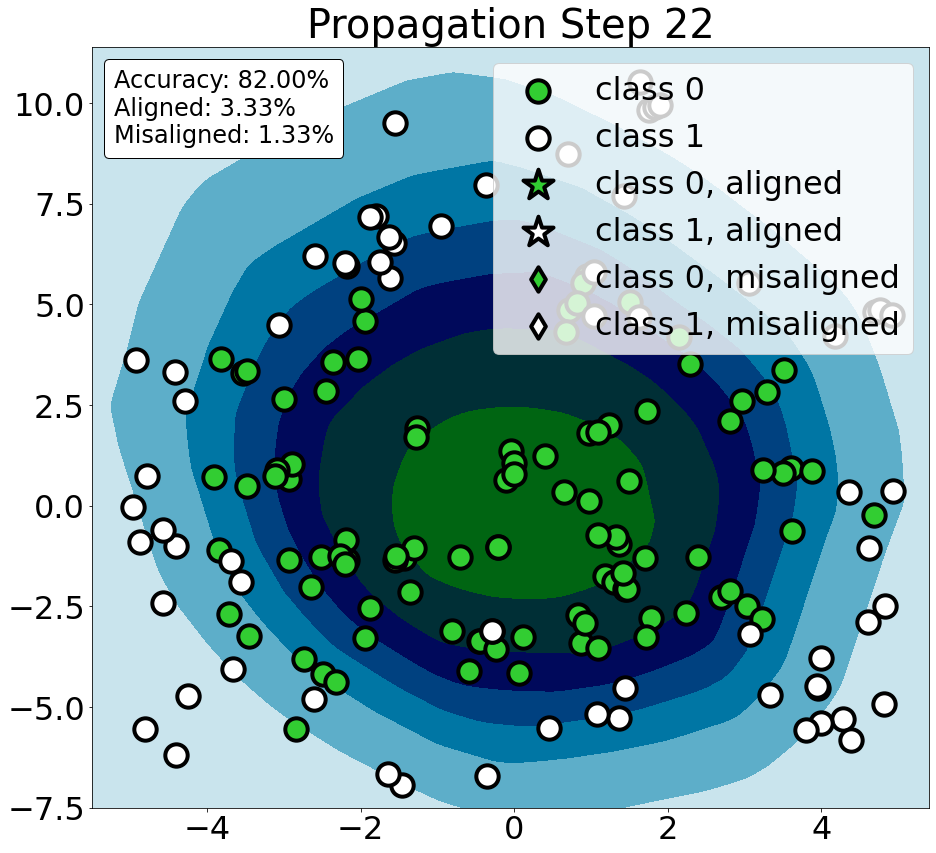

(array([], dtype=int64),)


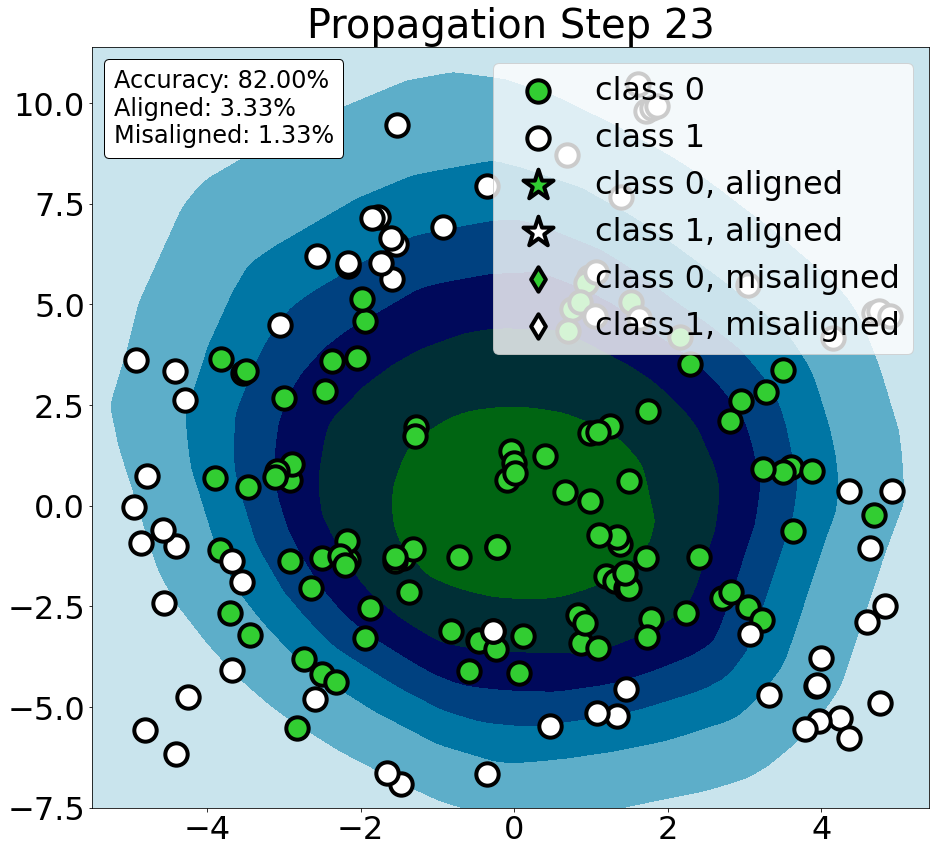

(array([], dtype=int64),)


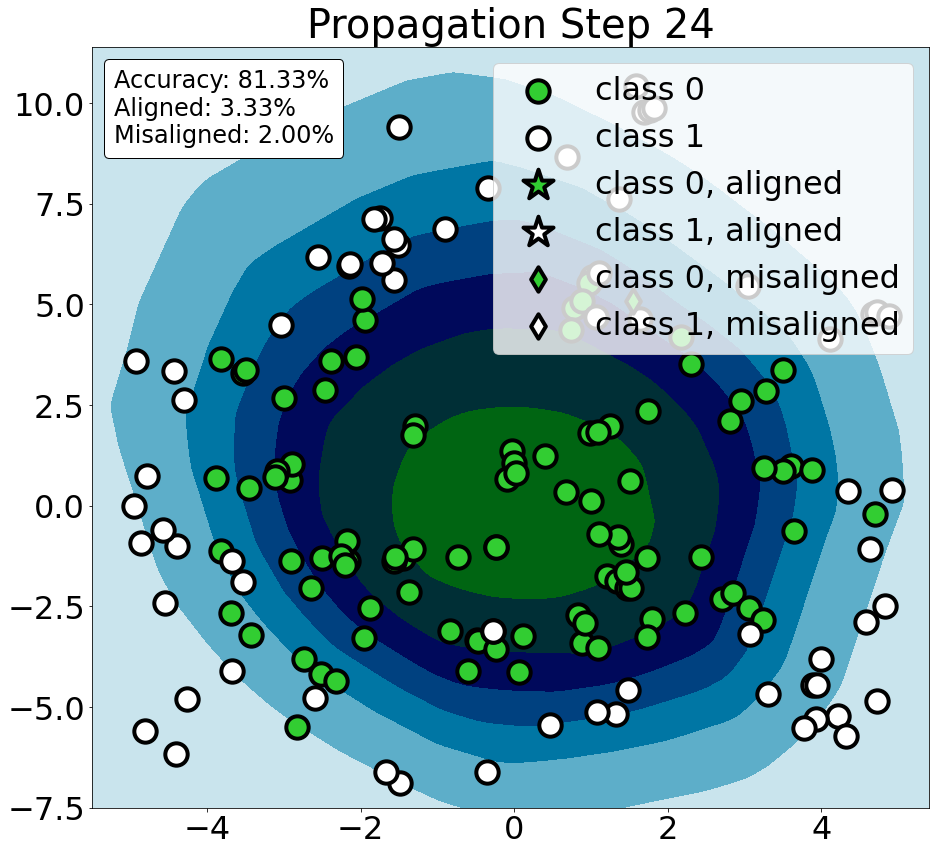

(array([303]),)
tensor([ 15, 167, 185, 190, 277])
tensor(False) tensor(True) tensor(False)
tensor([ True, False, False, False, False]) tensor([False,  True,  True,  True,  True]) tensor([False, False, False, False, False])
----


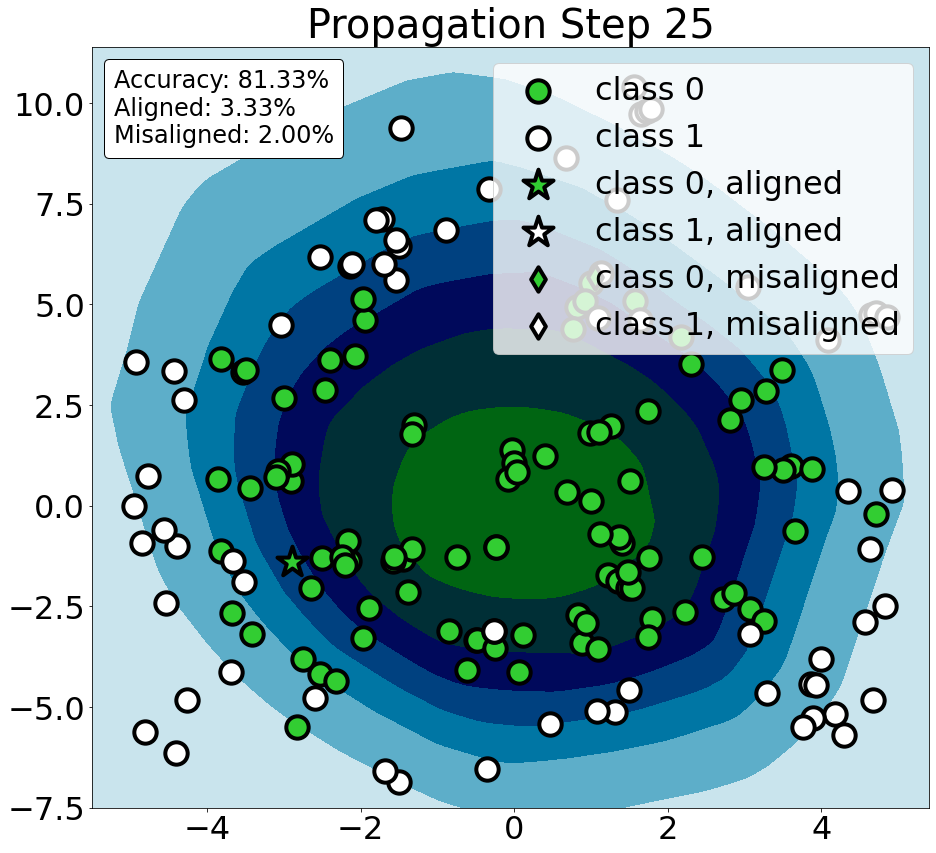

(array([159]),)
tensor([ 56, 384])
tensor(False) tensor(True) tensor(False)
tensor([ True, False]) tensor([False, False]) tensor([False,  True])
----


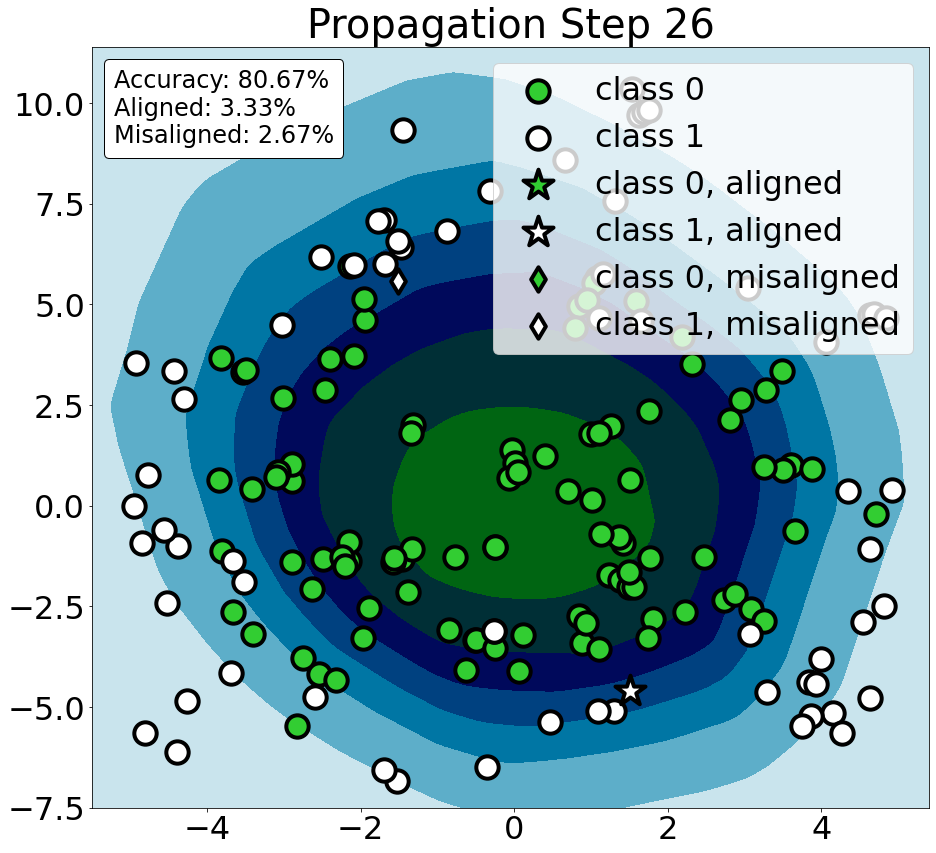

(array([], dtype=int64),)


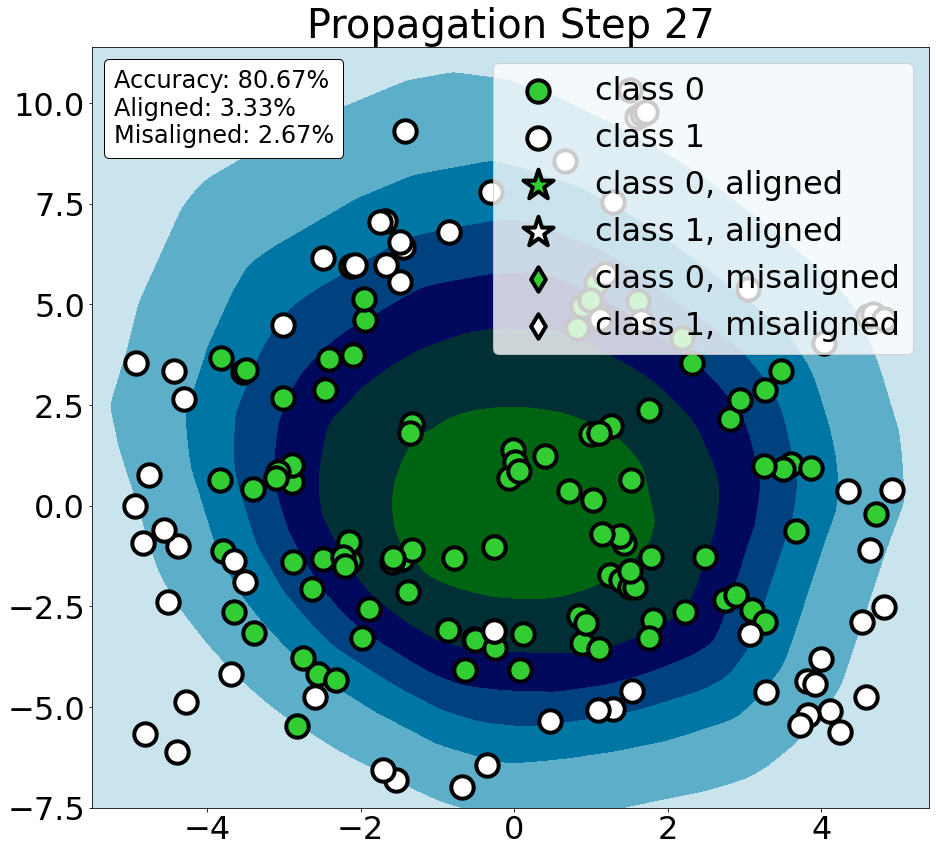

(array([], dtype=int64),)


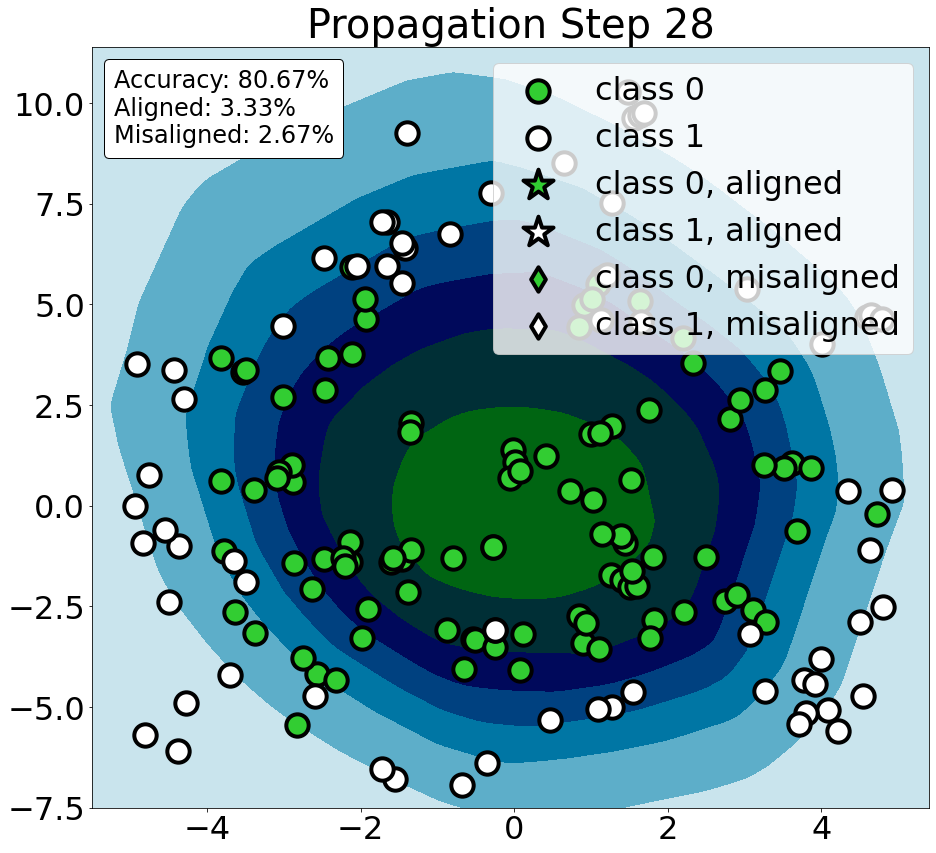

(array([], dtype=int64),)


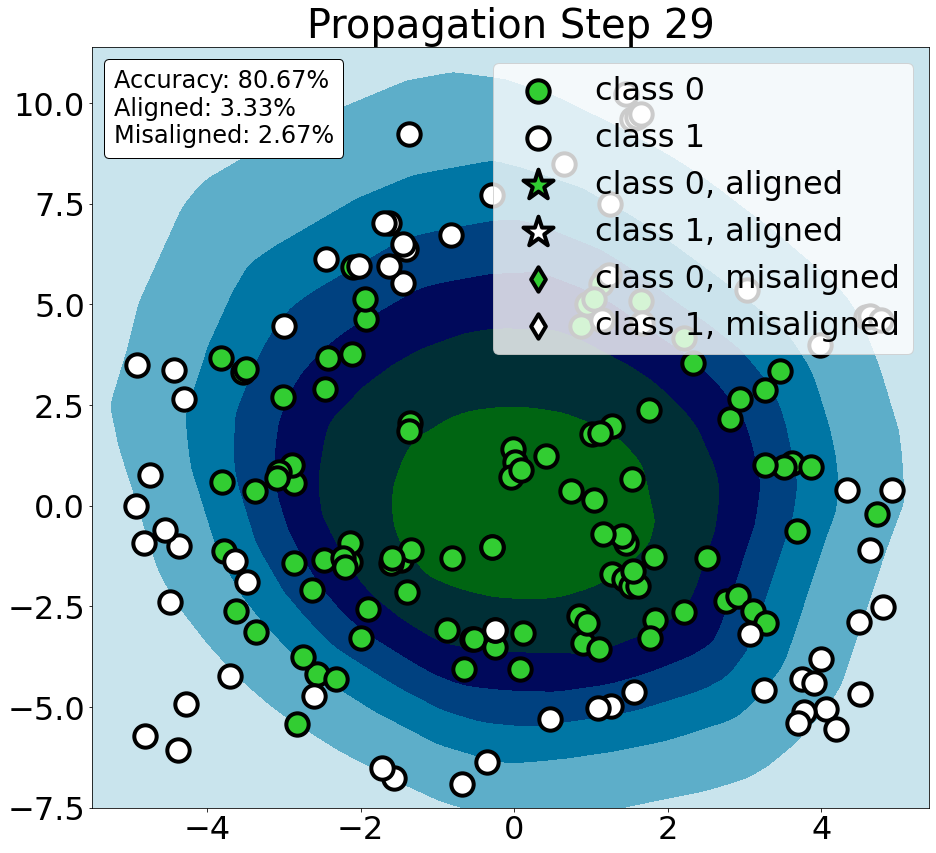

(array([465]),)
tensor([113, 362, 441])
tensor(False) tensor(False) tensor(True)
tensor([ True, False, False]) tensor([False, False, False]) tensor([False,  True,  True])
----


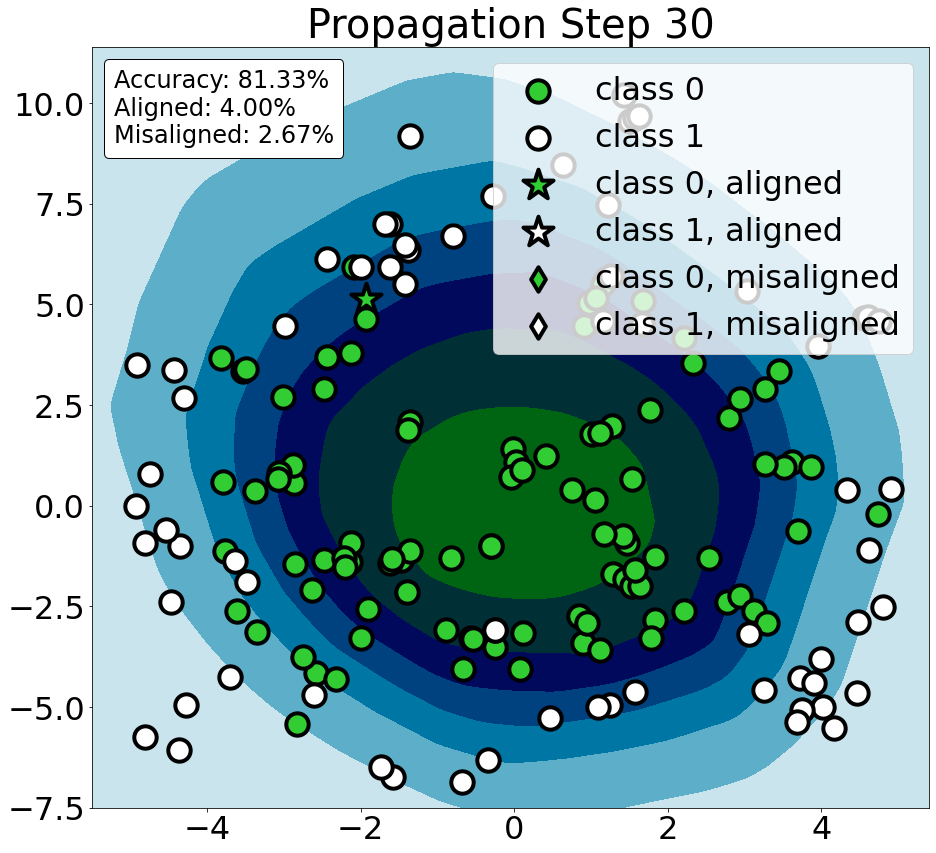

(array([], dtype=int64),)


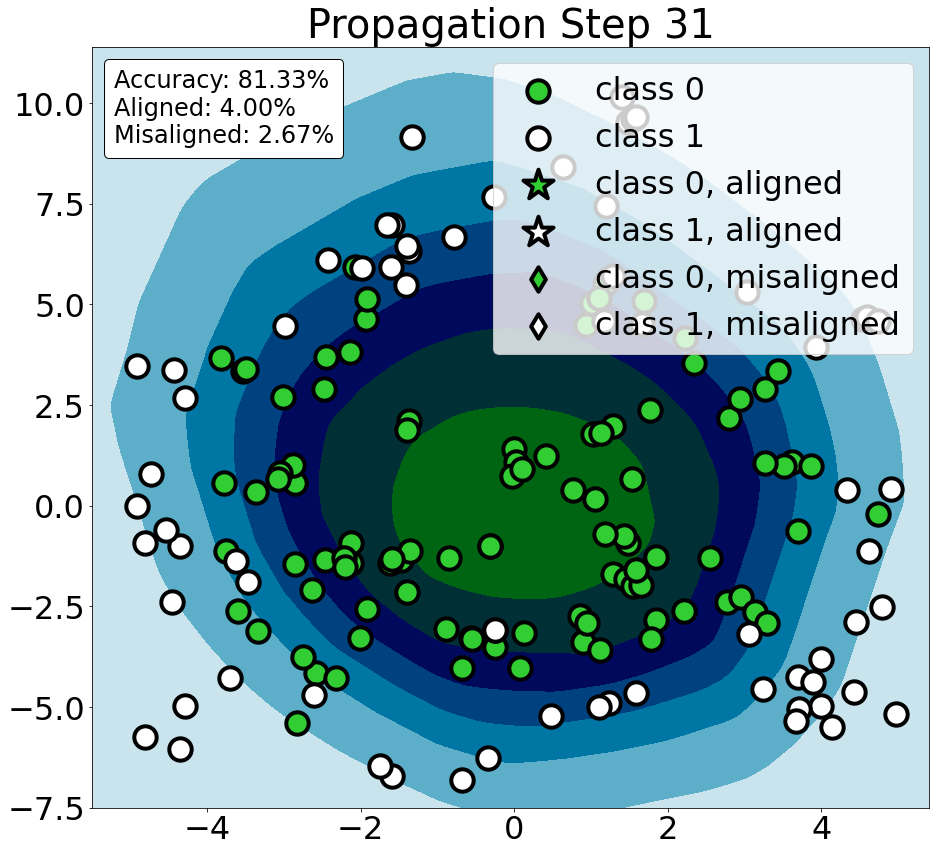

(array([], dtype=int64),)


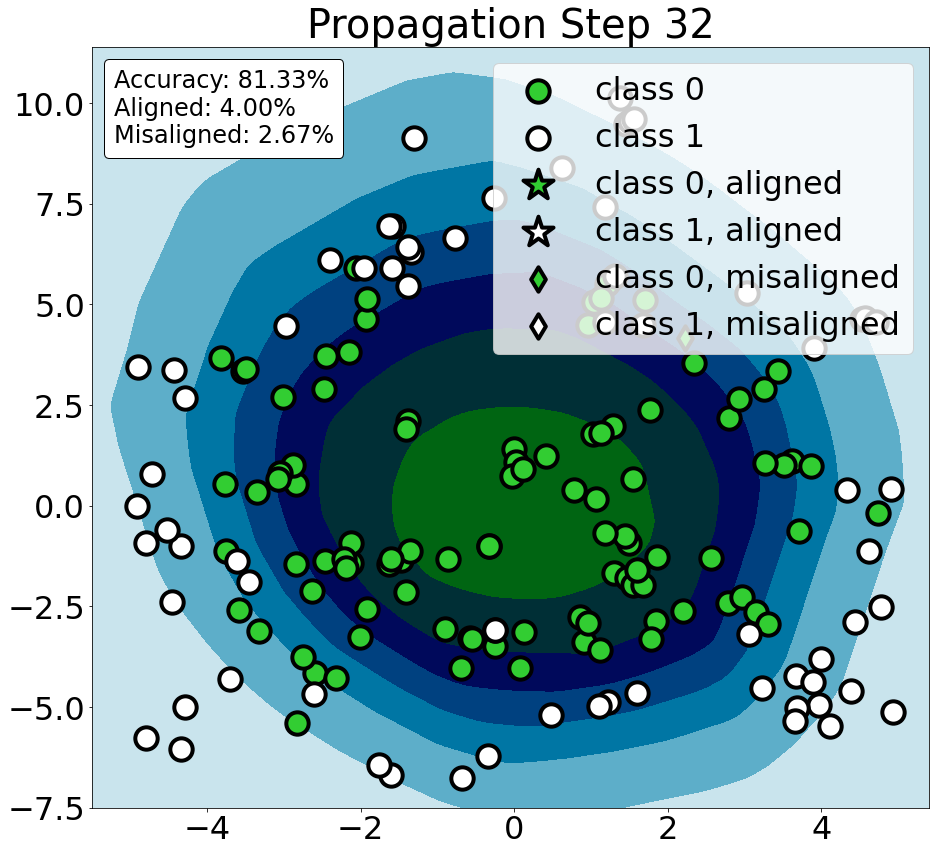

(array([], dtype=int64),)


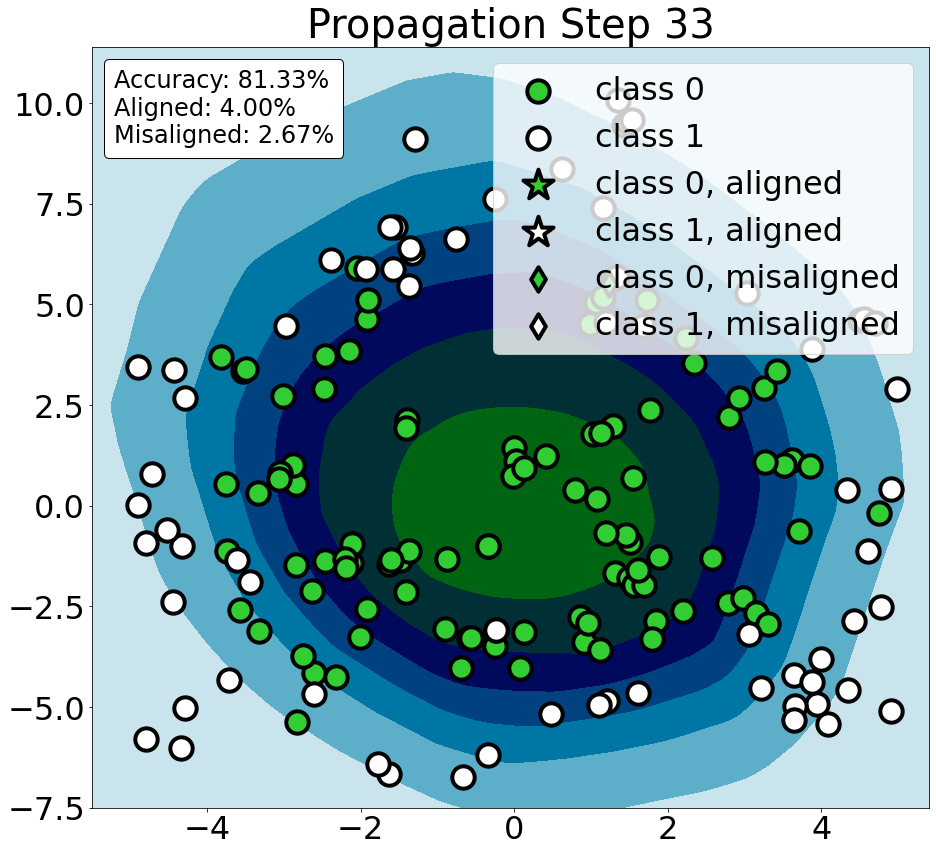

(array([], dtype=int64),)


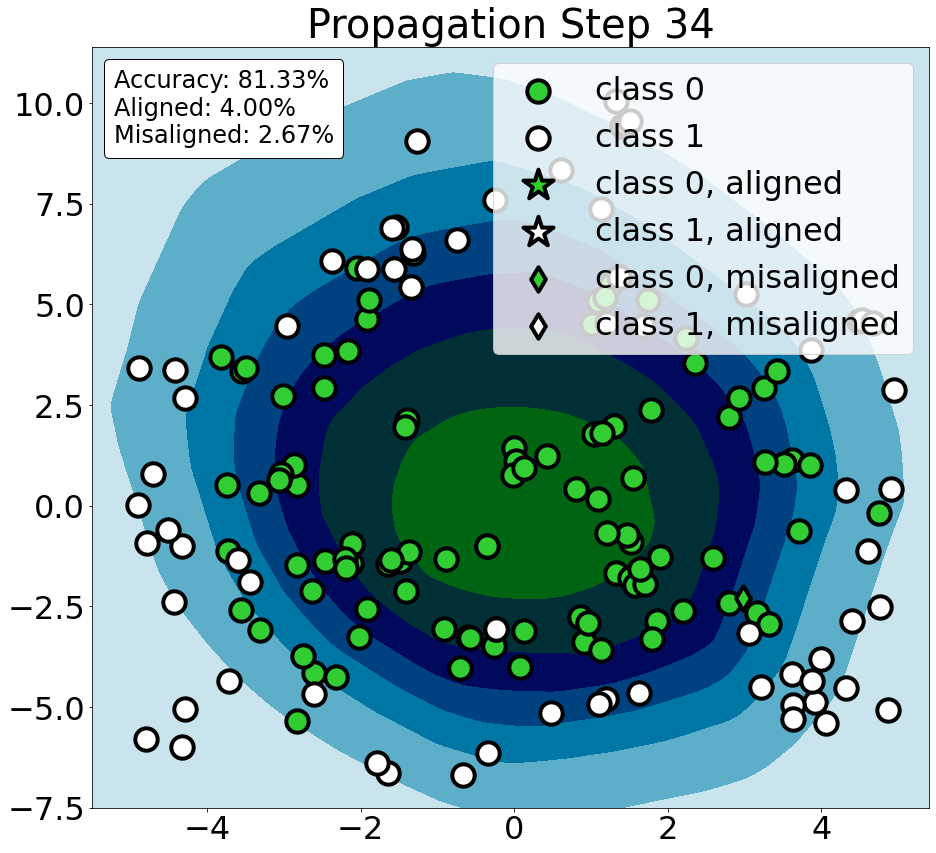

(array([], dtype=int64),)


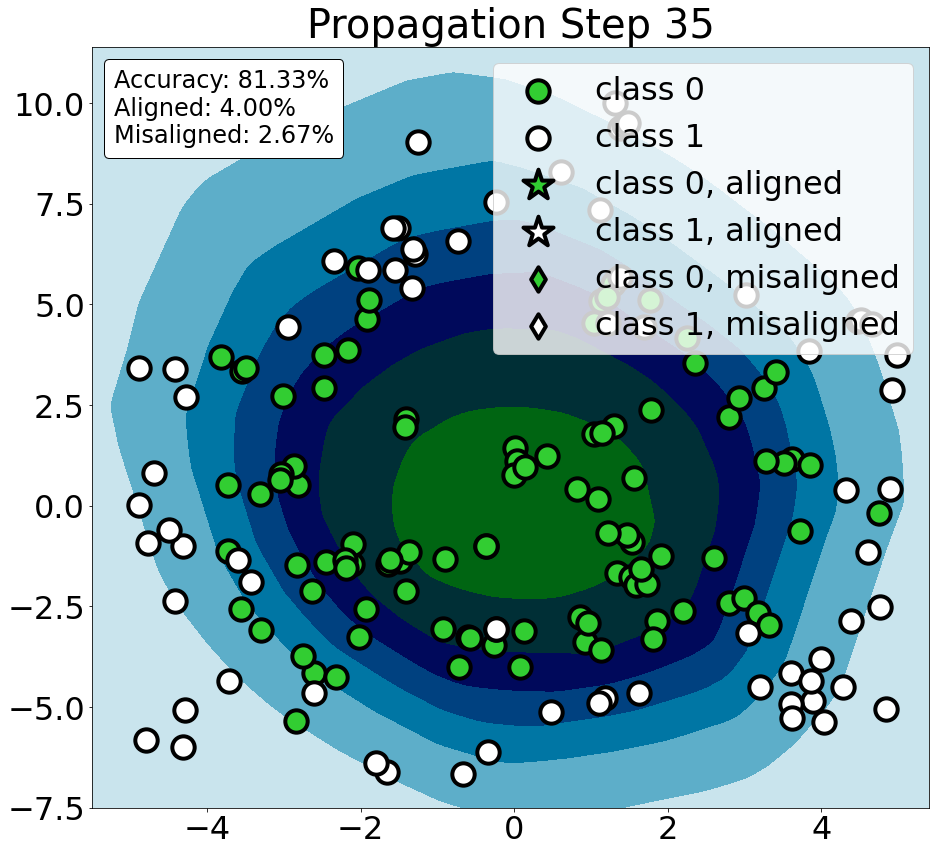

(array([], dtype=int64),)


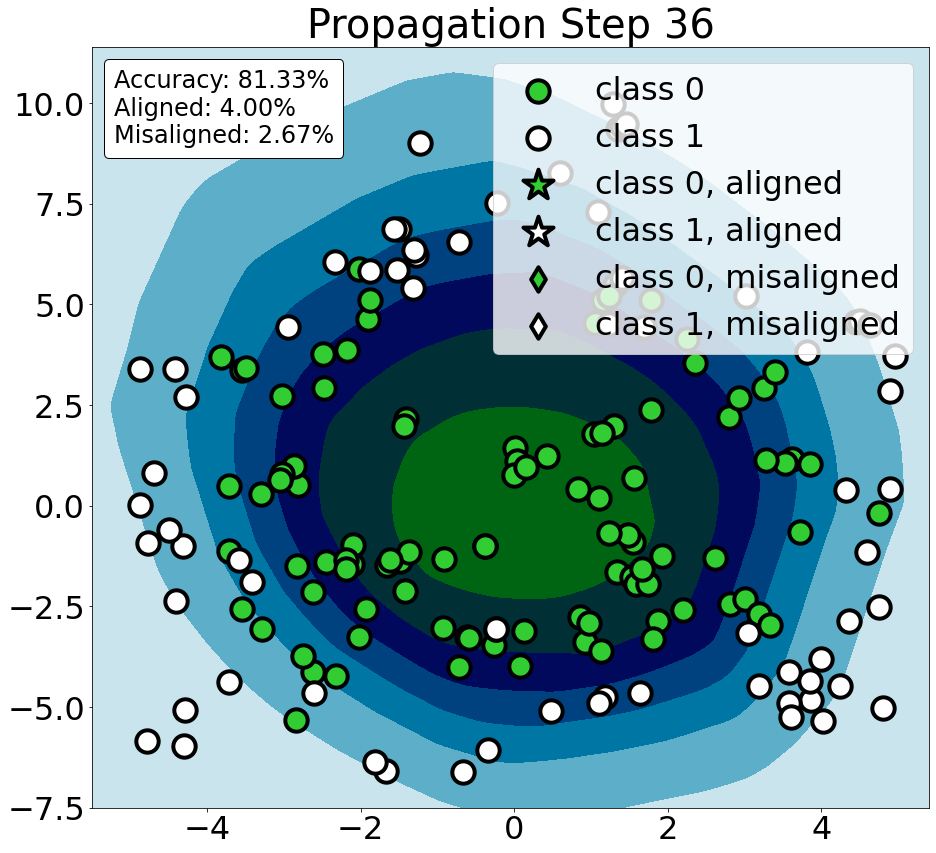

(array([], dtype=int64),)


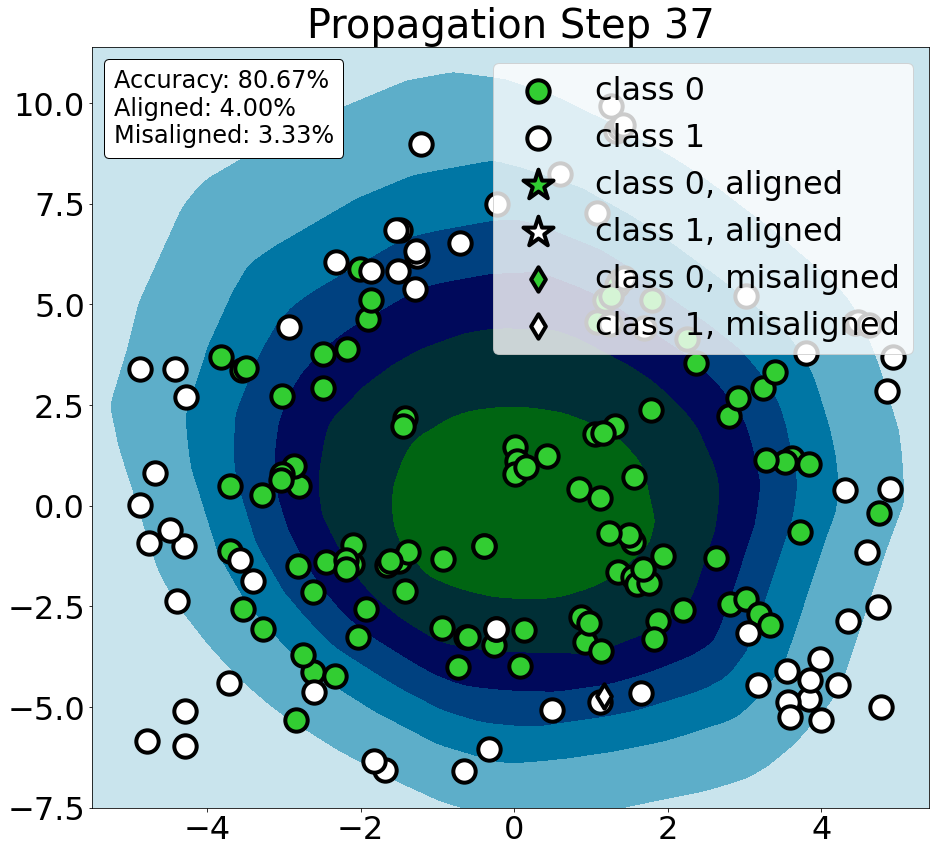

(array([], dtype=int64),)


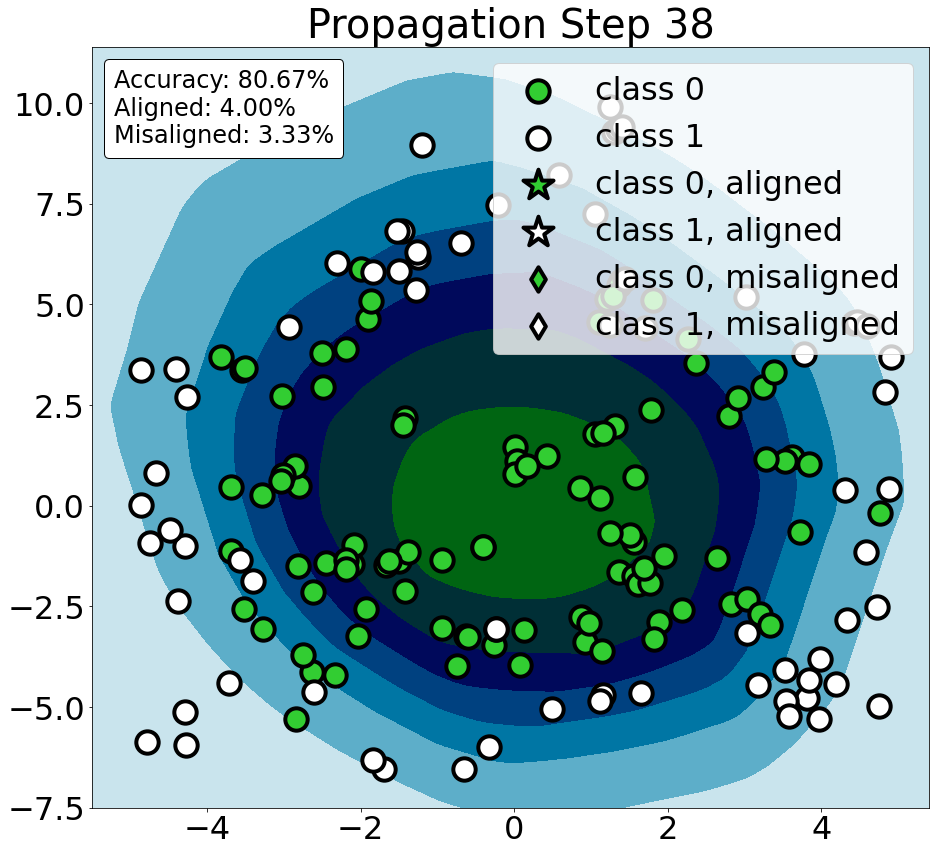

(array([], dtype=int64),)


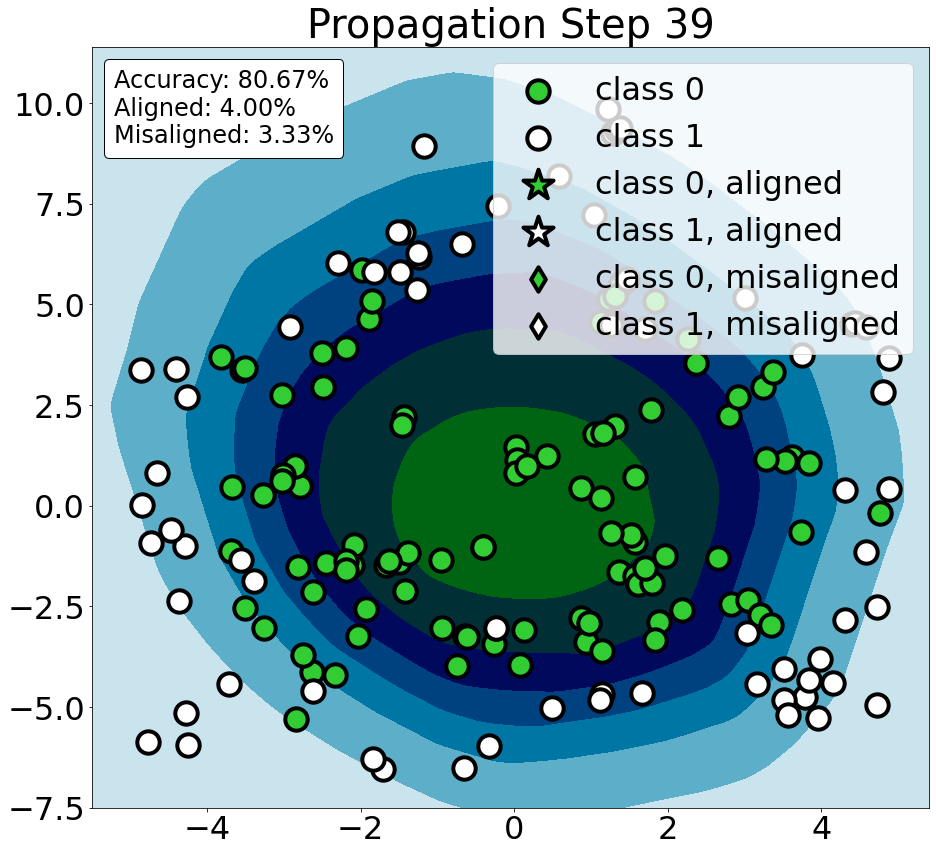

(array([], dtype=int64),)


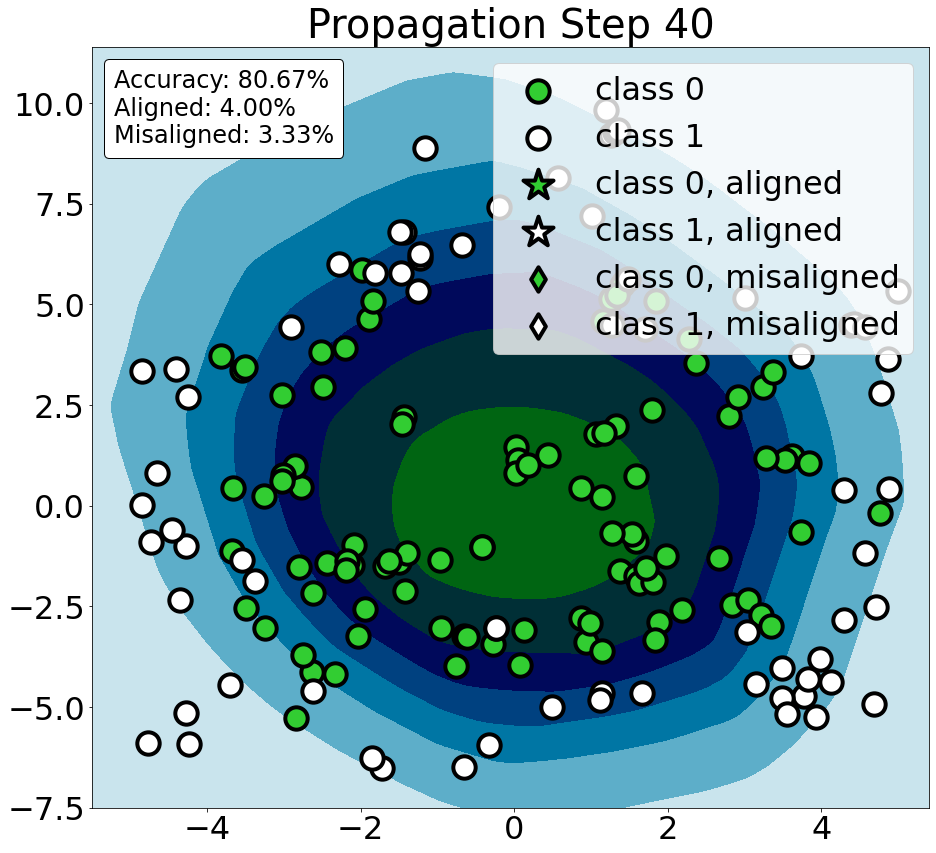

(array([], dtype=int64),)


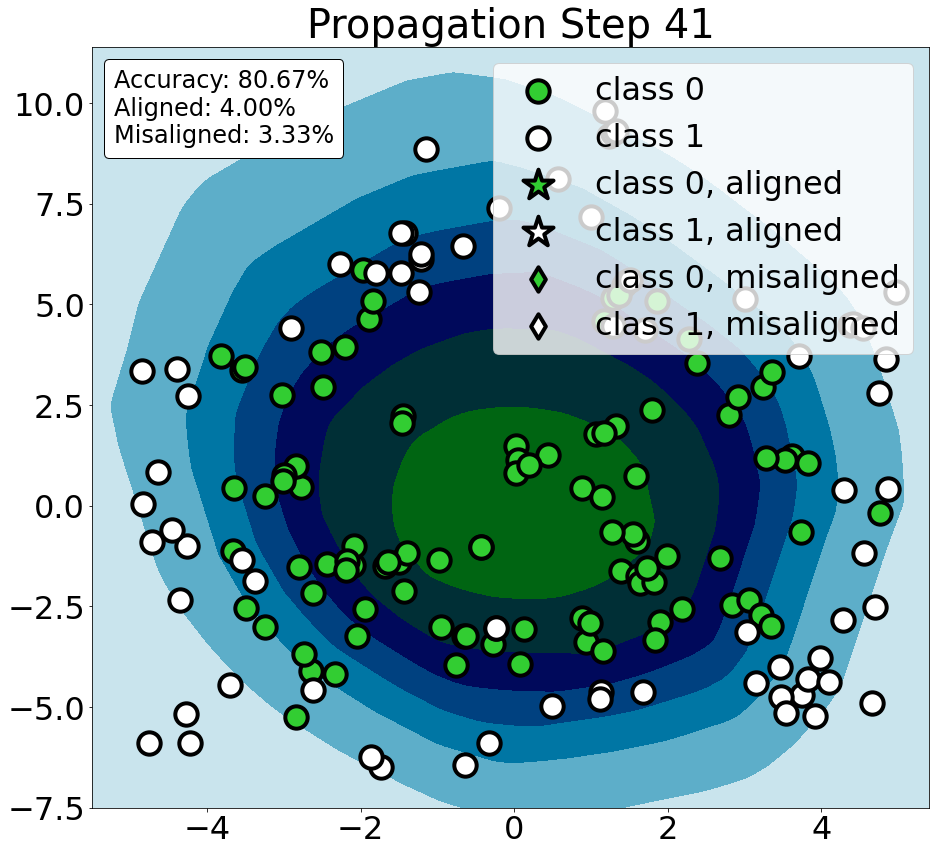

(array([351]),)
tensor([424, 475, 476])
tensor(False) tensor(False) tensor(True)
tensor([False, False, False]) tensor([False, False, False]) tensor([True, True, True])
----


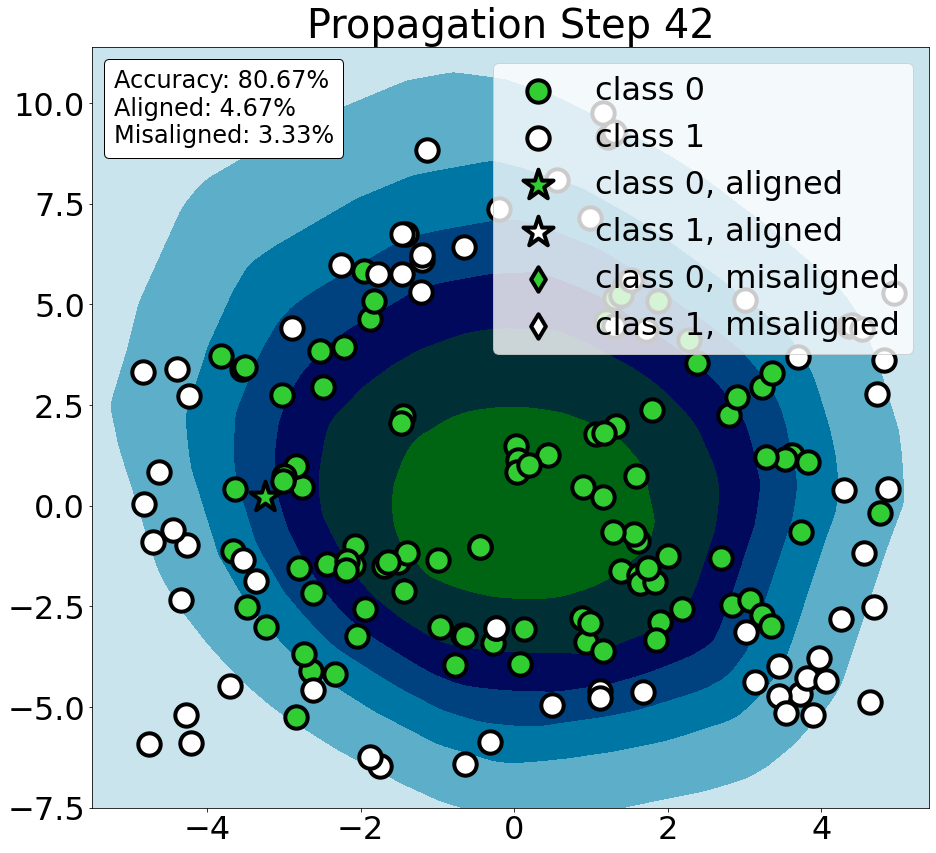

(array([], dtype=int64),)


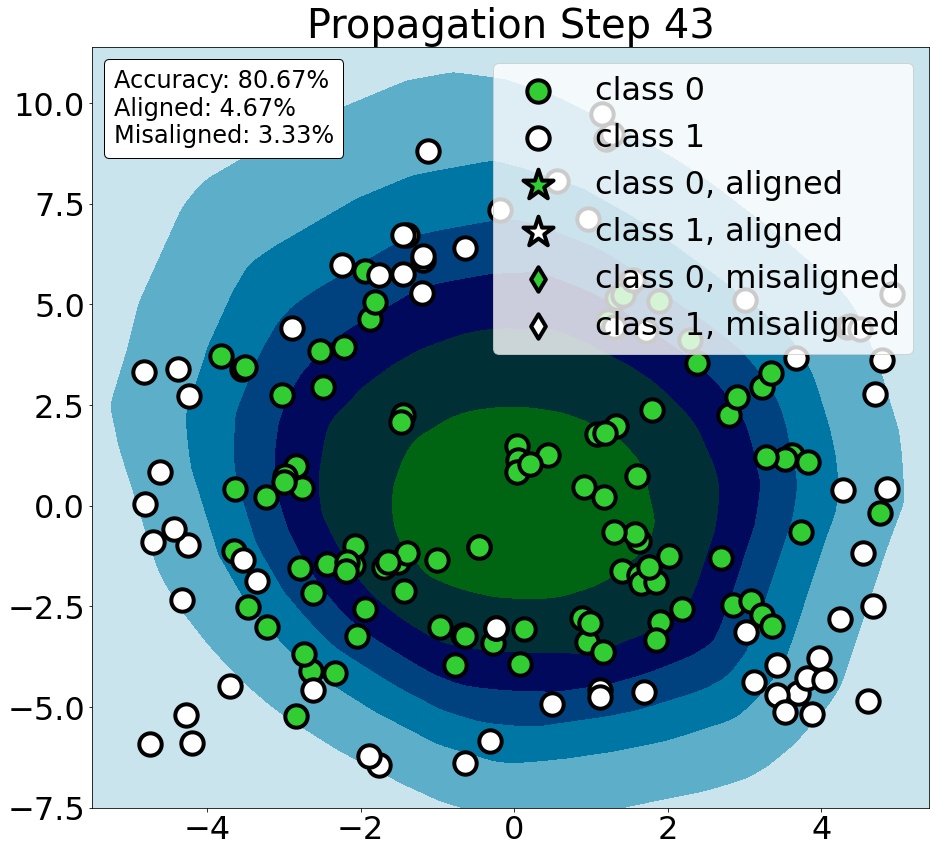

(array([], dtype=int64),)


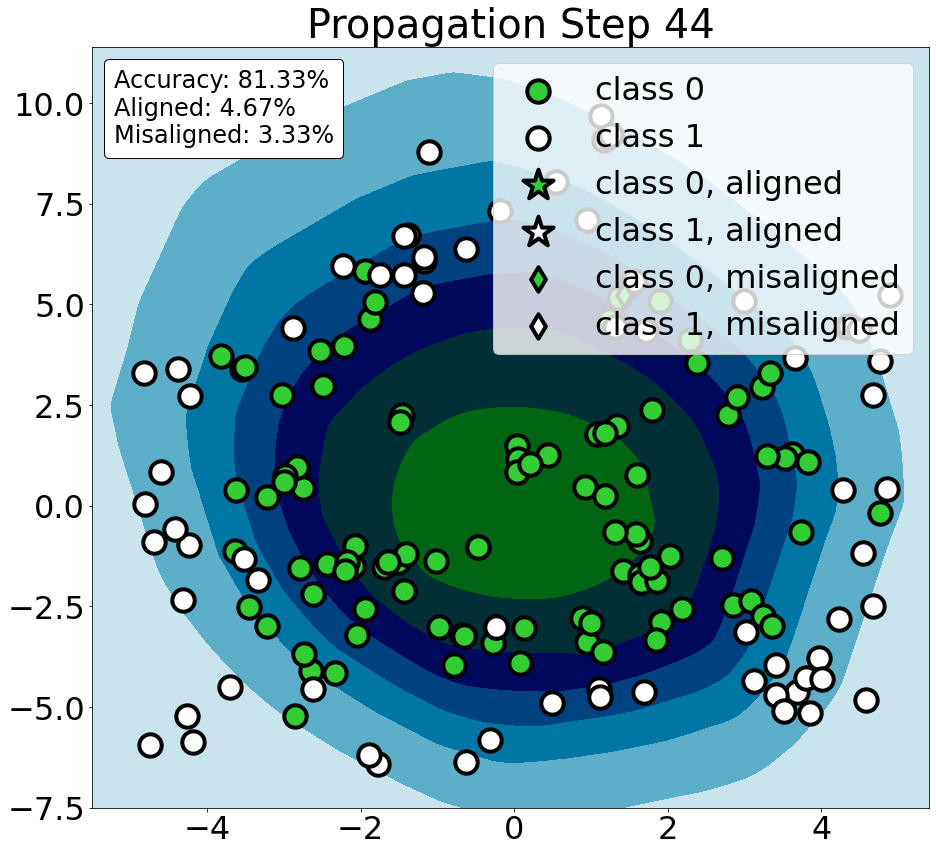

(array([], dtype=int64),)


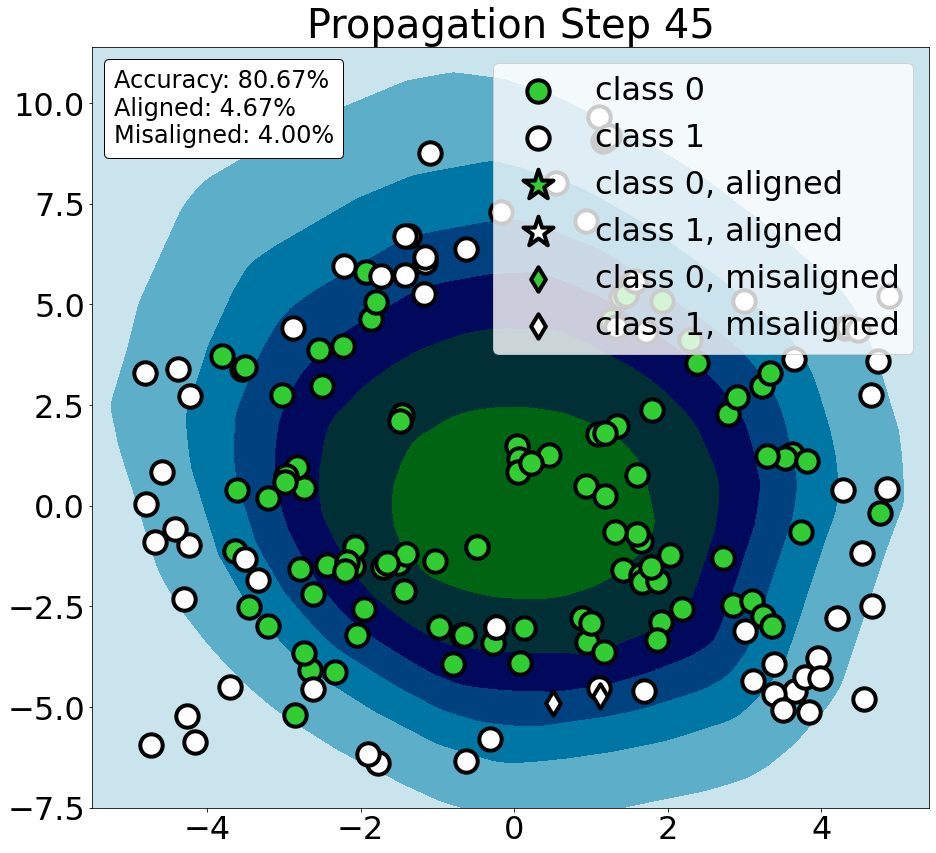

(array([], dtype=int64),)


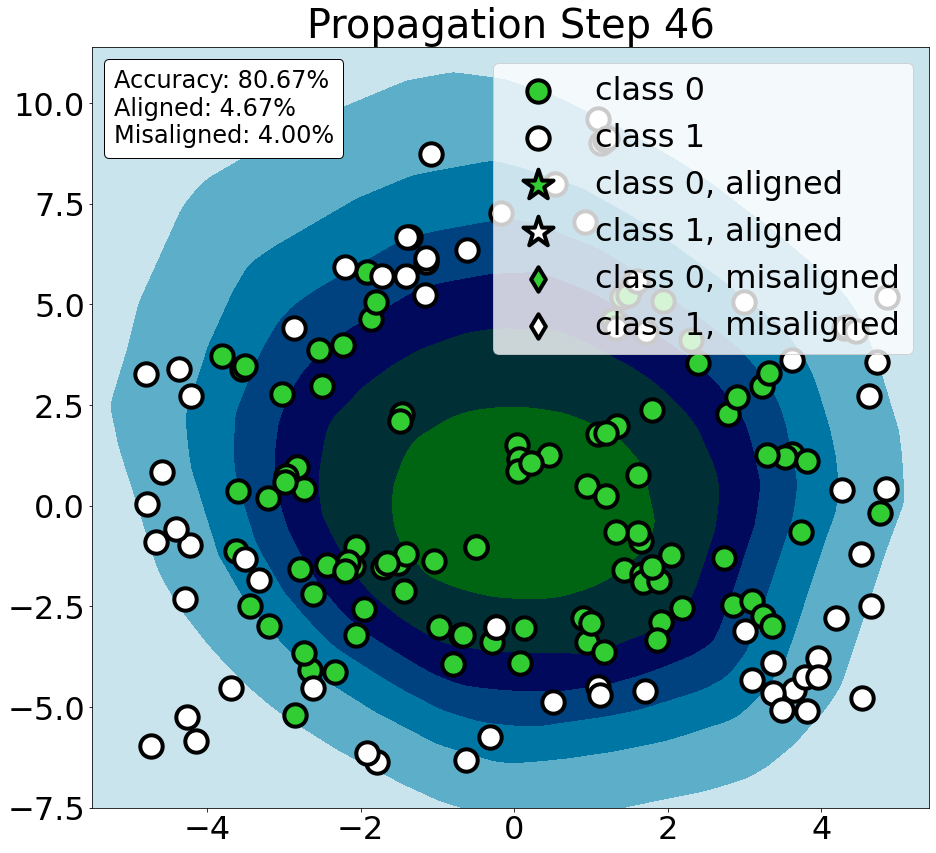

(array([], dtype=int64),)


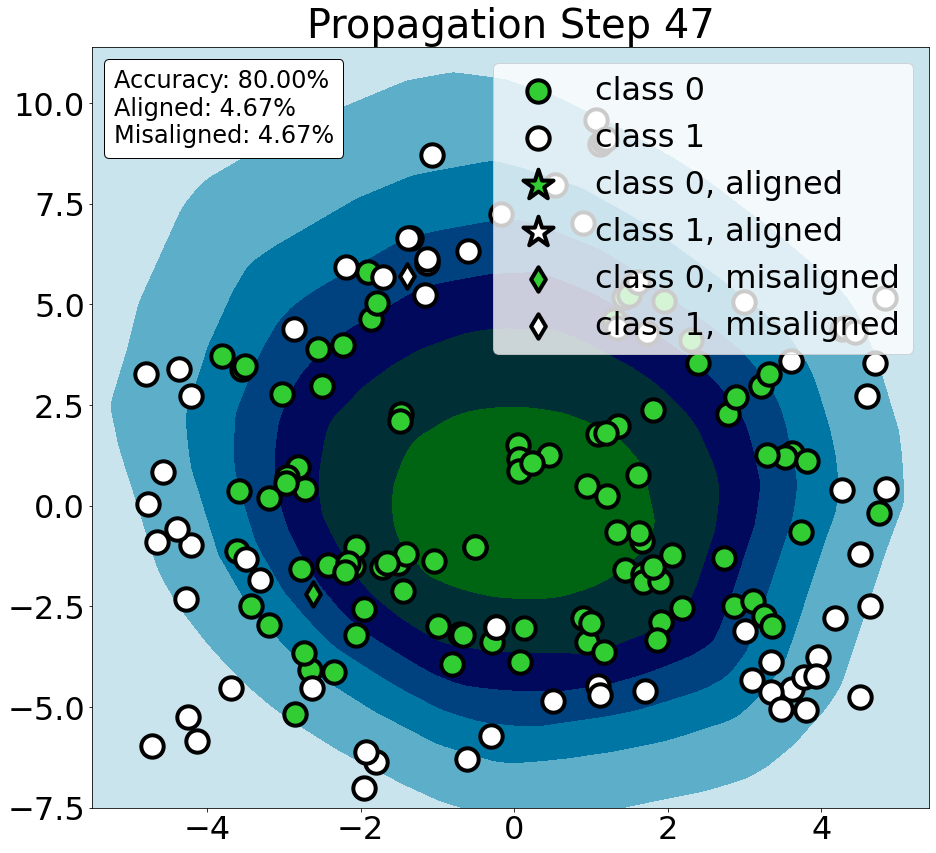

(array([], dtype=int64),)


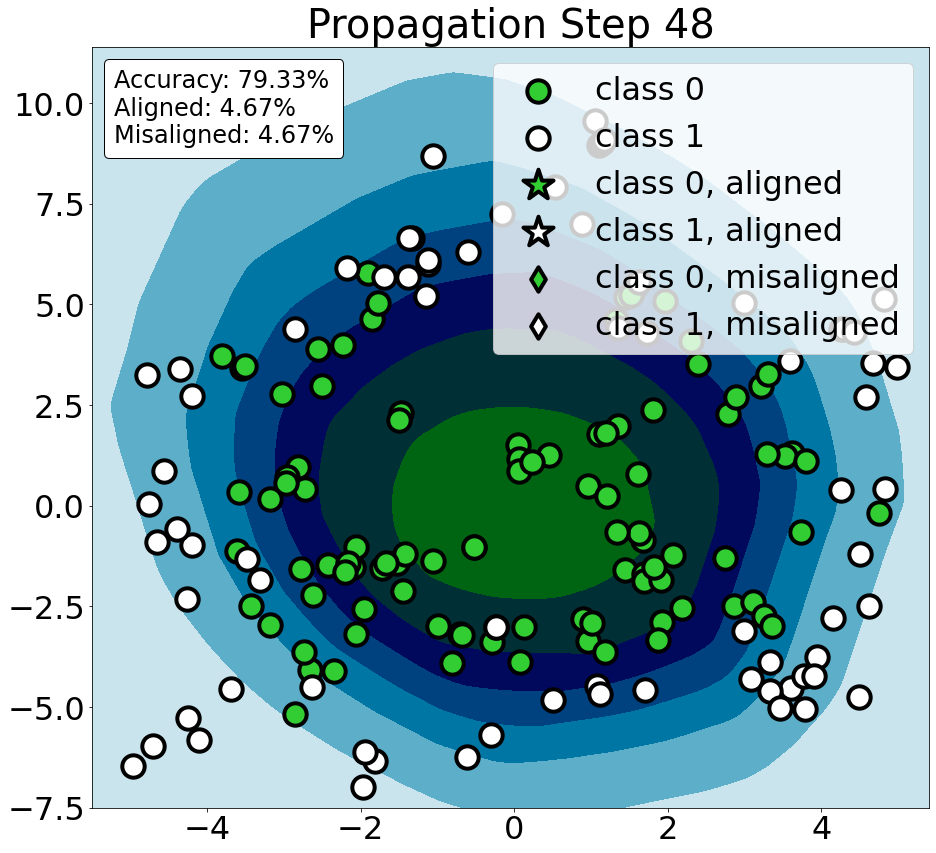

(array([], dtype=int64),)


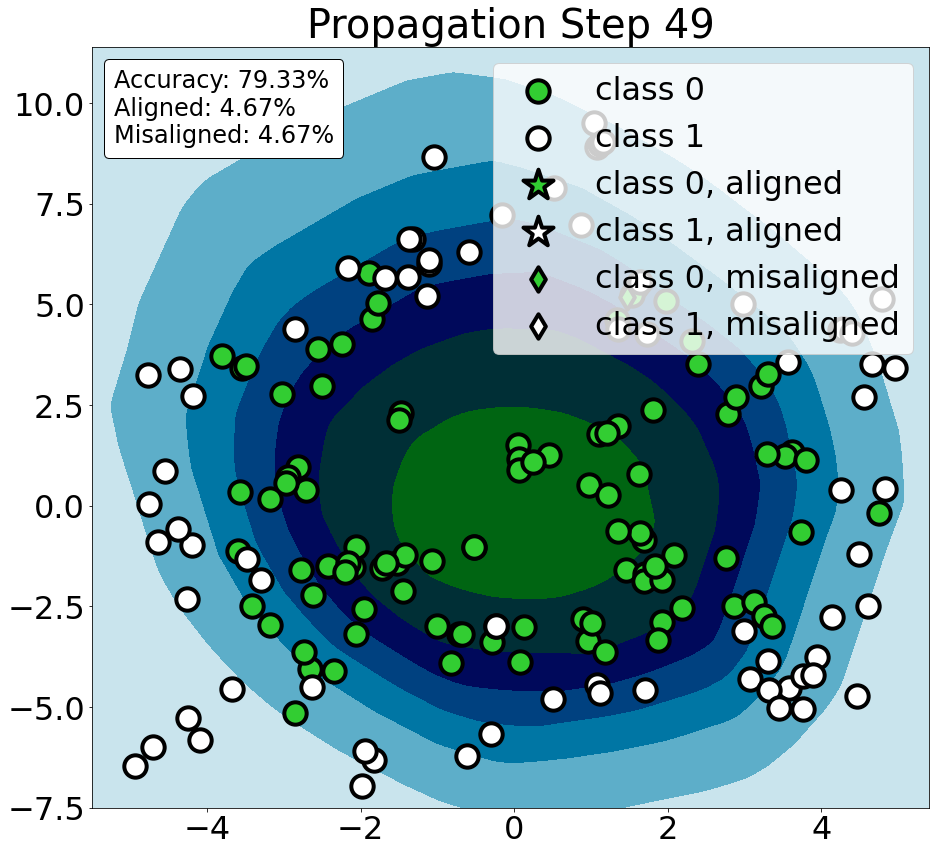

In [66]:
n_post = 50
post_props = np.arange(n_post)
pred_probs = np.zeros((dataset.num_nodes, n_post, dataset.num_classes))
x_post = copy.deepcopy(dataset.data.x)
train_accs = []
val_accs = []
test_accs = []
train_test_distance = []
train_train_distance = []
last_labels = None
shift_mask = None
static_mask = None
train_probs_init = None
x_post_prev = None
in_frame_mask = np.ones_like(x_post[:, 0])
in_frame_mask = in_frame_mask * rand_mask
align_percent = 0.0
misalign_percent = 0.0
for n_post_prop in post_props:
    in_frame_mask = ((x_post[:, 0] > boundx[0] + 0.5) * (x_post[:, 0] < boundx[1] - 0.5) * (x_post[:, 1] > boundy[0] + 0.5) * (x_post[:, 1] < boundy[1] - 0.5)).numpy() * rand_mask
    graph = copy.deepcopy(dataset.data)
    graph.x = x_post
    graph.add_remaining_self_loops()
    graph.sym_norm()
    if model_type == "mlp":
        pred = model.forward(x_post)
    else:
        pred = model.embed_without_prop(graph, len(model.layers))
    train_acc, val_acc, test_acc = eval_acc(pred, dataset, verbose=False)
    train_accs.append(train_acc)
    val_accs.append(val_acc)
    test_accs.append(test_acc)
    pred_probs[:, n_post_prop, :] = torch.softmax(pred, dim=1).detach().numpy()
    preds = pred_probs[:, n_post_prop, :]
    pred_labels = np.argmax(preds, axis=-1)
    train_probs = preds[dataset.data.train_mask][:, 0]
    test_probs = preds[dataset.data.test_mask][:, 0]
    if n_post_prop == 0:
        train_probs_init = train_probs
    else:
        train_train_distance.append(np.max(np.array([np.abs(train_probs[i] - train_probs_init[i]) for i in range(len(train_probs))])))
    max_len = min(len(train_probs), len(test_probs))
    train_test_distance.append(np.max(np.abs(preds[:, 0][(match_t - 151).astype(np.int32)] - preds[:, 0][(match_c - 1).astype(np.int32)])))
#     train_test_distance.append(np.mean(np.array([np.abs(train_probs[i] - test_probs[i]) for i in range(max_len)])))
    if last_labels is not None:
        shift_mask = (last_labels != pred_labels) * in_frame_mask
        static_mask = (last_labels == pred_labels) * in_frame_mask
    c0_mask = (dataset.data.y == 0) * in_frame_mask
    c1_mask = (dataset.data.y == 1) * in_frame_mask
    right_mask = np.equal(dataset.data.y, pred_labels).numpy() * in_frame_mask
    wrong_mask = np.not_equal(dataset.data.y, pred_labels).numpy() * in_frame_mask
    c0_c = 'limegreen'
    c1_c = 'white'
    shift_c = 'black'
    last_labels = pred_labels
    fig, ax = plt.subplots()
    plt.contourf(contour_x, contour_y, contour_Z, cmap='ocean')
    marker_size = 500
    right_size = 1000
    wrong_size = 300
    linewidth = 4
#     print(np.where(c1_mask * (dataset.data.x[:, 0] > 4.5).numpy() * (dataset.data.x[:, 1] > 2.5).numpy() * (dataset.data.x[:, 1] < 5).numpy()))
#     print(np.where(c0_mask * (dataset.data.x[:, 0] < -3).numpy() * (dataset.data.x[:, 1] > -2.5).numpy() * (dataset.data.x[:, 1] < -1.5).numpy()))
    if shift_mask is not None:
        plt.scatter(x_post[:, 0][np.where(c0_mask * static_mask)], x_post[:, 1][np.where(c0_mask * static_mask)], c=c0_c, s=marker_size, label="class 0", edgecolors="black", linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * static_mask)], x_post[:, 1][np.where(c1_mask * static_mask)], c=c1_c, s=marker_size, label="class 1", edgecolors="black", linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c0_mask * shift_mask * right_mask)], x_post[:, 1][np.where(c0_mask * shift_mask * right_mask)], c=c0_c, s=right_size, marker='*', label="class 0, aligned", edgecolors=shift_c, linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * shift_mask * right_mask)], x_post[:, 1][np.where(c1_mask * shift_mask * right_mask)], c=c1_c, s=right_size, marker='*', label="class 1, aligned", edgecolors=shift_c, linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c0_mask * shift_mask * wrong_mask)], x_post[:, 1][np.where(c0_mask * shift_mask * wrong_mask)], c=c0_c, s=wrong_size, marker='d', label="class 0, misaligned", edgecolors=shift_c, linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * shift_mask * wrong_mask)], x_post[:, 1][np.where(c1_mask * shift_mask * wrong_mask)], c=c1_c, s=wrong_size, marker='d', label="class 1, misaligned", edgecolors=shift_c, linewidth=linewidth)
#         plt.scatter(x_post[:, 0][static_mask], x_post[:, 1][static_mask], c=dataset.data.y[static_mask], cmap='ocean', s=marker_size, label="not shifted")
#         plt.scatter(x_post[:, 0][shift_mask], x_post[:, 1][shift_mask], c=dataset.data.y[shift_mask], cmap='ocean', marker='+', s=100, label="shifted")
#         plt.legend(["not shifted", "shifted"])
        align_percent += np.sum((graph.test_mask.numpy() * shift_mask * right_mask)) / torch.sum(graph.test_mask) * 100
        misalign_percent += np.sum((graph.test_mask.numpy() * shift_mask * wrong_mask)) / torch.sum(graph.test_mask) * 100
        at = AnchoredText("Accuracy: {:.2f}%\nAligned: {:.2f}%\nMisaligned: {:.2f}%".format(test_acc * 100, align_percent, misalign_percent), prop=dict(size=24), frameon=True, loc='upper left')
        at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
        ax.add_artist(at)
        aligned = np.where(shift_mask * right_mask)
        print(aligned)
        for p in aligned[0]:
            neigh = dataset.data.edge_index[0][torch.where(dataset.data.edge_index[1] == p)]
            print(neigh)
            print(dataset.data.train_mask[p], dataset.data.val_mask[p], dataset.data.test_mask[p])
            print(dataset.data.train_mask[neigh], dataset.data.val_mask[neigh], dataset.data.test_mask[neigh])
            print("----")
    else:
        plt.scatter(x_post[:, 0][np.where(c0_mask * in_frame_mask)], x_post[:, 1][np.where(c0_mask * in_frame_mask)], c=c0_c, s=marker_size, label="class 0", edgecolors="black", linewidth=linewidth)
        plt.scatter(x_post[:, 0][np.where(c1_mask * in_frame_mask)], x_post[:, 1][np.where(c1_mask * in_frame_mask)], c=c1_c, s=marker_size, label="class 1", edgecolors="black", linewidth=linewidth)
        at = AnchoredText("Accuracy: {:.2f}%".format(test_acc * 100), prop=dict(size=24), frameon=True, loc='upper left')
        at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
        ax.add_artist(at)
#         plt.scatter(x_post[:, 0], x_post[:, 1], c=dataset.data.y, cmap='ocean', s=marker_size)
#     sample = [389, 390, 394, 455]
#     sample = [37,  43, 100, 104, 112, 130]
#     sample = [104]
#     for i in sample:
#         plt.scatter(x_post[i, 0], x_post[i, 1], c="gold", marker='o', s=marker_size)
    if n_post_prop == 1:
#         sample = [37,  43, 100, 104, 394, 455]
        sample = [104, 394, 455, 467, 280, 343]
        for i in sample:
            plt.scatter(x_post_prev[i, 0], x_post_prev[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', linestyle='--', edgecolors="black", s=marker_size)
            if shift_mask[i]:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='*', edgecolors="black", s=right_size, linewidth=linewidth)
            else:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', edgecolors="black", s=marker_size, linewidth=linewidth)
            plt.arrow(x_post_prev[i, 0], x_post_prev[i, 1], x_post[i, 0] - x_post_prev[i, 0], x_post[i, 1] - x_post_prev[i, 1], width=0.03, head_width=0.2, head_length=0.2, overhang=0.3, color="red", length_includes_head=True)
    if n_post_prop == 2:
        sample = [15, 345, 389, 390]
        for i in sample:
            plt.scatter(x_post_prev[i, 0], x_post_prev[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', linestyle='--', edgecolors="black", s=marker_size)
            if shift_mask[i]:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='*', edgecolors="black", s=right_size, linewidth=linewidth)
            else:
                plt.scatter(x_post[i, 0], x_post[i, 1], c="white" if dataset.data.y[i] == 1 else "limegreen", marker='o', edgecolors="black", s=marker_size, linewidth=linewidth)
            plt.arrow(x_post_prev[i, 0], x_post_prev[i, 1], x_post[i, 0] - x_post_prev[i, 0], x_post[i, 1] - x_post_prev[i, 1], width=0.03, head_width=0.2, head_length=0.1, overhang=0.3, color="red", length_includes_head=True)
    plt.title("Propagation Step {}".format(n_post_prop), fontsize=40)
    plt.yticks(fontsize=32)
    plt.xticks(fontsize=32)
    plt.legend(fontsize=32, loc=1)
    plt.savefig("./save_figures/synthetic/synthetic_{}.png".format(n_post_prop), bbox_inches='tight')
    plt.show()
    x_post_prev = x_post
    x_post = spmm(graph, x_post)
    
    # check if there is nan in results
    if torch.isnan(pred).any() or torch.isnan(x_post).any():
        print(n_post_prop)
        break